<a href="https://colab.research.google.com/github/Eve-1978/Capstone-Project/blob/main/80_20_with_fold_Capstone2_(new).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dataset sources: https://www.kaggle.com/datasets/hemanthsai7/solar-panel-dust-detection

In [ ]:
from IPython.display import HTML, display

display(HTML("""
<script>
  function ClickConnect(){
    console.log("Ping!");
    document.querySelector("colab-toolbar-button#connect").click();
  }
  setInterval(ClickConnect, 5 * 60 * 1000);  // every 5 minutes
</script>
"""))

# **Import Libraries**

In [ ]:
!pip install seaborn
!pip install tensorflow
!pip install keras
!pip install scikit-Image
!pip install opencv-python

# Import required libraries
import pandas as pd
import numpy as np
import zipfile
import seaborn as sns
import cv2
import os
import shutil
import random
import matplotlib.pyplot as plt
import tensorflow as tf
import warnings
warnings.simplefilter("ignore")
import gc

from scipy.stats import entropy
from skimage.feature import local_binary_pattern
from skimage import filters, measure

from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import f1_score as sk_f1_score


from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras import regularizers
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB3, DenseNet121, ResNet50, MobileNetV2, VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications.efficientnet import preprocess_input


# Phase 1: Data Collection and Preprocessing

## Upload Dataset

In [ ]:
# Upload dataset
from google.colab import drive
drive.mount('/content/drive')

#unzip the file
zip_path = '/content/drive/MyDrive/Detect_solar_dust.zip'
extract_path = '/content/solar-dust-detection'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print(f"Dataset extracted to: {extract_path}")

# Point at the "inner" directory
base_dir = '/content/solar-dust-detection/Detect_solar_dust'

# Build your class-folder paths
clean_dir = os.path.join(base_dir, 'Clean')
dusty_dir = os.path.join(base_dir, 'Dusty')

print("Clean Images:", len(os.listdir(clean_dir)))
print("Dusty Images:", len(os.listdir(dusty_dir)))
print("\n==================")
print("Total Images:", len(os.listdir(clean_dir)) + len(os.listdir(dusty_dir)))

Mounted at /content/drive
Dataset extracted to: /content/solar-dust-detection
Clean Images: 1493
Dusty Images: 1069

Total Images: 2562


## Simple Data Exploration (EDA)

Exploring the data


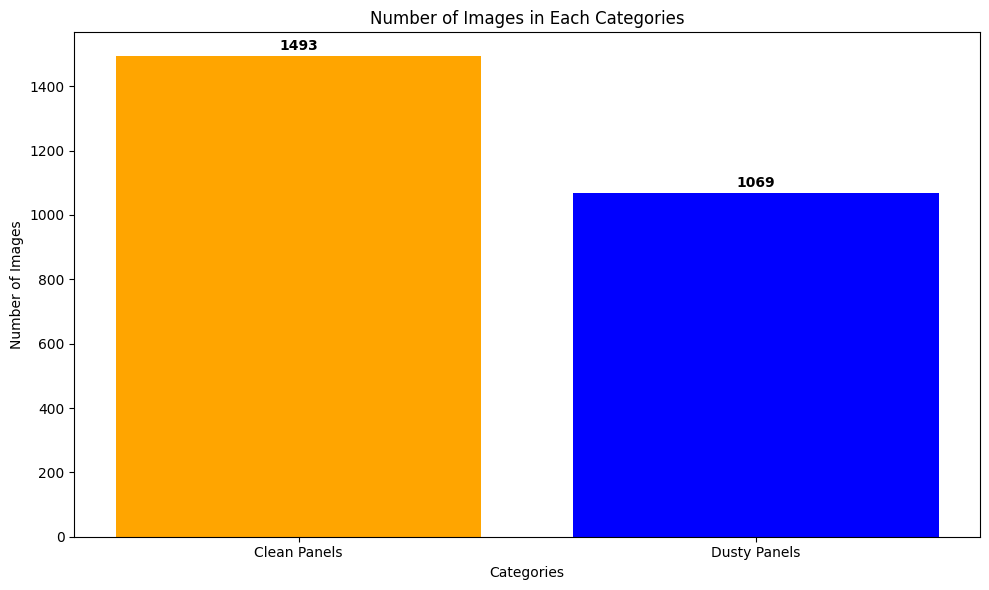

In [ ]:
# Simple Data Exploration (EDA)
print("Exploring the data")

# Create a simple barchart
categories = ['Clean Panels', 'Dusty Panels']
counts = [len(os.listdir(clean_dir)), len(os.listdir(dusty_dir))]
colors = ['orange', 'blue']

plt.figure(figsize=(10, 6))
bars = plt.bar(categories, counts, color=colors)
plt.title('Number of Images in Each Categories')
plt.xlabel('Categories')
plt.ylabel('Number of Images')

# Add numbers on top of bars
for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10,
             str(count), ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

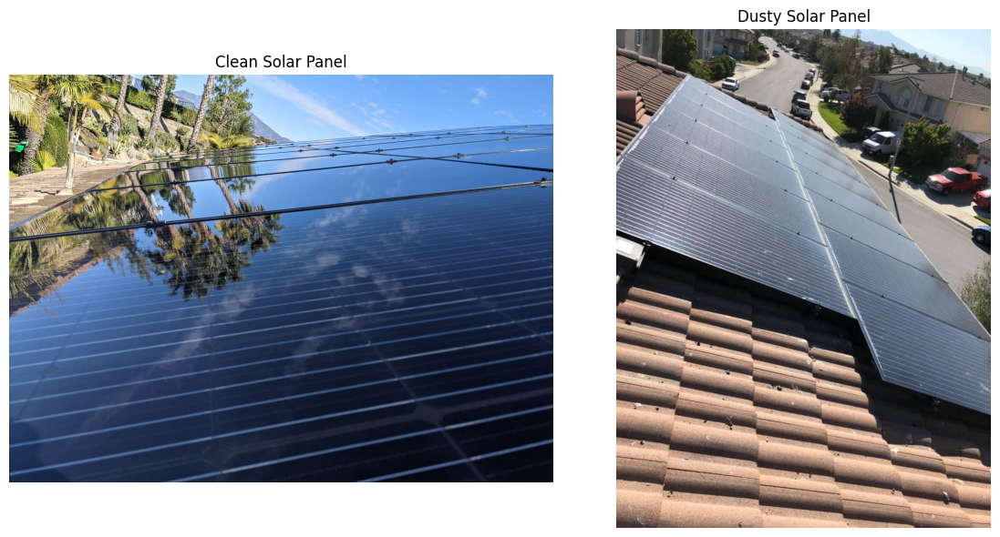

In [ ]:
# Show sample images
clean_files = os.listdir(clean_dir)
dusty_files = os.listdir(dusty_dir)

plt.figure(figsize=(12, 6))

# Clean images
plt.subplot(1, 2, 1)
clean_img = plt.imread(os.path.join(clean_dir, random.choice(clean_files)))
plt.imshow(clean_img)
plt.title('Clean Solar Panel')
plt.axis('off')

# Dusty images
plt.subplot(1, 2, 2)
dusty_img = plt.imread(os.path.join(dusty_dir, random.choice(dusty_files)))
plt.imshow(dusty_img)
plt.title('Dusty Solar Panel')
plt.axis('off')

plt.tight_layout()
plt.show()

## Data Preprocessing

#### Making main folders for train and test

In [ ]:
# Making main folders for train and test data
print("Creating train and test folders...")

# Define the paths for train and test directories within base_dir
train_dir = os.path.join(base_dir, 'train')
test_dir = os.path.join(base_dir, 'test')

os.makedirs('/content/train/Clean', exist_ok=True)
os.makedirs('/content/train/Dusty', exist_ok=True)
os.makedirs('/content/test/Clean', exist_ok=True)
os.makedirs('/content/test/Dusty', exist_ok=True)

print("\nAll folders has been created.")

Creating train and test folders...

All folders has been created.


#### Splitting images to Train & Test data

In [ ]:
def split_and_copy(src_dir, train_dir, test_dir, split_ratio=0.8):

    if not os.path.exists(src_dir) or not os.listdir(src_dir):
        print(f"Source directory '{src_dir}' is missing or empty.")
        return

    files = os.listdir(src_dir)
    np.random.shuffle(files)
    split_index = int(len(files) * split_ratio)

    train_files = files[:split_index]
    test_files = files[split_index:]

    for folder in [train_dir, test_dir]:
        if os.path.exists(folder):
            shutil.rmtree(folder)
        os.makedirs(folder)

    for f in train_files:
        shutil.copy2(os.path.join(src_dir, f), os.path.join(train_dir, f))
    for f in test_files:
        shutil.copy2(os.path.join(src_dir, f), os.path.join(test_dir, f))

split_and_copy(clean_dir, '/content/train/Clean', '/content/test/Clean')
split_and_copy(dusty_dir, '/content/train/Dusty', '/content/test/Dusty')

print("Clean images split: 80% train, 20% test:")
print(f"Train: {len(os.listdir('/content/train/Clean'))}")
print(f"Test: {len(os.listdir('/content/test/Clean'))}")

print("\nDusty images split: 80% train, 20% test")
print(f"Train: {len(os.listdir('/content/train/Dusty'))}")
print(f"Test: {len(os.listdir('/content/test/Dusty'))}")

total_train = len(os.listdir('/content/train/Clean')) + len(os.listdir('/content/train/Dusty'))
total_test = len(os.listdir('/content/test/Clean')) + len(os.listdir('/content/test/Dusty'))

print(f"\nTotal Train: {total_train}")
print(f"Total Test: {total_test}")

Clean images split: 80% train, 20% test:
Train: 1194
Test: 299

Dusty images split: 80% train, 20% test
Train: 855
Test: 214

Total Train: 2049
Total Test: 513


#### Simple Image Processing

Demonstrating image processing...


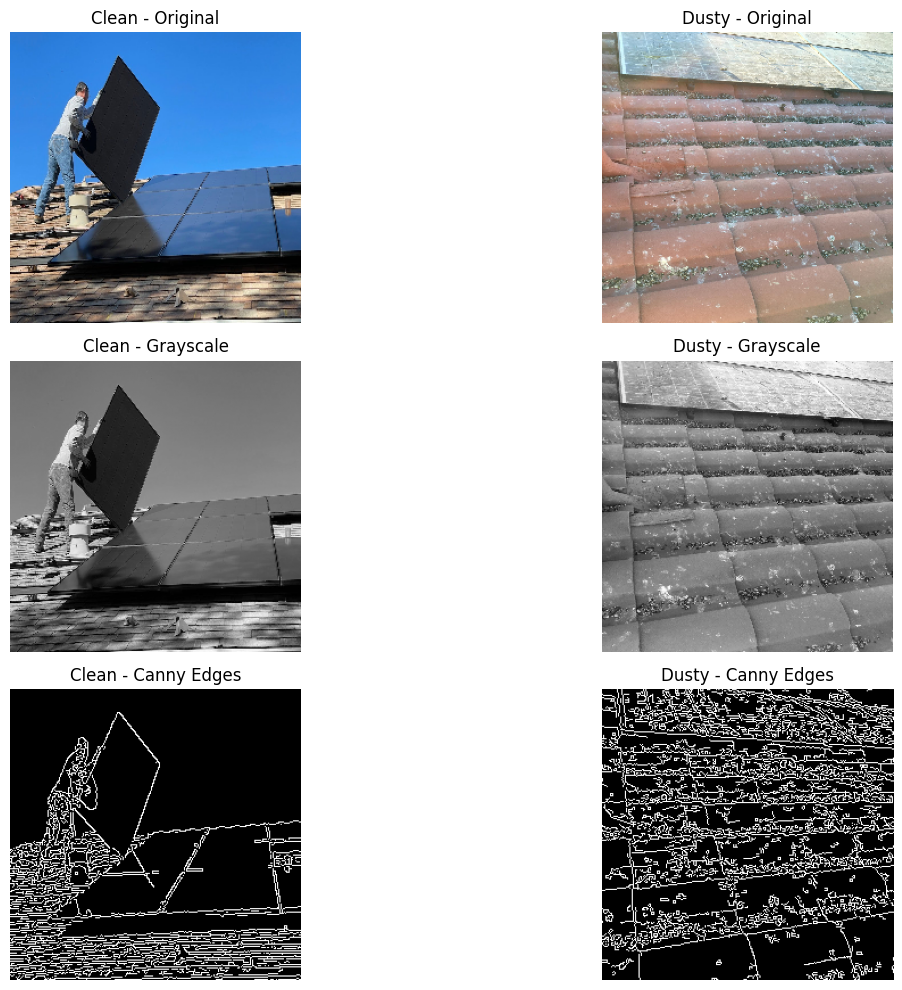

Clean Brightness: 102.90
Dusty Brightness: 153.54
Clean Edge Pixels: 8067.00
Dusty Edge Pixels: 13145.00

Image processing demonstration completed.


In [ ]:
def process_image(image_path, size=(256, 256)):
    img = plt.imread(image_path)
    img = cv2.resize(img, size)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    return img, gray, edges

def get_first_image(folder):
    files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not files:
        raise FileNotFoundError(f"No image files found in {folder}")
    return os.path.join(folder, files[0])

def show_image_processing(clean_dir, dusty_dir):
    print("Demonstrating image processing...")

    try:
        clean_path = get_first_image(clean_dir)
        dusty_path = get_first_image(dusty_dir)

        clean_img, clean_gray, clean_edges = process_image(clean_path)
        dusty_img, dusty_gray, dusty_edges = process_image(dusty_path)

        # Visualization
        images = [clean_img, dusty_img, clean_gray, dusty_gray, clean_edges, dusty_edges]
        titles = ['Clean - Original', 'Dusty - Original',
                  'Clean - Grayscale', 'Dusty - Grayscale',
                  'Clean - Canny Edges', 'Dusty - Canny Edges']

        plt.figure(figsize=(15, 10))
        for i, (img, title) in enumerate(zip(images, titles)):
            plt.subplot(3, 2, i + 1)
            cmap = 'gray' if len(img.shape) == 2 else None
            plt.imshow(img, cmap=cmap)
            plt.title(title)
            plt.axis('off')

        plt.tight_layout()
        plt.show()

        # Stats
        stats = {
            "Clean Brightness": np.mean(clean_gray),
            "Dusty Brightness": np.mean(dusty_gray),
            "Clean Edge Pixels": np.sum(clean_edges > 0),
            "Dusty Edge Pixels": np.sum(dusty_edges > 0),
        }

        for k, v in stats.items():
            print(f"{k}: {v:.2f}")

    except Exception as e:
        print(f"Error during image processing: {e}")

    print("\nImage processing demonstration completed.")

show_image_processing(clean_dir, dusty_dir)

# Phase 2: Image Processing Techniques

## Canny Edge Detection

In [ ]:
# 1. CANNY EDGE DETECTION IMPLEMENTATION

def apply_canny_edge_detection(image, low_threshold=50, high_threshold=150, blur_kernel=(5, 5)):

    if image is None:
        raise ValueError("Input image is None")
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image.copy()

    blurred = cv2.GaussianBlur(gray, blur_kernel, 0)

    # Apply Canny edge detection
    edges = cv2.Canny(blurred, low_threshold, high_threshold)

    # Calculate edge statistics for business intelligence
    total_pixels = edges.size
    edge_pixels = np.sum(edges > 0)
    edge_density = edge_pixels / total_pixels

    edge_stats = {
        'total_pixels': total_pixels,
        'edge_pixels': edge_pixels,
        'edge_density': edge_density,
        'edge_percentage': edge_density * 100
    }

    return edges, edge_stats

print("First Technique: Canny Edge Detection function has implemented.")

First Technique: Canny Edge Detection function has implemented.


## Thresholding

In [ ]:
# 2. THRESHOLDING IMPLEMENTATION

def apply_thresholding(image, method='otsu', manual_value=127):
    # Check if image is valid
    if image is None or image.size == 0:
        raise ValueError("Empty input image.")

    gray = image if len(image.shape) == 2 else cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    if method == 'otsu':
        _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    elif method == 'manual':
        _, thresh = cv2.threshold(gray, manual_value, 255, cv2.THRESH_BINARY)
    elif method == 'adaptive':
        thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                       cv2.THRESH_BINARY, 11, 2)
    else:
        raise ValueError("Unknown thresholding method.")

    dust_ratio = np.sum(thresh == 255) / thresh.size

    return thresh, {'dust_ratio': dust_ratio}

print("Second Technique: Thresholding function has implemented.")

Second Technique: Thresholding function has implemented.


## Local Binary Pattern (LBP)

In [ ]:
# 3. LOCAL BINARY PATTERN IMPLEMENTATION

def apply_lbp(image, radius=1, n_points=None):
    if n_points is None:
        n_points = 8 * radius  # Auto-scale

    if image is None:
        raise ValueError("Input image is None")

    gray = image if len(image.shape) == 2 else cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    lbp = local_binary_pattern(gray, n_points, radius, method='uniform')
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), density=True)
    lbp_entropy = entropy(hist + 1e-10)

    stats = {
        'lbp_mean': np.mean(lbp),
        'lbp_std': np.std(lbp),
        'lbp_entropy': lbp_entropy,
        'lbp_hist': hist
    }
    return lbp, stats

print("Third Technique: Local Binary Pattern function has implemented.")

Third Technique: Local Binary Pattern function has implemented.


## Combined Processing Function

In [ ]:
# COMBINED PROCESSING FUNCTION

def enhanced_preprocessing(image, canny_params={}, thresh_params={}, lbp_params={}):
    try:
        edges, edge_stats = apply_canny_edge_detection(image, **canny_params)
    except Exception as e:
        print(f"Canny failed: {e}")
        # Handle the case where image might not be grayscale yet for zeros_like
        gray_shape = image.shape[:2] if len(image.shape) == 3 else image.shape
        edges = np.zeros(gray_shape, dtype=np.uint8)
        edge_stats = {}

    try:
        thresh, thresh_stats = apply_thresholding(image, **thresh_params)
    except Exception as e:
        print(f"Thresholding failed: {e}")
        # Handle the case where image might not be grayscale yet for zeros_like
        gray_shape = image.shape[:2] if len(image.shape) == 3 else image.shape
        thresh = np.zeros(gray_shape, dtype=np.uint8)
        thresh_stats = {}

    try:
        lbp, lbp_stats = apply_lbp(image, **lbp_params)
    except Exception as e:
        print(f"LBP failed: {e}")
        # Handle the case where image might not be grayscale yet for zeros_like
        gray_shape = image.shape[:2] if len(image.shape) == 3 else image.shape
        lbp = np.zeros(gray_shape, dtype=np.float32) # LBP returns float
        lbp_stats = {}

    # Normalize channels
    # Ensure all channels have the same shape before stacking
    min_rows = min(edges.shape[0], thresh.shape[0], lbp.shape[0])
    min_cols = min(edges.shape[1], thresh.shape[1], lbp.shape[1])

    edges_resized = cv2.resize(edges.astype(np.uint8), (min_cols, min_rows)).astype(np.float32) / 255.0
    thresh_resized = cv2.resize(thresh.astype(np.uint8), (min_cols, min_rows)).astype(np.float32) / 255.0
    lbp_resized = cv2.resize(lbp.astype(np.float32), (min_cols, min_rows)).astype(np.float32) / (lbp.max() if lbp.max() > 0 else 1.0) # Normalize LBP differently if needed

    combined = np.stack([edges_resized, thresh_resized, lbp_resized], axis=-1)
    combined = combined.astype(np.float32)

    return combined, {**edge_stats, **thresh_stats, **lbp_stats}

print("Combined preprocessing function has implemented.")
print("\nAll core image processing functions are ready!")

Combined preprocessing function has implemented.

All core image processing functions are ready!


## Visualization with 3 techniques combined

EXECUTING COMPREHENSIVE DEMONSTRATION…

=== TESTING CLEAN AND DUSTY IMAGES ===
Selected: Imgclean_623_0.jpg
Selected: Imgclean_1072_0.jpg
Selected: Imgdirty_534_1.jpg
Selected: Imgdirty_197_1.jpg

Processing clean panel 1…

Applying Canny edge detection...
  Applying thresholding...
  Applying Local Binary Pattern...


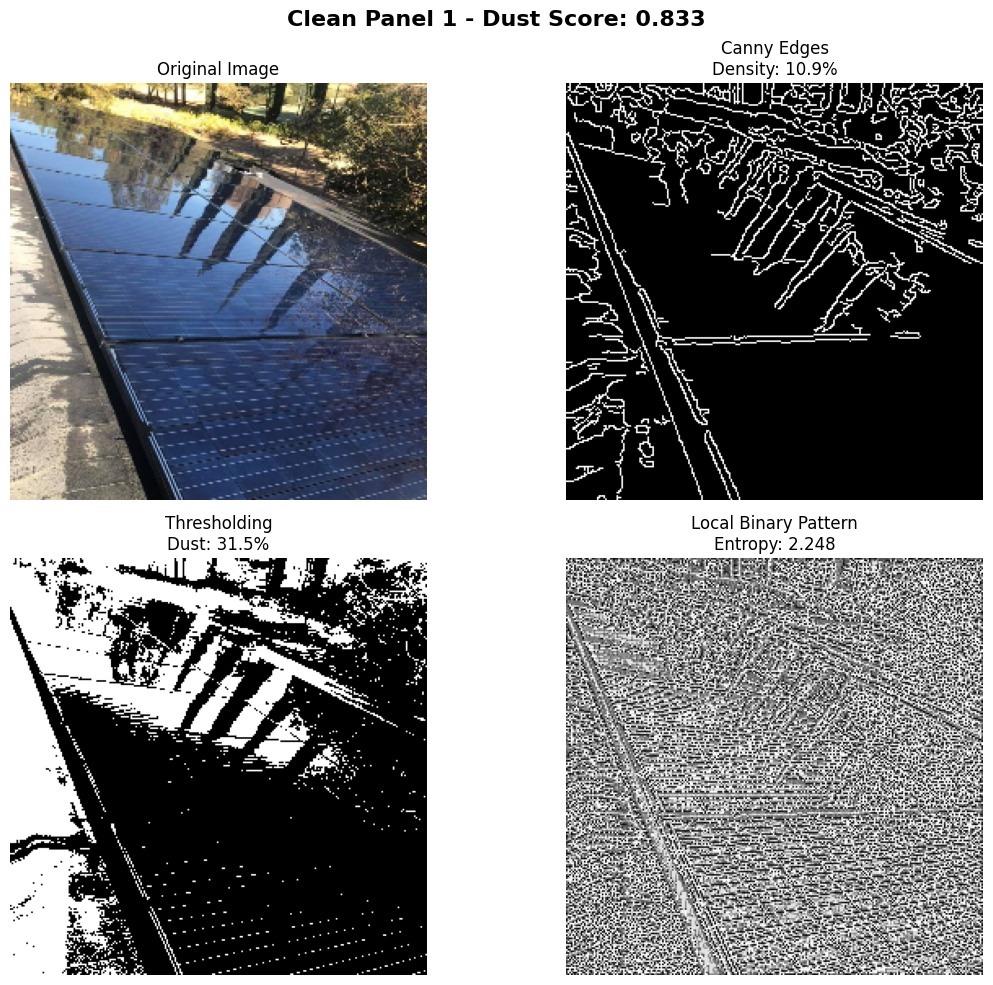


Detailed Results:
  Edge Density: 10.87%
  Dust Coverage: 31.55%
  Texture Entropy: 2.2475
  Overall Dust Score: 0.8331
  Assessment: HIGH DUST - Cleaning needed!

Processing clean panel 2…

Applying Canny edge detection...
  Applying thresholding...
  Applying Local Binary Pattern...


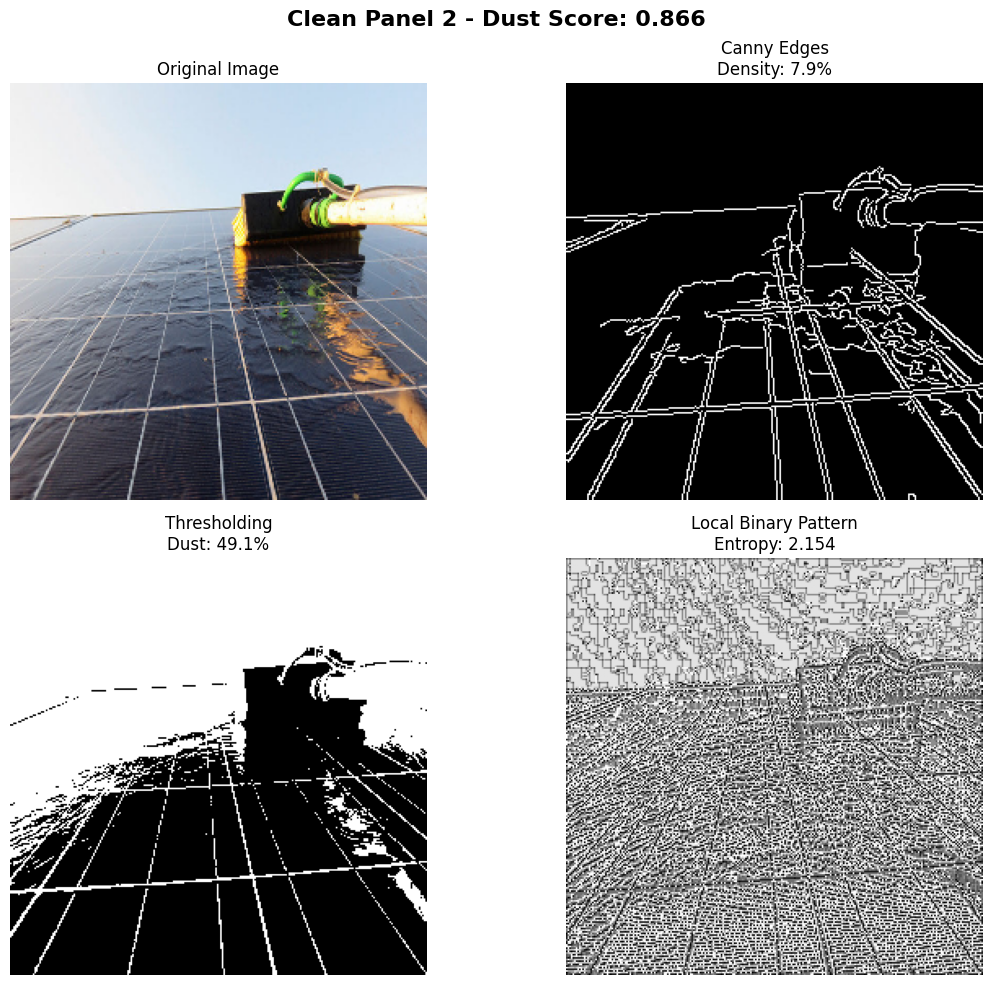


Detailed Results:
  Edge Density: 7.92%
  Dust Coverage: 49.10%
  Texture Entropy: 2.1545
  Overall Dust Score: 0.8665
  Assessment: HIGH DUST - Cleaning needed!

Processing dusty panel 1…

Applying Canny edge detection...
  Applying thresholding...
  Applying Local Binary Pattern...


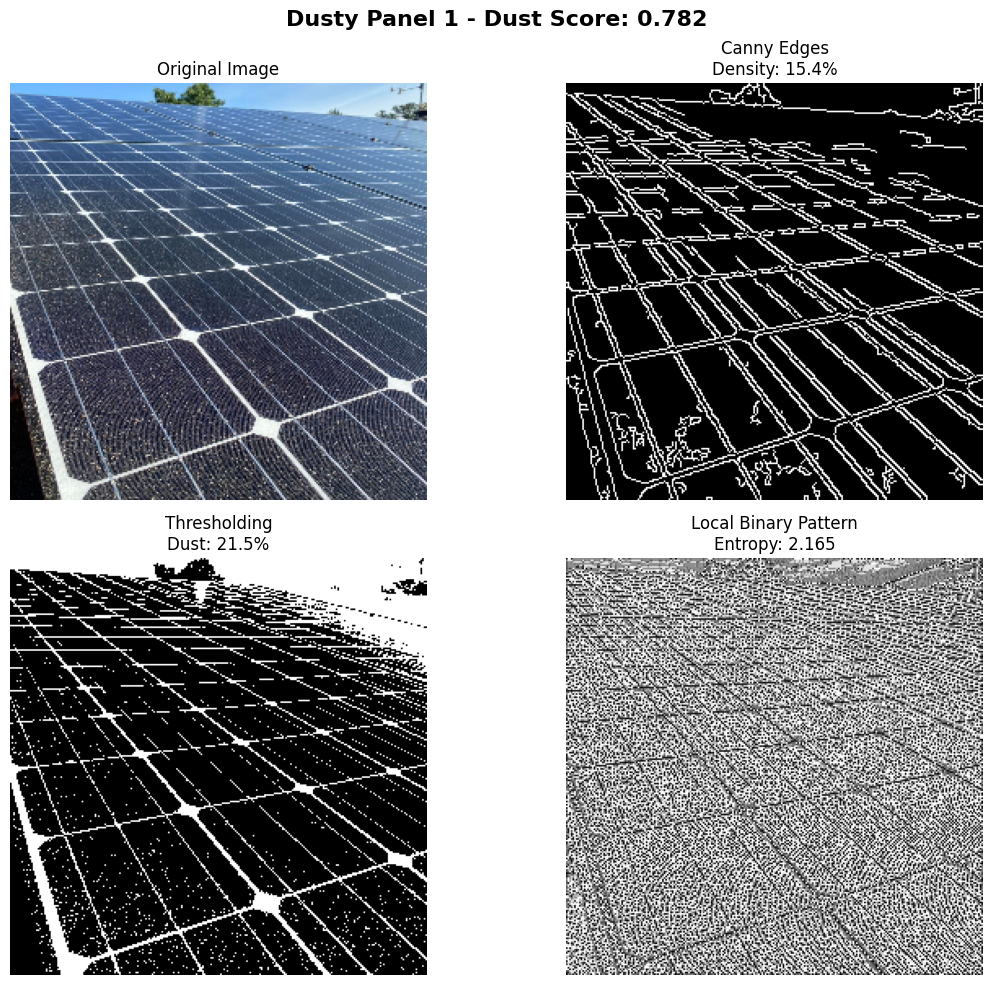


Detailed Results:
  Edge Density: 15.37%
  Dust Coverage: 21.53%
  Texture Entropy: 2.1652
  Overall Dust Score: 0.7818
  Assessment: HIGH DUST - Cleaning needed!

Processing dusty panel 2…

Applying Canny edge detection...
  Applying thresholding...
  Applying Local Binary Pattern...


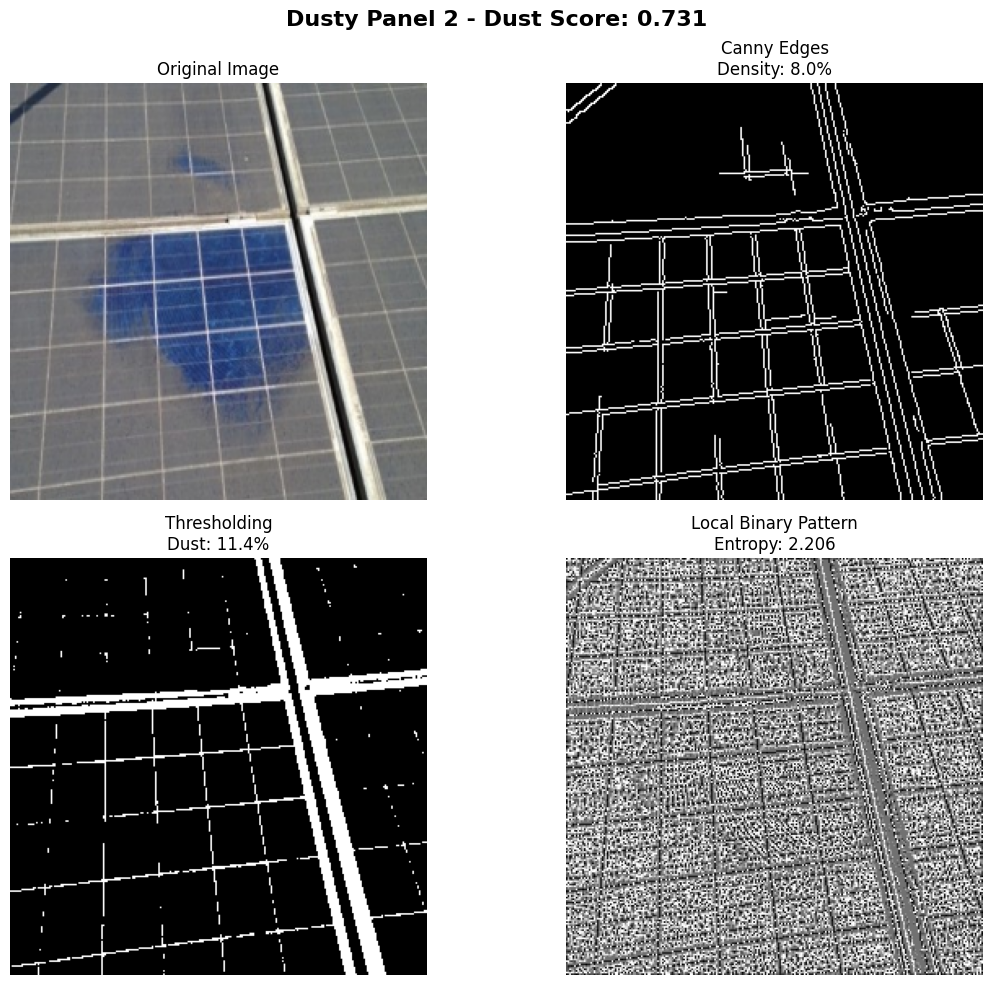


Detailed Results:
  Edge Density: 8.01%
  Dust Coverage: 11.40%
  Texture Entropy: 2.2055
  Overall Dust Score: 0.7313
  Assessment: HIGH DUST - Cleaning needed!

DEMONSTRATION COMPLETED SUCCESSFULLY!


In [ ]:
def process_single_image_complete(image):
    print("\nApplying Canny edge detection...")
    # Use the original function name
    edges, edge_stats = apply_canny_edge_detection(image)

    print("  Applying thresholding...")
    # Use the original function name
    threshold, threshold_stats = apply_thresholding(image)

    print("  Applying Local Binary Pattern...")
    # Use the original function name
    lbp, lbp_stats = apply_lbp(image)

    # Calculate combined dust score
    edge_score = edge_stats.get('edge_density', 0)
    dust_score = threshold_stats.get('dust_ratio', 0)
    # Use the correct key from lbp_stats
    texture_score = lbp_stats.get('lbp_entropy', 0)

    # Combined score (weighted average) - Adjusting weight for entropy
    overall_dust_score = (edge_score * 0.3 + dust_score * 0.4 + texture_score * 0.3)

    return {
        'original': image,
        'edges': edges,
        'threshold': threshold,
        'lbp': lbp,
        'edge_stats': edge_stats,
        'threshold_stats': threshold_stats,
        'lbp_stats': lbp_stats,
        'overall_dust_score': overall_dust_score
    }

def visualize_results_guaranteed(results, title_prefix="Solar Panel"):
    # Create the figure
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    fig.suptitle(f'{title_prefix} - Dust Score: {results["overall_dust_score"]:.3f}',
                 fontsize=16, fontweight='bold')

    # Plot original image
    axes[0, 0].imshow(results['original'])
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')

    # Plot Canny edges
    axes[0, 1].imshow(results['edges'], cmap='gray')
    # Use the correct key from edge_stats
    axes[0, 1].set_title(f'Canny Edges\nDensity: {results["edge_stats"]["edge_percentage"]:.1f}%')
    axes[0, 1].axis('off')

    # Plot threshold
    axes[1, 0].imshow(results['threshold'], cmap='gray')
    # Use the correct key from threshold_stats and display as percentage
    axes[1, 0].set_title(f'Thresholding\nDust: {results["threshold_stats"]["dust_ratio"] * 100:.1f}%')
    axes[1, 0].axis('off')

    # Plot LBP
    axes[1, 1].imshow(results['lbp'], cmap='gray')
    # Use the correct key from lbp_stats
    axes[1, 1].set_title(f'Local Binary Pattern\nEntropy: {results["lbp_stats"]["lbp_entropy"]:.3f}')
    axes[1, 1].axis('off')

    plt.tight_layout()
    plt.show()

    # Print detailed statistics
    print(f"\nDetailed Results:")
    print(f"  Edge Density: {results['edge_stats']['edge_percentage']:.2f}%")
    # Use the correct key from threshold_stats and display as percentage
    print(f"  Dust Coverage: {results['threshold_stats']['dust_ratio'] * 100:.2f}%")
    # Use the correct key from lbp_stats
    print(f"  Texture Entropy: {results['lbp_stats']['lbp_entropy']:.4f}")
    print(f"  Overall Dust Score: {results['overall_dust_score']:.4f}")

    # Assessment
    dust_score = results['overall_dust_score']
    if dust_score > 0.5:
        assessment = "HIGH DUST - Cleaning needed!"
    elif dust_score > 0.2:
        assessment = "MEDIUM DUST - Monitor closely"
    else:
        assessment = "LOW DUST - Good condition"

    print(f"  Assessment: {assessment}")

def load_image_safely(image_path):
    try:
        if not os.path.exists(image_path):
            print(f"Image file not found: {image_path}")
            return None

        image = plt.imread(image_path)

        if image is None:
            print(f"Could not load image: {image_path}")
            return None

        # Ensure image is in correct format
        if image.dtype != np.uint8:
            if image.max() <= 1.0:
                image = (image * 255).astype(np.uint8)
            else:
                image = image.astype(np.uint8)

        # Convert to RGB if grayscale
        if len(image.shape) == 2:
            image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
        elif image.shape[2] == 4: # Handle alpha channel
             image = cv2.cvtColor(image, cv2.COLOR_RGBA2RGB)


        return image

    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return None

def get_random_image_from_dir(directory, num_images=1):
    try:
        image_files = [os.path.join(directory, f)
                       for f in os.listdir(directory)
                       if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

        if not image_files:
            print(f"No image files found in: {directory}")
            return []

        np.random.shuffle(image_files)
        selected_paths = image_files[:num_images]

        images = []
        for path in selected_paths:
            img = load_image_safely(path)
            if img is not None:
                print(f"Selected: {os.path.basename(path)}")
                images.append(img)

        return images

    except Exception as e:
        print(f"Error getting random images from {directory}: {e}")
        return []

def create_sample_solar_panel():
    panel = np.zeros((256,256,3), np.uint8); panel[:,:] = (30,50,90)
    for i in range(0,256,64): panel[i:i+2,:] = panel[:,i:i+2] = (20,40,80)
    noise = np.random.randint(-10,10,panel.shape)
    return np.clip(panel.astype(int)+noise,0,255).astype(np.uint8)

def create_sample_clean_panel(): return create_sample_solar_panel()

def create_sample_dusty_panel():
    p = create_sample_solar_panel()
    for _ in range(20):
        x,y = np.random.randint(10,246,2); r=np.random.randint(5,15)
        cv2.circle(p,(x,y),r,(139,119,101),-1)
    dust = np.random.randint(0,30,p.shape,np.uint8)
    return np.clip(p.astype(int)+dust,0,255).astype(np.uint8)


def test_clean_and_dusty_images():
    print("\n=== TESTING CLEAN AND DUSTY IMAGES ===")

    clean_dirs = ["/content/train/Clean","/content/Clean"]
    dusty_dirs = ["/content/train/Dusty","/content/Dusty"]

    # clean
    clean_imgs=[]
    for d in clean_dirs:
        if os.path.exists(d):
            clean_imgs = get_random_image_from_dir(d,2); break
    if not clean_imgs: clean_imgs=[create_sample_clean_panel()]

    # dusty
    dusty_imgs=[]
    for d in dusty_dirs:
        if os.path.exists(d):
            dusty_imgs = get_random_image_from_dir(d,2); break
    if not dusty_imgs: dusty_imgs=[create_sample_dusty_panel()]

    # visualise
    for i,img in enumerate(clean_imgs,1):
        print(f"\nProcessing clean panel {i}…")
        visualize_results_guaranteed(process_single_image_complete(cv2.resize(img,(256,256))),
                                     f"Clean Panel {i}")
    for i,img in enumerate(dusty_imgs,1):
        print(f"\nProcessing dusty panel {i}…")
        visualize_results_guaranteed(process_single_image_complete(cv2.resize(img,(256,256))),
                                     f"Dusty Panel {i}")
    return True

def run_complete_demonstration():
    print("EXECUTING COMPREHENSIVE DEMONSTRATION…")
    ok1 = test_clean_and_dusty_images()
    if ok1:
        print("\nDEMONSTRATION COMPLETED SUCCESSFULLY!")

run_complete_demonstration()

# Phase 3: CNN Model Development

## Setup ImageDataGenerators



### image data generator

In [ ]:
def add_brightness(img, factor=1.2):
    img = img.astype(np.float32)
    return np.clip(img * factor, 0.0, 1.0)

def add_noise(img, std=0.05):
    noise = np.random.normal(0, std, img.shape)
    return np.clip(img + noise, 0.0, 1.0)

def hybrid_preprocessing(img):
    img = img.astype(np.float32) / 255.0  # normalize to [0, 1]

    if np.random.rand() < 0.5:
        img = add_brightness(img, factor=np.random.uniform(0.8, 1.3))

    if np.random.rand() < 0.5:
        img = add_noise(img, std=np.random.uniform(0.01, 0.1))

    if np.random.rand() < 0.3:
        img_uint8 = (img * 255).astype(np.uint8)
        img = cv2.GaussianBlur(img_uint8, (3, 3), 0).astype(np.float32) / 255.0

    return np.clip(img, 0.0, 1.0)

def create_generators(target_size, train_dir, test_dir):
    print(f"\nCreating data generators for image size: {target_size}")

    train_datagen = ImageDataGenerator(
        preprocessing_function=hybrid_preprocessing,
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.15,
        brightness_range=(0.8, 1.2),
        horizontal_flip=True,
        fill_mode='nearest'
    )

    test_datagen = ImageDataGenerator(rescale = 1./255)

    train_generator = train_datagen.flow_from_directory(
        '/content/train',
        target_size = target_size,
        class_mode = 'binary',
        shuffle=True
    )

    test_generator = test_datagen.flow_from_directory(
        '/content/test',
        target_size = target_size,
        class_mode = 'binary',
        shuffle=False
    )


    print("\n=== Data generators created ===")
    print(f"\nTraining samples: {train_generator.samples}")
    print(f"Testing samples: {test_generator.samples}")
    print(f"\n Classes: {train_generator.class_indices}")
    print(f"\n Image size set to: {target_size}")

    return train_generator, test_generator


backbone = "effi"
target_size_map = {
    "effi": (300, 300),
    "densenet": (224, 224),
    "resnet": (224, 224),
    "mobilenet": (192, 192),
    "vgg16": (224, 224)
}

def get_target_size_from_backbone():
    global backbone  # <- reference backbone set elsewhere
    if 'backbone' not in globals():
        raise NameError("The variable 'backbone' is not defined. Please define it in the model building cell.")
    if backbone not in target_size_map:
        raise ValueError(f"Backbone '{backbone}' is not in target_size_map.")
    print(f"[INFO] Using backbone: {backbone}, target size: {target_size_map[backbone]}")
    return target_size_map[backbone]

target_size = get_target_size_from_backbone()

train_dir = '/content/train'
test_dir = '/content/test'

train_generator, test_generator = create_generators(
    target_size=target_size,
    train_dir=train_dir,
    test_dir=test_dir,
)

[INFO] Using backbone: effi, target size: (300, 300)

Creating data generators for image size: (300, 300)
Found 2049 images belonging to 2 classes.
Found 513 images belonging to 2 classes.

=== Data generators created ===

Training samples: 2049
Testing samples: 513

 Classes: {'Clean': 0, 'Dusty': 1}

 Image size set to: (300, 300)


### EDA

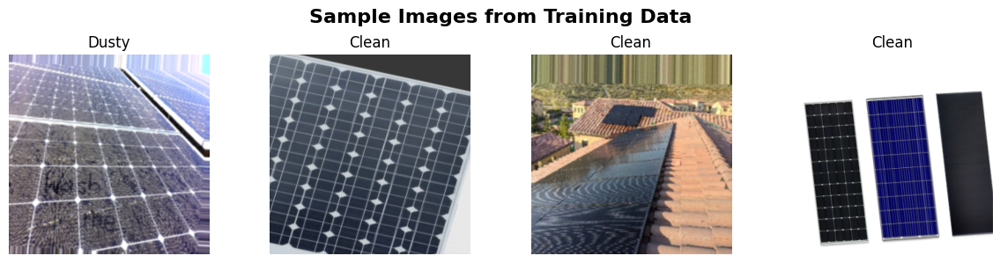

In [ ]:
# Visualize some sample images
train_generator.seed = 42
np.random.seed(42)

sample_images, sample_labels = next(train_generator)

fig, axes = plt.subplots(1, 4, figsize=(12, 3))
n = min(4, len(sample_images))

for i in range(n):
    img = sample_images[i]
    img = np.clip(img, 0, 1)  # ensure safe range
    axes[i].imshow(img)
    label = "Dusty" if sample_labels[i] == 1 else "Clean"
    axes[i].set_title(f"{label}")
    axes[i].axis('off')

plt.suptitle('Sample Images from Training Data', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


## Class Weight Calculation

Calculating class weights and visualizing...

Dataset Summary:
 - Class 'Clean': 1493 samples (58.3%)
 - Class 'Dusty': 1069 samples (41.7%)
 = Class Imbalance Ratio: 1.40:1

 Calculated Class Weights:
 - Class 'Clean': 0.8580
 - Class 'Dusty': 1.1983


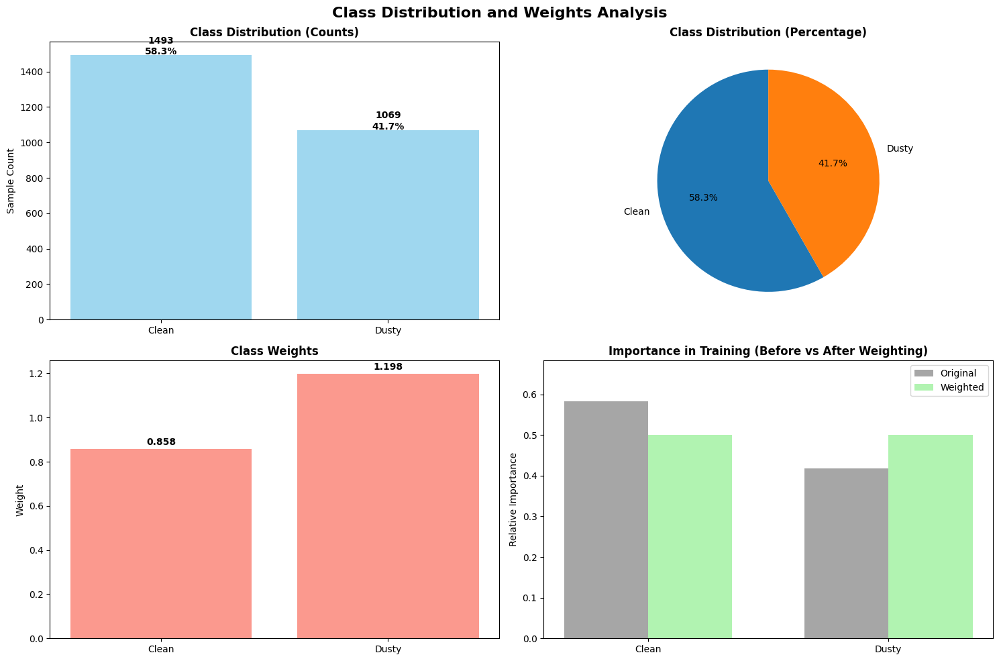

In [ ]:
def calculate_class_weights_and_visualize(base_dir):
    print("Calculating class weights and visualizing...")
    class_folders = sorted([d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))])
    if not class_folders:
        print(f"Error: No class folders found in {base_dir}")
        return None, None

    counts = []
    for folder in class_folders:
        folder_path = os.path.join(base_dir, folder)
        count = len([f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        counts.append(count)

    # Create y_labels array for class weights calculation
    y_labels = []
    for i, count in enumerate(counts):
        y_labels.extend([i] * count)
    y_labels = np.array(y_labels)

    # Compute class weights
    class_weights = compute_class_weight('balanced',
                                         classes=np.unique(y_labels),
                                         y=y_labels)
    class_weights_dict = {i: w for i, w in enumerate(class_weights)}

    # Print Summary
    total = sum(counts)
    print(f"\nDataset Summary:")
    for i, name in enumerate(class_folders):
        print(f" - Class '{name}': {counts[i]} samples ({counts[i]/total * 100:.1f}%)")
    print(f" = Class Imbalance Ratio: {max(counts) / max(1, min(counts)):.2f}:1")

    print(f"\n Calculated Class Weights:")
    for i, weight in enumerate(class_weights):
        print(f" - Class '{class_folders[i]}': {weight:.4f}")

    # Visualization
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle('Class Distribution and Weights Analysis', fontsize = 16, fontweight = 'bold')

    # Bar chart of class distribution
    bars = axes[0, 0].bar(class_folders, counts, color='skyblue', alpha=0.8)
    axes[0, 0].set_title('Class Distribution (Counts)', fontweight='bold')
    axes[0, 0].set_ylabel('Sample Count')
    for bar, count in zip(bars, counts):
        axes[0, 0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5,
                        f"{count}\n{(count/total)*100:.1f}%", ha='center', fontweight='bold')

    # Pie chart
    axes[0, 1].pie(counts, labels=class_folders, autopct='%1.1f%%', startangle=90)
    axes[0, 1].set_title('Class Distribution (Percentage)', fontweight='bold')

    # Class weights bar chart
    weight_values = list(class_weights_dict.values())
    bars = axes[1, 0].bar(class_folders, weight_values, color='salmon', alpha=0.8)
    axes[1, 0].set_title('Class Weights', fontweight='bold')
    axes[1, 0].set_ylabel('Weight')
    for bar, weight in zip(bars, weight_values):
        axes[1, 0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                        f'{weight:.3f}', ha='center', va='bottom', fontweight='bold')

    # Simulated training importance
    x = np.arange(len(class_folders))
    width = 0.35
    original_importance = [c/total for c in counts]
    balanced_importance = [1/len(class_folders)] * len(class_folders)

    bars1 = axes[1, 1].bar(x - width/2, original_importance, width, label='Original', color='gray', alpha=0.7)
    bars2 = axes[1, 1].bar(x + width/2, balanced_importance, width, label='Weighted', color='lightgreen', alpha=0.7)

    axes[1, 1].set_title('Importance in Training (Before vs After Weighting)', fontweight='bold')
    axes[1, 1].set_xticks(x)
    axes[1, 1].set_xticklabels(class_folders)
    axes[1, 1].set_ylabel('Relative Importance')
    axes[1, 1].legend()
    axes[1, 1].set_ylim(0, max(original_importance + balanced_importance) + 0.1)

    plt.tight_layout()
    plt.show()

    return class_weights_dict, y_labels

calculated_class_weights_dict, _ = calculate_class_weights_and_visualize(base_dir)

## 1st Model: EfficientNetB3

### Pre-trained EfficientNetB3

In [ ]:
print("=== CNN MODEL DEVELOPMENT ===")
print("\nBuilding EfficientNetB3 Pre-train Model...")

backbone = "effi"
target_size = target_size_map[backbone]
input_shape = target_size + (3,)

# Create generators for the current size
train_generator_current, test_generator_current = create_generators(
    target_size, train_dir, test_dir
)

if train_generator_current.samples == 0:
    print("Error: Train generator is empty. No images found in the training directory.")
    # Add more specific directory check
    train_clean_count = len(os.listdir(os.path.join(train_dir, 'Clean'))) if os.path.exists(os.path.join(train_dir, 'Clean')) else 0
    train_dusty_count = len(os.listdir(os.path.join(train_dir, 'Dusty'))) if os.path.exists(os.path.join(train_dir, 'Dusty')) else 0
    print(f"  Images found in {os.path.join(train_dir, 'Clean')}: {train_clean_count}")
    print(f"  Images found in {os.path.join(train_dir, 'Dusty')}: {train_dusty_count}")
    if train_clean_count + train_dusty_count == 0:
         print("  Train directories appear empty. Re-run data splitting steps.")
    raise ValueError("Train generator is empty. Cannot proceed with training.")

if test_generator_current.samples == 0:
    print("Error: Test generator is empty. No images found in the testing directory.")
    test_clean_count = len(os.listdir(os.path.join(test_dir, 'Clean'))) if os.path.exists(os.path.join(test_dir, 'Clean')) else 0
    test_dusty_count = len(os.listdir(os.path.join(test_dir, 'Dusty'))) if os.path.exists(os.path.join(test_dir, 'Dusty')) else 0
    print(f"  Images found in {os.path.join(test_dir, 'Clean')}: {test_clean_count}")
    print(f"  Images found in {os.path.join(test_dir, 'Dusty')}: {test_dusty_count}")
    if test_clean_count + test_dusty_count == 0:
         print("  Test directories appear empty. Re-run data splitting steps.")

def f1_score(y_true, y_pred):
    y_pred = K.round(y_pred)  # Round predicted probabilities to 0 or 1

    tp = K.sum(K.cast(y_true * y_pred, 'float32'))  # True positives
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float32'))  # False positives
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float32'))  # False negatives

    precision = tp / (tp + fp + K.epsilon())  # Add epsilon to avoid division by 0
    recall = tp / (tp + fn + K.epsilon())

    f1 = 2 * precision * recall / (precision + recall + K.epsilon())
    return f1

pre_effi_model = Sequential([
    EfficientNetB3(weights='imagenet',
                   include_top = False,
                   input_shape = input_shape),
    GlobalAveragePooling2D(),
    Dense(128, activation = 'relu'),
    Dense(1, activation = 'sigmoid')
])

# Freeze the pre-trained model initially
pre_effi_model.layers[0].trainable = False

pre_effi_model.compile(optimizer = Adam(learning_rate = 0.0001),
                       loss='binary_crossentropy',
                       metrics=['accuracy', f1_score])

print("EfficientNetB3 model has been built.\n")
pre_effi_model.summary()

=== CNN MODEL DEVELOPMENT ===

Building EfficientNetB3 Pre-train Model...

Creating data generators for image size: (300, 300)
Found 2049 images belonging to 2 classes.
Found 513 images belonging to 2 classes.

=== Data generators created ===

Training samples: 2049
Testing samples: 513

 Classes: {'Clean': 0, 'Dusty': 1}

 Image size set to: (300, 300)
43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
EfficientNetB3 model has been built.



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb3 (Functional)     │ (None, 10, 10, 1536)   │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       196,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,980,400 (41.89 MB)

 Trainable params: 196,865 (769.00 KB)

 Non-trainable params: 10,783,535 (41.14 MB)

In [ ]:
history = pre_effi_model.fit(
    train_generator_current,
    validation_data = test_generator_current,
    epochs = 5,
    batch_size = 8,
    class_weight = calculated_class_weights_dict
)

Epoch 1/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 160s 2s/step - accuracy: 0.5353 - f1_score: 0.2327 - loss: 0.6917 - val_accuracy: 0.4191 - val_f1_score: 0.4559 - val_loss: 0.7025
Epoch 2/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 99s 2s/step - accuracy: 0.5550 - f1_score: 0.1702 - loss: 0.6941 - val_accuracy: 0.4133 - val_f1_score: 0.4559 - val_loss: 0.7087
Epoch 3/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - accuracy: 0.4858 - f1_score: 0.3777 - loss: 0.6946 - val_accuracy: 0.4250 - val_f1_score: 0.4423 - val_loss: 0.6973
Epoch 4/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 100s 2s/step - accuracy: 0.4751 - f1_score: 0.5303 - loss: 0.6975 - val_accuracy: 0.5828 - val_f1_score: 0.0107 - val_loss: 0.6886
Epoch 5/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 103s 2s/step - accuracy: 0.4733 - f1_score: 0.4601 - loss: 0.6948 - val_accuracy: 0.4172 - val_f1_score: 0.4443 - val_loss: 0.6961


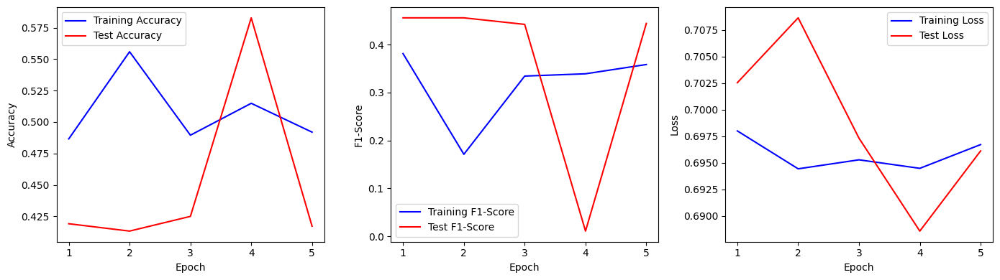

In [ ]:
# Plotting EfficientNetB3 pre-trained model
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
f1_score = history.history['f1_score']
val_f1_score = history.history['val_f1_score']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(accuracy) + 1)

# Creating subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 4))

axes[0].plot(epochs, accuracy, 'b', label='Training Accuracy')
axes[0].plot(epochs, val_accuracy, 'r', label='Test Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(epochs, f1_score, 'b', label='Training F1-Score')
axes[1].plot(epochs, val_f1_score, 'r', label='Test F1-Score')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('F1-Score')
axes[1].legend()

axes[2].plot(epochs, loss, 'b', label='Training Loss')
axes[2].plot(epochs, val_loss, 'r', label='Test Loss')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].legend()

# Adjusting layout for better spacing
plt.tight_layout()

# Display the figure
plt.show()


In [ ]:
#Classification Report
test_loss, test_acc, test_f1 = pre_effi_model.evaluate(test_generator_current, verbose=0)

test_generator_current.reset()
predictions = pre_effi_model.predict(test_generator_current, verbose=0)
y_pred = (predictions > 0.5).astype(int).flatten()
y_true = test_generator_current.classes

# Calculate metrics
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = sk_f1_score(y_true, y_pred)

print(f"\nResults:")
print(f"  Test Accuracy: {test_acc * 100:.2f}%")
print(f"  Test Loss: {test_loss:.4f}")
print(f"  Precision: {precision:.4f}")
print(f"  Recall: {recall:.4f}")
print(f"  F1-Score: {f1:.4f}")

model_results = []

# Store results - MOVED INSIDE THE LOOP
model_results.append({
    'accuracy': test_acc,
    'loss': test_loss,
    'precision': precision,
    'recall': recall,
    'f1_score': f1,
    'history': history
})

print('\nClassification Report (Pre-trained):')
print(classification_report(y_true, y_pred, target_names=['Clean', 'Dusty']))

# Calculate final results
print("\nEFFICIENTNETB3 RESULTS")

# Extract all metrics
accuracies = model_results[0]['accuracy']
precisions = model_results[0]['precision']
recalls = model_results[0]['recall']
f1_scores = model_results[0]['f1_score']


# Calculate means and standard deviations
mean_acc = np.mean(accuracies)
std_acc = np.std(accuracies)
mean_precision = np.mean(precisions)
std_precision = np.std(precisions)
mean_recall = np.mean(recalls)
std_recall = np.std(recalls)
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)

# Print results
print(f"\nMean Test Accuracy: {mean_acc * 100:.2f}% ± {std_acc * 100:.2f}%")
print(f"Mean Precision: {mean_precision:.4f} ± {std_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f} ± {std_recall:.4f}")
print(f"Mean F1-Score: {mean_f1:.4f} ± {std_f1:.4f}")


Results:
  Test Accuracy: 41.72%
  Test Loss: 0.6961
  Precision: 0.4120
  Recall: 0.9299
  F1-Score: 0.5710

Classification Report (Pre-trained):
              precision    recall  f1-score   support

       Clean       0.50      0.05      0.09       299
       Dusty       0.41      0.93      0.57       214

    accuracy                           0.42       513
   macro avg       0.46      0.49      0.33       513
weighted avg       0.46      0.42      0.29       513


EFFICIENTNETB3 RESULTS

Mean Test Accuracy: 41.72% ± 0.00%
Mean Precision: 0.4120 ± 0.0000
Mean Recall: 0.9299 ± 0.0000
Mean F1-Score: 0.5710 ± 0.0000


17/17 ━━━━━━━━━━━━━━━━━━━━ 12s 689ms/step

Final Classification Report (EfficientNetB3):
              precision    recall  f1-score   support

       Clean       0.50      0.05      0.09       299
       Dusty       0.41      0.93      0.57       214

    accuracy                           0.42       513
   macro avg       0.46      0.49      0.33       513
weighted avg       0.46      0.42      0.29       513



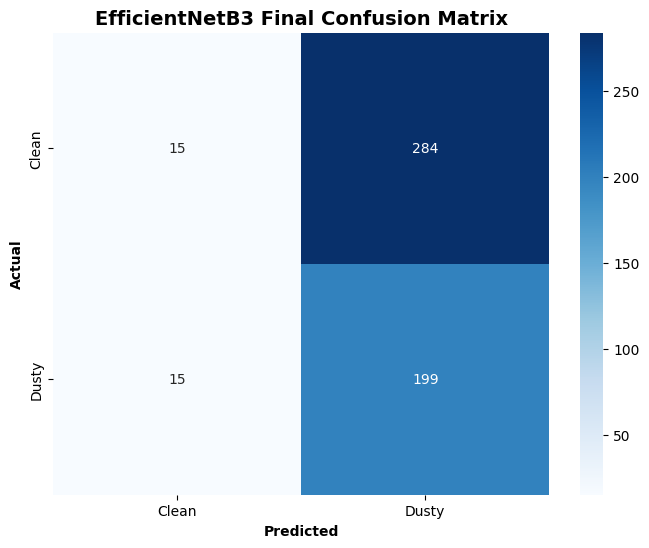

In [ ]:
# Final confusion matrix on the last trained model
test_generator_current.reset()
final_predictions = pre_effi_model.predict(test_generator_current)
y_pred_final = (final_predictions > 0.5).astype(int).flatten()
y_true_final = test_generator_current.classes

print('\nFinal Classification Report (EfficientNetB3):')
print(classification_report(y_true_final, y_pred_final, target_names=['Clean', 'Dusty']))

# Confusion Matrix

cm = confusion_matrix(y_true_final, y_pred_final)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Clean', 'Dusty'],
            yticklabels=['Clean', 'Dusty'])
plt.title('EfficientNetB3 Final Confusion Matrix', fontsize=14, fontweight='bold')
plt.xlabel('Predicted', fontweight='bold')
plt.ylabel('Actual', fontweight='bold')
plt.show()

### Hyperparameter Tuning for EfficientNetB3

In [ ]:
print("=== CNN MODEL DEVELOPMENT WITH 5-FOLD CROSS-VALIDATION ===")
print("\nGetting all generator data for EfficientNetB3...")

backbone = "effi"
target_size = target_size_map[backbone]
input_shape = target_size + (3,)

# Create generators for the current size
train_generator_current, test_generator_current = create_generators(
    target_size, train_dir, test_dir
)
# Gather all data from train_generator
train_generator_current.reset()
all_images, all_labels = [], []


print("Loading all data from generator...")
for i in range(len(train_generator_current)):
    x_batch, y_batch = train_generator_current[i]
    all_images.append(x_batch)
    all_labels.extend(y_batch)

X_all = np.vstack(all_images)
y_all = np.array(all_labels)

print(f"Total data shape: {X_all.shape}, Labels shape: {y_all.shape}")


# Check for any issues with the data
if len(X_all) == 0:
    raise ValueError("No training data found!")
if len(np.unique(y_all)) < 2:
    raise ValueError("Only one class found in labels!")

def f1_score(y_true, y_pred):
    y_pred = K.round(y_pred)  # Round predicted probabilities to 0 or 1

    tp = K.sum(K.cast(y_true * y_pred, 'float32'))  # True positives
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float32'))  # False positives
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float32'))  # False negatives

    precision = tp / (tp + fp + K.epsilon())  # Add epsilon to avoid division by 0
    recall = tp / (tp + fn + K.epsilon())

    f1 = 2 * precision * recall / (precision + recall + K.epsilon())
    return f1

# Cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
splits = list(skf.split(X_all, y_all))
model_results = []

for fold, (train_idx, val_idx) in enumerate(splits):
    print(f"\n=== STARTING FOLD {fold + 1}/5 ===")

    try:
        X_train_fold = X_all[train_idx]
        y_train_fold = y_all[train_idx]
        X_val_fold = X_all[val_idx]
        y_val_fold = y_all[val_idx]

        print(f"Train: {X_train_fold.shape}, Val: {X_val_fold.shape}")
        print(f"Class distribution in Train: {np.bincount(y_train_fold.astype(int))}")
        print(f"Class distribution in Val: {np.bincount(y_val_fold.astype(int))}")


        # Create model
        print("Creating model...")
        base_model = EfficientNetB3(weights='imagenet',
                                    include_top=False,
                                    input_shape=input_shape)

        # After initial model building:
        base_model.trainable = True

        tuned_effi_model = Sequential([
            base_model,
            GlobalAveragePooling2D(),
            BatchNormalization(),
            Dropout(0.3),
            Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
            Dropout(0.3),
            Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01))
        ])

        print("Model created successfully")

        # Setup callbacks
        print("Setting up callbacks...")
        early_stopping = EarlyStopping(monitor='val_loss',
                                      patience=7,
                                      restore_best_weights=True)
        reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                    factor=0.2,
                                    patience=4,
                                    min_lr=1e-6)

        # Compile model
        print("Compiling model...")
        tuned_effi_model.compile(optimizer=Adam(learning_rate=0.0001),
                      loss='binary_crossentropy',
                      metrics=['accuracy', f1_score])

        print("Model compilation completed")
        tuned_effi_model.summary() # Moved summary inside the loop


    except Exception as e:
        print(f"[ERROR] Fold {fold + 1} failed during training or evaluation: {str(e)}")
        print(f"Error type: {type(e).__name__}")
        import traceback
        traceback.print_exc()
        # Clear session even if training failed
        K.clear_session()
        del base_model, tuned_effi_model # Ensure these are deleted if created before the error
        gc.collect()
        print(f"Fold {fold + 1} cleanup done after error.")
        # Continue to next fold


print(f"Fold {fold + 1} completed successfully!")

=== CNN MODEL DEVELOPMENT WITH 5-FOLD CROSS-VALIDATION ===

Getting all generator data for EfficientNetB3...

Creating data generators for image size: (300, 300)
Found 2049 images belonging to 2 classes.
Found 513 images belonging to 2 classes.

=== Data generators created ===

Training samples: 2049
Testing samples: 513

 Classes: {'Clean': 0, 'Dusty': 1}

 Image size set to: (300, 300)
Loading all data from generator...
Total data shape: (2049, 300, 300, 3), Labels shape: (2049,)

=== STARTING FOLD 1/5 ===
Train: (1639, 300, 300, 3), Val: (410, 300, 300, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb3 (Functional)     │ (None, 10, 10, 1536)   │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1536)           │         6,144 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       196,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,986,544 (41.91 MB)

 Trainable params: 10,896,169 (41.57 MB)

 Non-trainable params: 90,375 (353.03 KB)


=== STARTING FOLD 2/5 ===
Train: (1639, 300, 300, 3), Val: (410, 300, 300, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb3 (Functional)     │ (None, 10, 10, 1536)   │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1536)           │         6,144 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       196,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,986,544 (41.91 MB)

 Trainable params: 10,896,169 (41.57 MB)

 Non-trainable params: 90,375 (353.03 KB)


=== STARTING FOLD 3/5 ===
Train: (1639, 300, 300, 3), Val: (410, 300, 300, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb3 (Functional)     │ (None, 10, 10, 1536)   │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1536)           │         6,144 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       196,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,986,544 (41.91 MB)

 Trainable params: 10,896,169 (41.57 MB)

 Non-trainable params: 90,375 (353.03 KB)


=== STARTING FOLD 4/5 ===
Train: (1639, 300, 300, 3), Val: (410, 300, 300, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb3 (Functional)     │ (None, 10, 10, 1536)   │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 1536)           │         6,144 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       196,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,986,544 (41.91 MB)

 Trainable params: 10,896,169 (41.57 MB)

 Non-trainable params: 90,375 (353.03 KB)


=== STARTING FOLD 5/5 ===
Train: (1640, 300, 300, 3), Val: (409, 300, 300, 3)
Class distribution in Train: [956 684]
Class distribution in Val: [238 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb3 (Functional)     │ (None, 10, 10, 1536)   │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 1536)           │         6,144 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │       196,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,986,544 (41.91 MB)

 Trainable params: 10,896,169 (41.57 MB)

 Non-trainable params: 90,375 (353.03 KB)

Fold 5 completed successfully!


In [ ]:
# TRAIN MODEL
print(f"Training Fold {fold + 1}...")

history = tuned_effi_model.fit(
    X_train_fold, y_train_fold,
    validation_data=(X_val_fold, y_val_fold),
    epochs=35,
    batch_size=4,
    class_weight=calculated_class_weights_dict,
    callbacks=[early_stopping, reduce_lr]
)

print(f"Fold {fold + 1} completed successfully!")


Training Fold 5...
Epoch 1/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 142s 111ms/step - accuracy: 0.5923 - f1_score: 0.3021 - loss: 3.1781 - val_accuracy: 0.5232 - val_f1_score: 0.4775 - val_loss: 2.9492 - learning_rate: 1.0000e-04
Epoch 2/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 32s 77ms/step - accuracy: 0.7125 - f1_score: 0.3693 - loss: 2.6907 - val_accuracy: 0.6528 - val_f1_score: 0.4432 - val_loss: 2.6566 - learning_rate: 1.0000e-04
Epoch 3/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 31s 77ms/step - accuracy: 0.7548 - f1_score: 0.3656 - loss: 2.4077 - val_accuracy: 0.6601 - val_f1_score: 0.2577 - val_loss: 2.3766 - learning_rate: 1.0000e-04
Epoch 4/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.7745 - f1_score: 0.4055 - loss: 2.1904 - val_accuracy: 0.7164 - val_f1_score: 0.2146 - val_loss: 2.2835 - learning_rate: 1.0000e-04
Epoch 5/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 31s 76ms/step - accuracy: 0.8217 - f1_score: 0.3876 - loss: 1.9742 - val_accuracy: 0.6846 - val_f1_score: 0.1677 - val_loss: 2.2433 - learn


Plotting training history for Fold 5...


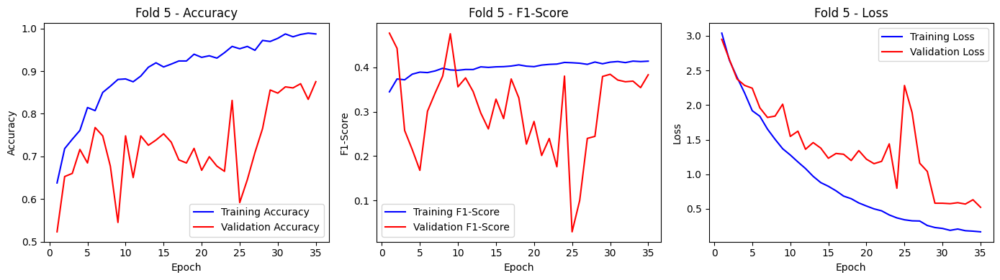

Fold 5 completed successfully!


In [ ]:
# Plotting tuned model
print(f"\nPlotting training history for Fold {fold + 1}...")

accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
f1_score = history.history['f1_score']
val_f1_score = history.history['val_f1_score']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_trained = range(1, len(accuracy) + 1)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 4))

axes[0].plot(epochs_trained, accuracy, 'b', label='Training Accuracy')
axes[0].plot(epochs_trained, val_accuracy, 'r', label='Validation Accuracy')
axes[0].set_title(f'Fold {fold+1} - Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(epochs_trained, f1_score, 'b', label='Training F1-Score')
axes[1].plot(epochs_trained, val_f1_score, 'r', label='Validation F1-Score')
axes[1].set_title(f'Fold {fold+1} - F1-Score')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('F1-Score')
axes[1].legend()

axes[2].plot(epochs_trained, loss, 'b', label='Training Loss')
axes[2].plot(epochs_trained, val_loss, 'r', label='Validation Loss')
axes[2].set_title(f'Fold {fold+1} - Loss')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].legend()

# Adjusting layout for better spacing
plt.tight_layout()

# Display the figure
plt.show()

print(f"Fold {fold + 1} completed successfully!")


In [ ]:
# Tuned Model Evaluation
model_results = []
for fold, (train_idx, val_idx) in enumerate(skf.split(X_all, y_all)):
    try:
        #Classification Report - Tuned
        test_loss, test_acc, test_f1_score = tuned_effi_model.evaluate(X_val_fold, y_val_fold)

        y_pred = (tuned_effi_model.predict(X_val_fold) > 0.5).astype(int).flatten()
        y_true = y_val_fold

        # Calculate metrics
        precision = precision_score(y_true, y_pred)
        recall = recall_score(y_true, y_pred)
        f1 = sk_f1_score(y_true, y_pred)

        print(f"\nFold {fold + 1} Results:")
        print(f"  Test Accuracy: {test_acc * 100:.2f}%")
        print(f"  Test Loss: {test_loss:.4f}")
        print(f"  Precision: {precision:.4f}")
        print(f"  Recall: {recall:.4f}")
        print(f"  F1-Score: {f1:.4f}")

        # Store results - MOVED INSIDE THE LOOP
        model_results.append({
            'fold': fold + 1,
            'accuracy': test_acc,
            'loss': test_loss,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'history': history
        })

        print('Classification Report (Tuned):')
        print(classification_report(y_true, y_pred, target_names=['Clean', 'Dusty']))

        K.clear_session()
        gc.collect()

    except Exception as e:
        print(f"[ERROR] Fold {fold + 1} failed during setup: {type(e).__name__} - {e}")
        import traceback
        traceback.print_exc()



# Calculate final results
print("\nEFFICIENTNETB3 5-FOLD CROSS-VALIDATION RESULTS")

# Extract all metrics
accuracies = [result['accuracy'] for result in model_results]
precisions = [result['precision'] for result in model_results]
recalls = [result['recall'] for result in model_results]
f1_scores = [result['f1_score'] for result in model_results]

# Calculate means and standard deviations
mean_acc = np.mean(accuracies)
std_acc = np.std(accuracies)
mean_precision = np.mean(precisions)
std_precision = np.std(precisions)
mean_recall = np.mean(recalls)
std_recall = np.std(recalls)
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)

# Print results
print(f"\nMean Test Accuracy: {mean_acc * 100:.2f}% ± {std_acc * 100:.2f}%")
print(f"Mean Precision: {mean_precision:.4f} ± {std_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f} ± {std_recall:.4f}")
print(f"Mean F1-Score: {mean_f1:.4f} ± {std_f1:.4f}")

print(f"\nDetailed Results by Fold:")
for i, result in enumerate(model_results):
    print(f"Fold {i+1}: Acc={result['accuracy']*100:.1f}%, "
          f"Prec={result['precision']:.3f}, "
          f"Rec={result['recall']:.3f}, "
          f"F1={result['f1_score']:.3f}")


print("\n=== EfficientNetB3 5-Fold Cross-Validation Summary ===")

print(f"Total folds attempted: 5")
print(f"\nFolds completed successfully: {len(model_results)}")

if len(model_results) == 0:
    print("ERROR: No folds completed successfully. Check error messages above.")
elif len(model_results) < 5:
    print(f"Warning: Only {len(model_results)} out of 5 folds completed successfully.")
else:
    print("All 5 folds completed successfully!")

13/13 ━━━━━━━━━━━━━━━━━━━━ 10s 467ms/step - accuracy: 0.8685 - f1_score: 0.3748 - loss: 0.5714
13/13 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step

Fold 1 Results:
  Test Accuracy: 87.53%
  Test Loss: 0.5231
  Precision: 0.8571
  Recall: 0.8421
  F1-Score: 0.8496
Classification Report (Tuned):
              precision    recall  f1-score   support

       Clean       0.89      0.90      0.89       238
       Dusty       0.86      0.84      0.85       171

    accuracy                           0.88       409
   macro avg       0.87      0.87      0.87       409
weighted avg       0.88      0.88      0.88       409

13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 115ms/step - accuracy: 0.8685 - f1_score: 0.3748 - loss: 0.5714
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 186ms/step

Fold 2 Results:
  Test Accuracy: 87.53%
  Test Loss: 0.5231
  Precision: 0.8571
  Recall: 0.8421
  F1-Score: 0.8496
Classification Report (Tuned):
              precision    recall  f1-score   support

       Clean       0.89      0.90      0.89       238

In [ ]:
# Simulated environmental conditions
def add_brightness(images, factor=1.2):
    return np.clip(images * factor, 0, 1.0)

def add_blur(images, ksize=(3, 3)):
    # Use OpenCV which requires uint8, then convert back
    blurred = []
    for img in images:
        img_uint8 = (img * 255).astype(np.uint8)
        blurred_img = cv2.GaussianBlur(img_uint8, ksize, 0)
        blurred.append(blurred_img.astype(np.float32) / 255.0)
    return np.array(blurred)

def add_noise(images, std=0.05):
    noise = np.random.normal(0, std, images.shape)
    return np.clip(images + noise, 0, 1.0)

# Centralized evaluation function
def evaluate_model_on_augmented_data(model, generator, condition_fn):
    X, y_true = [], []
    generator.reset()

    for x_batch, y_batch in generator:
        X.append(x_batch)
        y_true.extend(y_batch)
        if len(X) * generator.batch_size >= generator.samples:
            break

    X = np.vstack(X).astype(np.float32)  # Already in [0,1] due to test_datagen
    y_true = np.array(y_true).astype(int)

    # Apply environmental distortion
    X_aug = condition_fn(X)

    # Predict
    y_pred = model.predict(X_aug)
    y_pred_class = (y_pred > 0.5).astype(int).flatten()

    # Debug info
    print(f"[DEBUG] Condition: {condition_fn.__name__}")
    print(f"  - y_true class dist: {np.bincount(y_true)}")
    print(f"  - y_pred class dist: {np.bincount(y_pred_class)}")
    print(f"  - Raw preds sample: {np.round(y_pred.flatten()[:5], 3)}")

    acc = accuracy_score(y_true, y_pred_class)
    f1 = sk_f1_score(y_true, y_pred_class, zero_division=0)

    return acc, f1

conditions = {
    "Brightness": add_brightness,
    "Blur": add_blur,
    "Noise": add_noise
}

results = []

effi_target_size = target_size_map["effi"]
test_datagen_eval = ImageDataGenerator(rescale = 1./255)

test_generator_eval = test_datagen_eval.flow_from_directory(
    '/content/test',
    target_size = effi_target_size, # Use the correct target size
    class_mode = 'binary',
    shuffle=False # No need to shuffle for evaluation
)

for cond_name, cond_fn in conditions.items():
    acc, f1 = evaluate_model_on_augmented_data(tuned_effi_model, test_generator_eval, cond_fn)
    results.append({"Model": "EfficientNetB3", "Condition": cond_name, "Accuracy": acc, "F1-Score": f1})

df_results = pd.DataFrame(results)
df_results

Found 513 images belonging to 2 classes.
17/17 ━━━━━━━━━━━━━━━━━━━━ 8s 419ms/step
[DEBUG] Condition: add_brightness
  - y_true class dist: [299 214]
  - y_pred class dist: [304 209]
  - Raw preds sample: [0.001 0.    0.001 0.    0.   ]
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 109ms/step
[DEBUG] Condition: add_blur
  - y_true class dist: [299 214]
  - y_pred class dist: [297 216]
  - Raw preds sample: [0.002 0.    0.001 0.    0.001]
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 109ms/step
[DEBUG] Condition: add_noise
  - y_true class dist: [299 214]
  - y_pred class dist: [301 212]
  - Raw preds sample: [0.001 0.    0.001 0.    0.003]


,Model,Condition,Accuracy,F1-Score
0,EfficientNetB3,Brightness,0.865497,0.836879
1,EfficientNetB3,Blur,0.875244,0.851163
2,EfficientNetB3,Noise,0.867446,0.840376


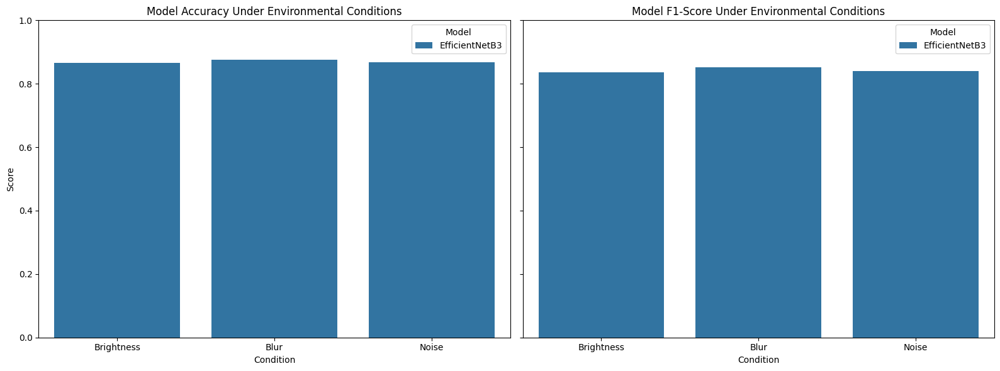

In [ ]:
# visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Accuracy Plot
sns.barplot(
    data=df_results,
    x="Condition",
    y="Accuracy",
    hue="Model",
    ax=axes[0]
)
axes[0].set_title("Model Accuracy Under Environmental Conditions")
axes[0].set_xlabel("Condition")
axes[0].set_ylabel("Score")
axes[0].set_ylim(0, 1)

# F1-Score Plot
sns.barplot(
    data=df_results,
    x="Condition",
    y="F1-Score",
    hue="Model",
    ax=axes[1]
)
axes[1].set_title("Model F1-Score Under Environmental Conditions")
axes[1].set_xlabel("Condition")
axes[1].set_ylabel("")  # Already shown on the left plot
axes[1].set_ylim(0, 1)

# Adjust layout
plt.tight_layout()
plt.show()



Plotting EfficientNetB3 Cross-Validation Results...


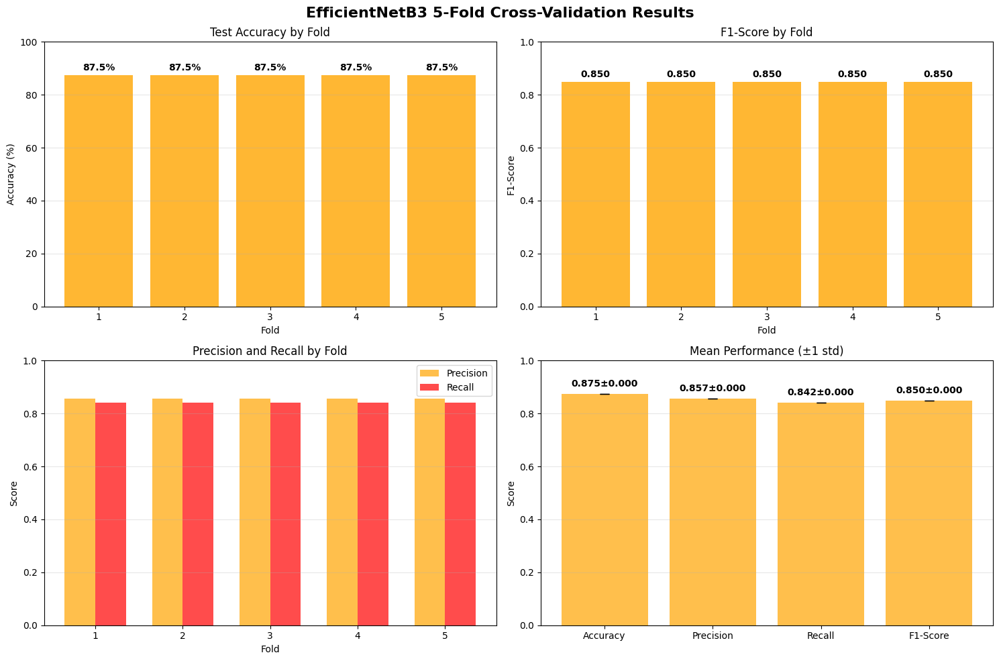

EfficientNetB3 5-fold cross-validation completed successfully!


In [ ]:
# Create comprehensive plots
print(f"\nPlotting EfficientNetB3 Cross-Validation Results...")

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('EfficientNetB3 5-Fold Cross-Validation Results', fontsize=16, fontweight='bold')

fold_numbers = list(range(1, 6))

# Plot 1: Accuracy by fold
bars1 = axes[0, 0].bar(fold_numbers, [acc * 100 for acc in accuracies], color='orange', alpha=0.8)
axes[0, 0].set_title('Test Accuracy by Fold')
axes[0, 0].set_xlabel('Fold')
axes[0, 0].set_ylabel('Accuracy (%)')
axes[0, 0].set_ylim(0, 100)
axes[0, 0].grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, (bar, acc) in enumerate(zip(bars1, accuracies)):
    axes[0, 0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                   f'{acc*100:.1f}%', ha='center', va='bottom', fontweight='bold')

# Plot 2: F1-Score by fold
bars2 = axes[0, 1].bar(fold_numbers, f1_scores, color='orange', alpha=0.8)
axes[0, 1].set_title('F1-Score by Fold')
axes[0, 1].set_xlabel('Fold')
axes[0, 1].set_ylabel('F1-Score')
axes[0, 1].set_ylim(0, 1)
axes[0, 1].grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, (bar, f1) in enumerate(zip(bars2, f1_scores)):
    axes[0, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                   f'{f1:.3f}', ha='center', va='bottom', fontweight='bold')

# Plot 3: Precision and Recall by fold
x = np.arange(len(fold_numbers))
width = 0.35

bars3 = axes[1, 0].bar(x - width/2, precisions, width, label='Precision', color='orange', alpha=0.7)
bars4 = axes[1, 0].bar(x + width/2, recalls, width, label='Recall', color='red', alpha=0.7)
axes[1, 0].set_title('Precision and Recall by Fold')
axes[1, 0].set_xlabel('Fold')
axes[1, 0].set_ylabel('Score')
axes[1, 0].set_xticks(x)
axes[1, 0].set_xticklabels(fold_numbers)
axes[1, 0].legend()
axes[1, 0].set_ylim(0, 1)
axes[1, 0].grid(axis='y', alpha=0.3)

# Plot 4: Summary statistics
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
means = [mean_acc, mean_precision, mean_recall, mean_f1]
stds = [std_acc, std_precision, std_recall, std_f1]

bars5 = axes[1, 1].bar(metrics_names, means, yerr=stds, capsize=5, color='orange', alpha=0.7)
axes[1, 1].set_title('Mean Performance (±1 std)')
axes[1, 1].set_ylabel('Score')
axes[1, 1].set_ylim(0, 1)
axes[1, 1].grid(axis='y', alpha=0.3)

# Add value labels
for i, (bar, mean, std) in enumerate(zip(bars5, means, stds)):
    axes[1, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.02,
                   f'{mean:.3f}±{std:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

print("EfficientNetB3 5-fold cross-validation completed successfully!")


17/17 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step

Final Classification Report (EfficientNetB3):
              precision    recall  f1-score   support

       Clean       0.87      0.90      0.89       299
       Dusty       0.86      0.82      0.84       214

    accuracy                           0.87       513
   macro avg       0.87      0.86      0.86       513
weighted avg       0.87      0.87      0.87       513



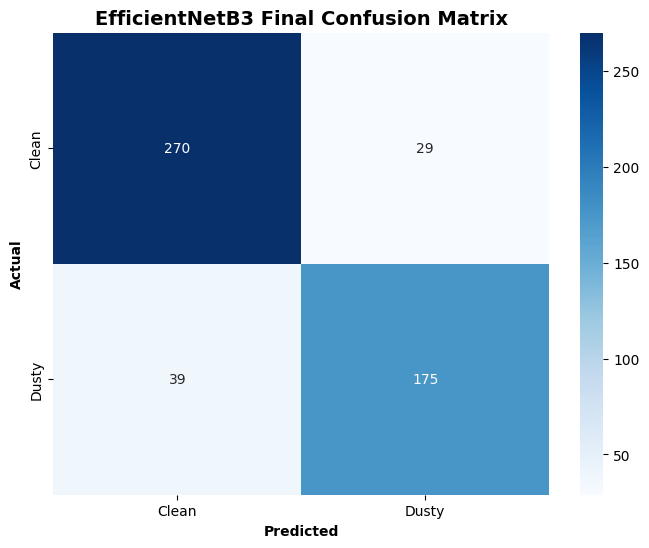

In [ ]:
# Final confusion matrix on the last trained model
test_generator_eval.reset()
final_predictions = tuned_effi_model.predict(test_generator_eval)
y_pred_final = (final_predictions > 0.5).astype(int).flatten()
y_true_final = test_generator_eval.classes

print('\nFinal Classification Report (EfficientNetB3):')
print(classification_report(y_true_final, y_pred_final, target_names=['Clean', 'Dusty']))

# Confusion Matrix

cm = confusion_matrix(y_true_final, y_pred_final)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Clean', 'Dusty'],
            yticklabels=['Clean', 'Dusty'])
plt.title('EfficientNetB3 Final Confusion Matrix', fontsize=14, fontweight='bold')
plt.xlabel('Predicted', fontweight='bold')
plt.ylabel('Actual', fontweight='bold')
plt.show()

## 2nd Model: DenseNet-121

### pre-train DenseNet-121

In [ ]:
print("\nBuilding DenseNet-121 Pre-train Model...")

backbone = "densenet"
target_size = target_size_map[backbone]
input_shape = target_size + (3,)

# Create generators for the current size
train_generator_current, test_generator_current = create_generators(
    target_size, train_dir, test_dir
)

if train_generator_current.samples == 0:
    print("Error: Train generator is empty. No images found in the training directory.")
    # Add more specific directory check
    train_clean_count = len(os.listdir(os.path.join(train_dir, 'Clean'))) if os.path.exists(os.path.join(train_dir, 'Clean')) else 0
    train_dusty_count = len(os.listdir(os.path.join(train_dir, 'Dusty'))) if os.path.exists(os.path.join(train_dir, 'Dusty')) else 0
    print(f"  Images found in {os.path.join(train_dir, 'Clean')}: {train_clean_count}")
    print(f"  Images found in {os.path.join(train_dir, 'Dusty')}: {train_dusty_count}")
    if train_clean_count + train_dusty_count == 0:
         print("  Train directories appear empty. Re-run data splitting steps.")
    raise ValueError("Train generator is empty. Cannot proceed with training.")

if test_generator_current.samples == 0:
    print("Error: Test generator is empty. No images found in the testing directory.")
    test_clean_count = len(os.listdir(os.path.join(test_dir, 'Clean'))) if os.path.exists(os.path.join(test_dir, 'Clean')) else 0
    test_dusty_count = len(os.listdir(os.path.join(test_dir, 'Dusty'))) if os.path.exists(os.path.join(test_dir, 'Dusty')) else 0
    print(f"  Images found in {os.path.join(test_dir, 'Clean')}: {test_clean_count}")
    print(f"  Images found in {os.path.join(test_dir, 'Dusty')}: {test_dusty_count}")
    if test_clean_count + test_dusty_count == 0:
         print("  Test directories appear empty. Re-run data splitting steps.")

def f1_score(y_true, y_pred):
    y_pred = K.round(y_pred)  # Round predicted probabilities to 0 or 1

    tp = K.sum(K.cast(y_true * y_pred, 'float32'))  # True positives
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float32'))  # False positives
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float32'))  # False negatives

    precision = tp / (tp + fp + K.epsilon())  # Add epsilon to avoid division by 0
    recall = tp / (tp + fn + K.epsilon())

    f1 = 2 * precision * recall / (precision + recall + K.epsilon())
    return f1

pre_densenet_model = Sequential([
    DenseNet121(weights='imagenet',
                   include_top = False,
                   input_shape = input_shape),
    GlobalAveragePooling2D(),
    Dense(128, activation = 'relu'),
    Dense(1, activation = 'sigmoid')
])

# Freeze the pre-trained model initially
pre_densenet_model.layers[0].trainable = False

pre_densenet_model.compile(optimizer = Adam(learning_rate = 0.0001),
                       loss='binary_crossentropy',
                       metrics=['accuracy', f1_score])

print("DenseNet-121 model has been built.\n")
pre_densenet_model.summary()


Building DenseNet-121 Pre-train Model...

Creating data generators for image size: (224, 224)
Found 2049 images belonging to 2 classes.
Found 513 images belonging to 2 classes.

=== Data generators created ===

Training samples: 2049
Testing samples: 513

 Classes: {'Clean': 0, 'Dusty': 1}

 Image size set to: (224, 224)
DenseNet-121 model has been built.



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)        │ (None, 7, 7, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,168,833 (27.35 MB)

 Trainable params: 131,329 (513.00 KB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [ ]:
history = pre_densenet_model.fit(
    train_generator_current,
    validation_data = test_generator_current,
    epochs = 5,
    batch_size = 8,
    class_weight = calculated_class_weights_dict
)

Epoch 1/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 115s 1s/step - accuracy: 0.6031 - f1_score: 0.3715 - loss: 0.6609 - val_accuracy: 0.7368 - val_f1_score: 0.3048 - val_loss: 0.5567
Epoch 2/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.6734 - f1_score: 0.4405 - loss: 0.5901 - val_accuracy: 0.7505 - val_f1_score: 0.3906 - val_loss: 0.5338
Epoch 3/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - accuracy: 0.6847 - f1_score: 0.4520 - loss: 0.5758 - val_accuracy: 0.7700 - val_f1_score: 0.3363 - val_loss: 0.5054
Epoch 4/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.6950 - f1_score: 0.4613 - loss: 0.5490 - val_accuracy: 0.7817 - val_f1_score: 0.3341 - val_loss: 0.4864
Epoch 5/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.7392 - f1_score: 0.4546 - loss: 0.5153 - val_accuracy: 0.7856 - val_f1_score: 0.3481 - val_loss: 0.4747


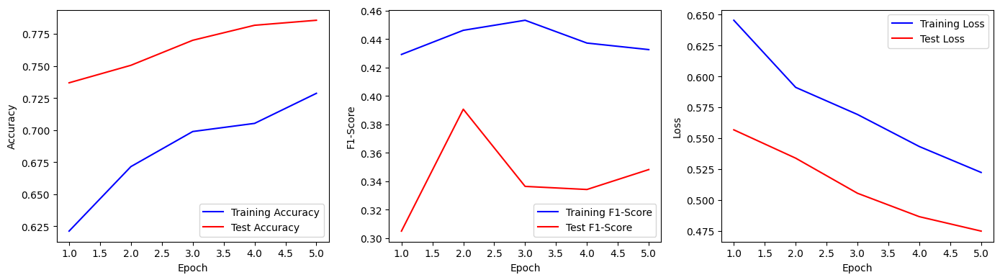

In [ ]:
# Plotting DenseNet-121 pre-trained model
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
f1_score = history.history['f1_score']
val_f1_score = history.history['val_f1_score']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(accuracy) + 1)

# Creating subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 4))

axes[0].plot(epochs, accuracy, 'b', label='Training Accuracy')
axes[0].plot(epochs, val_accuracy, 'r', label='Test Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(epochs, f1_score, 'b', label='Training F1-Score')
axes[1].plot(epochs, val_f1_score, 'r', label='Test F1-Score')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('F1-Score')
axes[1].legend()

axes[2].plot(epochs, loss, 'b', label='Training Loss')
axes[2].plot(epochs, val_loss, 'r', label='Test Loss')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].legend()

# Adjusting layout for better spacing
plt.tight_layout()

# Display the figure
plt.show()


In [ ]:
#Classification Report
test_loss, test_acc, test_f1 = pre_densenet_model.evaluate(test_generator_current, verbose=0)

test_generator_current.reset()
predictions = pre_densenet_model.predict(test_generator_current, verbose=0)
y_pred = (predictions > 0.5).astype(int).flatten()
y_true = test_generator_current.classes

# Calculate metrics
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = sk_f1_score(y_true, y_pred)

print(f"\nResults:")
print(f"  Test Accuracy: {test_acc * 100:.2f}%")
print(f"  Test Loss: {test_loss:.4f}")
print(f"  Precision: {precision:.4f}")
print(f"  Recall: {recall:.4f}")
print(f"  F1-Score: {f1:.4f}")

model_results = []

# Store results - MOVED INSIDE THE LOOP
model_results.append({
    'accuracy': test_acc,
    'loss': test_loss,
    'precision': precision,
    'recall': recall,
    'f1_score': f1,
    'history': history
})

print('\nClassification Report (Pre-trained):')
print(classification_report(y_true, y_pred, target_names=['Clean', 'Dusty']))

# Calculate final results
print("\nDENSENET-121 RESULTS")

# Extract all metrics
accuracies = model_results[0]['accuracy']
precisions = model_results[0]['precision']
recalls = model_results[0]['recall']
f1_scores = model_results[0]['f1_score']


# Calculate means and standard deviations
mean_acc = np.mean(accuracies)
std_acc = np.std(accuracies)
mean_precision = np.mean(precisions)
std_precision = np.std(precisions)
mean_recall = np.mean(recalls)
std_recall = np.std(recalls)
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)

# Print results
print(f"\nMean Test Accuracy: {mean_acc * 100:.2f}% ± {std_acc * 100:.2f}%")
print(f"Mean Precision: {mean_precision:.4f} ± {std_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f} ± {std_recall:.4f}")
print(f"Mean F1-Score: {mean_f1:.4f} ± {std_f1:.4f}")


Results:
  Test Accuracy: 78.56%
  Test Loss: 0.4747
  Precision: 0.7222
  Recall: 0.7897
  F1-Score: 0.7545

Classification Report (Pre-trained):
              precision    recall  f1-score   support

       Clean       0.84      0.78      0.81       299
       Dusty       0.72      0.79      0.75       214

    accuracy                           0.79       513
   macro avg       0.78      0.79      0.78       513
weighted avg       0.79      0.79      0.79       513


DENSENET-121 RESULTS

Mean Test Accuracy: 78.56% ± 0.00%
Mean Precision: 0.7222 ± 0.0000
Mean Recall: 0.7897 ± 0.0000
Mean F1-Score: 0.7545 ± 0.0000


17/17 ━━━━━━━━━━━━━━━━━━━━ 12s 662ms/step

Final Classification Report (DenseNet-121):
              precision    recall  f1-score   support

       Clean       0.84      0.78      0.81       299
       Dusty       0.72      0.79      0.75       214

    accuracy                           0.79       513
   macro avg       0.78      0.79      0.78       513
weighted avg       0.79      0.79      0.79       513



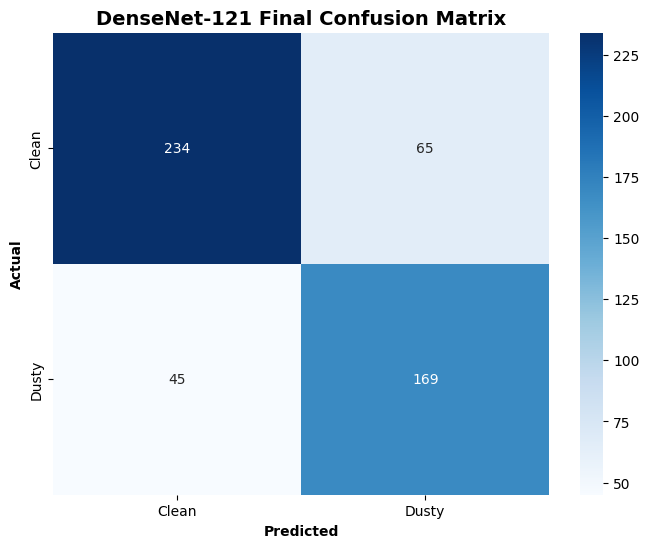

In [ ]:
# Final confusion matrix on the last trained model
test_generator_current.reset()
final_predictions = pre_densenet_model.predict(test_generator_current)
y_pred_final = (final_predictions > 0.5).astype(int).flatten()
y_true_final = test_generator_current.classes

print('\nFinal Classification Report (DenseNet-121):')
print(classification_report(y_true_final, y_pred_final, target_names=['Clean', 'Dusty']))

# Confusion Matrix
cm_dn = confusion_matrix(y_true_final, y_pred_final)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_dn, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Clean', 'Dusty'],
            yticklabels=['Clean', 'Dusty'])
plt.title('DenseNet-121 Final Confusion Matrix', fontsize=14, fontweight='bold')
plt.xlabel('Predicted', fontweight='bold')
plt.ylabel('Actual', fontweight='bold')
plt.show()

### Hyperparameter tuning

In [ ]:
print("=== CNN MODEL DEVELOPMENT WITH 5-FOLD CROSS-VALIDATION ===")

print("\nGetting all generator data for DenseNet-121...")

backbone = "densenet"
target_size = target_size_map[backbone]
input_shape = target_size + (3,)

# Create generators for the current size
train_generator_current, test_generator_current = create_generators(
    target_size, train_dir, test_dir
)

# Gather all data from train_generator
train_generator_current.reset()
all_images, all_labels = [], []


print("Loading all data from generator...")
for i in range(len(train_generator_current)):
    x_batch, y_batch = train_generator_current[i]
    all_images.append(x_batch)
    all_labels.extend(y_batch)

X_all = np.vstack(all_images)
y_all = np.array(all_labels)

print(f"Total data shape: {X_all.shape}, Labels shape: {y_all.shape}")


# Check for any issues with the data
if len(X_all) == 0:
    raise ValueError("No training data found!")
if len(np.unique(y_all)) < 2:
    raise ValueError("Only one class found in labels!")

def f1_score(y_true, y_pred):
    y_pred = K.round(y_pred)  # Round predicted probabilities to 0 or 1

    tp = K.sum(K.cast(y_true * y_pred, 'float32'))  # True positives
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float32'))  # False positives
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float32'))  # False negatives

    precision = tp / (tp + fp + K.epsilon())  # Add epsilon to avoid division by 0
    recall = tp / (tp + fn + K.epsilon())

    f1 = 2 * precision * recall / (precision + recall + K.epsilon())
    return f1

# Cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
splits = list(skf.split(X_all, y_all))
model_results = []

for fold, (train_idx, val_idx) in enumerate(splits):
    print(f"\n=== STARTING FOLD {fold + 1}/5 ===")

    try:
        X_train_fold = X_all[train_idx]
        y_train_fold = y_all[train_idx]
        X_val_fold = X_all[val_idx]
        y_val_fold = y_all[val_idx]

        print(f"Train: {X_train_fold.shape}, Val: {X_val_fold.shape}")
        print(f"Class distribution in Train: {np.bincount(y_train_fold.astype(int))}")
        print(f"Class distribution in Val: {np.bincount(y_val_fold.astype(int))}")


        # Create model
        print("Creating model...")
        base_model = DenseNet121(weights='imagenet',
                                    include_top=False,
                                    input_shape=input_shape)

        # After initial model building:
        base_model.trainable = True

        tuned_densenet_model = Sequential([
            base_model,
            GlobalAveragePooling2D(),
            BatchNormalization(),
            Dropout(0.3),
            Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
            Dropout(0.3),
            Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01))
        ])

        print("Model created successfully")

        # Setup callbacks
        print("Setting up callbacks...")
        early_stopping = EarlyStopping(monitor='val_loss',
                                      patience=8,
                                      restore_best_weights=True)
        reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                    factor=0.2,
                                    patience=4,
                                    min_lr=1e-6)

        # Compile model
        print("Compiling model...")
        tuned_densenet_model.compile(optimizer=Adam(learning_rate=0.0001),
                      loss='binary_crossentropy',
                      metrics=['accuracy', f1_score])

        print("Model compilation completed")
        tuned_densenet_model.summary() # Moved summary inside the loop


    except Exception as e:
        print(f"[ERROR] Fold {fold + 1} failed during training or evaluation: {str(e)}")
        print(f"Error type: {type(e).__name__}")
        import traceback
        traceback.print_exc()
        # Clear session even if training failed
        K.clear_session()
        del base_model, tuned_densenet_model # Ensure these are deleted if created before the error
        gc.collect()
        print(f"Fold {fold + 1} cleanup done after error.")
        # Continue to next fold


print(f"Fold {fold + 1} completed successfully!")

=== CNN MODEL DEVELOPMENT WITH 5-FOLD CROSS-VALIDATION ===

Getting all generator data for DenseNet-121...

Creating data generators for image size: (224, 224)
Found 2049 images belonging to 2 classes.
Found 513 images belonging to 2 classes.

=== Data generators created ===

Training samples: 2049
Testing samples: 513

 Classes: {'Clean': 0, 'Dusty': 1}

 Image size set to: (224, 224)
Loading all data from generator...
Total data shape: (2049, 224, 224, 3), Labels shape: (2049,)

=== STARTING FOLD 1/5 ===
Train: (1639, 224, 224, 3), Val: (410, 224, 224, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)        │ (None, 7, 7, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,172,929 (27.36 MB)

 Trainable params: 7,087,233 (27.04 MB)

 Non-trainable params: 85,696 (334.75 KB)


=== STARTING FOLD 2/5 ===
Train: (1639, 224, 224, 3), Val: (410, 224, 224, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)        │ (None, 7, 7, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,172,929 (27.36 MB)

 Trainable params: 7,087,233 (27.04 MB)

 Non-trainable params: 85,696 (334.75 KB)


=== STARTING FOLD 3/5 ===
Train: (1639, 224, 224, 3), Val: (410, 224, 224, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)        │ (None, 7, 7, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,172,929 (27.36 MB)

 Trainable params: 7,087,233 (27.04 MB)

 Non-trainable params: 85,696 (334.75 KB)


=== STARTING FOLD 4/5 ===
Train: (1639, 224, 224, 3), Val: (410, 224, 224, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)        │ (None, 7, 7, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,172,929 (27.36 MB)

 Trainable params: 7,087,233 (27.04 MB)

 Non-trainable params: 85,696 (334.75 KB)


=== STARTING FOLD 5/5 ===
Train: (1640, 224, 224, 3), Val: (409, 224, 224, 3)
Class distribution in Train: [956 684]
Class distribution in Val: [238 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)        │ (None, 7, 7, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,172,929 (27.36 MB)

 Trainable params: 7,087,233 (27.04 MB)

 Non-trainable params: 85,696 (334.75 KB)

Fold 5 completed successfully!


In [ ]:
# TRAIN MODEL
print(f"Training Fold {fold + 1}...")

history = tuned_densenet_model.fit(
    X_train_fold, y_train_fold,
    validation_data=(X_val_fold, y_val_fold),
    epochs=35,
    batch_size=4,
    class_weight=calculated_class_weights_dict,
    callbacks=[early_stopping, reduce_lr]
)

print(f"Fold {fold + 1} completed successfully!")

Training Fold 5...
Epoch 1/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 215s 95ms/step - accuracy: 0.6321 - f1_score: 0.3563 - loss: 2.7775 - val_accuracy: 0.7628 - val_f1_score: 0.3598 - val_loss: 1.9930 - learning_rate: 1.0000e-04
Epoch 2/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - accuracy: 0.7053 - f1_score: 0.3874 - loss: 1.9767 - val_accuracy: 0.7457 - val_f1_score: 0.3253 - val_loss: 1.7804 - learning_rate: 1.0000e-04
Epoch 3/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - accuracy: 0.7455 - f1_score: 0.3558 - loss: 1.6858 - val_accuracy: 0.7555 - val_f1_score: 0.2892 - val_loss: 1.6622 - learning_rate: 1.0000e-04
Epoch 4/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - accuracy: 0.7564 - f1_score: 0.4037 - loss: 1.5202 - val_accuracy: 0.7677 - val_f1_score: 0.3316 - val_loss: 1.4753 - learning_rate: 1.0000e-04
Epoch 5/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step - accuracy: 0.7733 - f1_score: 0.3913 - loss: 1.4261 - val_accuracy: 0.7555 - val_f1_score: 0.3179 - val_loss: 1.4150 - learni


Plotting training history for Fold 5...


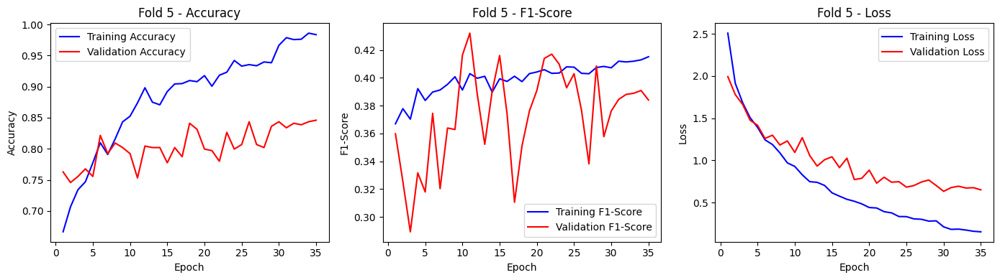

Fold 5 completed successfully!


In [ ]:
# Plotting tuned model
print(f"\nPlotting training history for Fold {fold + 1}...")

accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
f1_score = history.history['f1_score']
val_f1_score = history.history['val_f1_score']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_trained = range(1, len(accuracy) + 1)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 4))

axes[0].plot(epochs_trained, accuracy, 'b', label='Training Accuracy')
axes[0].plot(epochs_trained, val_accuracy, 'r', label='Validation Accuracy')
axes[0].set_title(f'Fold {fold+1} - Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(epochs_trained, f1_score, 'b', label='Training F1-Score')
axes[1].plot(epochs_trained, val_f1_score, 'r', label='Validation F1-Score')
axes[1].set_title(f'Fold {fold+1} - F1-Score')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('F1-Score')
axes[1].legend()

axes[2].plot(epochs_trained, loss, 'b', label='Training Loss')
axes[2].plot(epochs_trained, val_loss, 'r', label='Validation Loss')
axes[2].set_title(f'Fold {fold+1} - Loss')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].legend()

# Adjusting layout for better spacing
plt.tight_layout()

# Display the figure
plt.show()

print(f"Fold {fold + 1} completed successfully!")


In [ ]:
# Tuned Model Evaluation
for fold, (train_idx, val_idx) in enumerate(skf.split(X_all, y_all)):
    try:
        #Classification Report - Tuned
        test_loss, test_acc, test_f1_score = tuned_densenet_model.evaluate(X_val_fold, y_val_fold)

        y_pred = (tuned_densenet_model.predict(X_val_fold) > 0.5).astype(int).flatten()
        y_true = y_val_fold

        # Calculate metrics
        precision = precision_score(y_true, y_pred)
        recall = recall_score(y_true, y_pred)
        f1 = sk_f1_score(y_true, y_pred)

        print(f"\nFold {fold + 1} Results:")
        print(f"  Test Accuracy: {test_acc * 100:.2f}%")
        print(f"  Test Loss: {test_loss:.4f}")
        print(f"  Precision: {precision:.4f}")
        print(f"  Recall: {recall:.4f}")
        print(f"  F1-Score: {f1:.4f}")

        # Store results - MOVED INSIDE THE LOOP
        model_results.append({
            'fold': fold + 1,
            'accuracy': test_acc,
            'loss': test_loss,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'history': history
        })

        print('Classification Report (Tuned):')
        print(classification_report(y_true, y_pred, target_names=['Clean', 'Dusty']))
        K.clear_session()
        gc.collect()

    except Exception as e:
        print(f"[ERROR] Fold {fold + 1} failed during setup: {type(e).__name__} - {e}")
        import traceback
        traceback.print_exc()

# Calculate final results
print("\nDENSENET-121 5-FOLD CROSS-VALIDATION RESULTS")

# Extract all metrics
accuracies = [result['accuracy'] for result in model_results]
precisions = [result['precision'] for result in model_results]
recalls = [result['recall'] for result in model_results]
f1_scores = [result['f1_score'] for result in model_results]

# Calculate means and standard deviations
mean_acc = np.mean(accuracies)
std_acc = np.std(accuracies)
mean_precision = np.mean(precisions)
std_precision = np.std(precisions)
mean_recall = np.mean(recalls)
std_recall = np.std(recalls)
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)

# Print results
print(f"\nMean Test Accuracy: {mean_acc * 100:.2f}% ± {std_acc * 100:.2f}%")
print(f"Mean Precision: {mean_precision:.4f} ± {std_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f} ± {std_recall:.4f}")
print(f"Mean F1-Score: {mean_f1:.4f} ± {std_f1:.4f}")

print(f"\nDetailed Results by Fold:")
for i, result in enumerate(model_results):
    print(f"Fold {i+1}: Acc={result['accuracy']*100:.1f}%, "
          f"Prec={result['precision']:.3f}, "
          f"Rec={result['recall']:.3f}, "
          f"F1={result['f1_score']:.3f}")


print("\n=== DenseNet-121 5-Fold Cross-Validation Summary ===")

print(f"Total folds attempted: 5")
print(f"\nFolds completed successfully: {len(model_results)}")

if len(model_results) == 0:
    print("ERROR: No folds completed successfully. Check error messages above.")
elif len(model_results) < 5:
    print(f"Warning: Only {len(model_results)} out of 5 folds completed successfully.")
else:
    print("All 5 folds completed successfully!")

13/13 ━━━━━━━━━━━━━━━━━━━━ 11s 497ms/step - accuracy: 0.8509 - f1_score: 0.4036 - loss: 0.5949
13/13 ━━━━━━━━━━━━━━━━━━━━ 18s 794ms/step

Fold 1 Results:
  Test Accuracy: 84.35%
  Test Loss: 0.6322
  Precision: 0.8204
  Recall: 0.8012
  F1-Score: 0.8107
Classification Report (Tuned):
              precision    recall  f1-score   support

       Clean       0.86      0.87      0.87       238
       Dusty       0.82      0.80      0.81       171

    accuracy                           0.84       409
   macro avg       0.84      0.84      0.84       409
weighted avg       0.84      0.84      0.84       409

13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.8509 - f1_score: 0.4036 - loss: 0.5949
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step

Fold 2 Results:
  Test Accuracy: 84.35%
  Test Loss: 0.6322
  Precision: 0.8204
  Recall: 0.8012
  F1-Score: 0.8107
Classification Report (Tuned):
              precision    recall  f1-score   support

       Clean       0.86      0.87      0.87       2

In [ ]:
# Simulated environmental conditions
def add_brightness(images, factor=1.2):
    return np.clip(images * factor, 0, 1.0)

def add_blur(images, ksize=(3, 3)):
    # Use OpenCV which requires uint8, then convert back
    blurred = []
    for img in images:
        img_uint8 = (img * 255).astype(np.uint8)
        blurred_img = cv2.GaussianBlur(img_uint8, ksize, 0)
        blurred.append(blurred_img.astype(np.float32) / 255.0)
    return np.array(blurred)

def add_noise(images, std=0.05):
    noise = np.random.normal(0, std, images.shape)
    return np.clip(images + noise, 0, 1.0)

# Centralized evaluation function
def evaluate_model_on_augmented_data(model, generator, condition_fn):
    X, y_true = [], []
    generator.reset()

    for x_batch, y_batch in generator:
        X.append(x_batch)
        y_true.extend(y_batch)
        if len(X) * generator.batch_size >= generator.samples:
            break

    X = np.vstack(X).astype(np.float32)  # Already in [0,1] due to test_datagen
    y_true = np.array(y_true).astype(int)

    # Apply environmental distortion
    X_aug = condition_fn(X)

    # Predict
    y_pred = model.predict(X_aug)
    y_pred_class = (y_pred > 0.5).astype(int).flatten()

    # Debug info
    print(f"[DEBUG] Condition: {condition_fn.__name__}")
    print(f"  - y_true class dist: {np.bincount(y_true)}")
    print(f"  - y_pred class dist: {np.bincount(y_pred_class)}")
    print(f"  - Raw preds sample: {np.round(y_pred.flatten()[:5], 3)}")

    acc = accuracy_score(y_true, y_pred_class)
    f1 = sk_f1_score(y_true, y_pred_class, zero_division=0)

    return acc, f1

conditions = {
    "Brightness": add_brightness,
    "Blur": add_blur,
    "Noise": add_noise
}

results = []

densenet_target_size = target_size_map["densenet"]
test_datagen_eval = ImageDataGenerator(rescale = 1./255)

test_generator_eval = test_datagen_eval.flow_from_directory(
    '/content/test',
    target_size = densenet_target_size, # Use the correct target size
    class_mode = 'binary',
    shuffle=False # No need to shuffle for evaluation
)

for cond_name, cond_fn in conditions.items():
    acc, f1 = evaluate_model_on_augmented_data(tuned_densenet_model, test_generator_eval, cond_fn)
    results.append({"Model": "DenseNet-121", "Condition": cond_name, "Accuracy": acc, "F1-Score": f1})

df_results = pd.DataFrame(results)
df_results

Found 513 images belonging to 2 classes.
17/17 ━━━━━━━━━━━━━━━━━━━━ 8s 395ms/step
[DEBUG] Condition: add_brightness
  - y_true class dist: [299 214]
  - y_pred class dist: [315 198]
  - Raw preds sample: [0.005 0.006 0.061 0.003 0.001]
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step
[DEBUG] Condition: add_blur
  - y_true class dist: [299 214]
  - y_pred class dist: [316 197]
  - Raw preds sample: [0.008 0.009 0.033 0.001 0.003]
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step
[DEBUG] Condition: add_noise
  - y_true class dist: [299 214]
  - y_pred class dist: [308 205]
  - Raw preds sample: [0.007 0.007 0.127 0.002 0.001]


,Model,Condition,Accuracy,F1-Score
0,DenseNet-121,Brightness,0.851852,0.815534
1,DenseNet-121,Blur,0.846004,0.807786
2,DenseNet-121,Noise,0.857700,0.825776


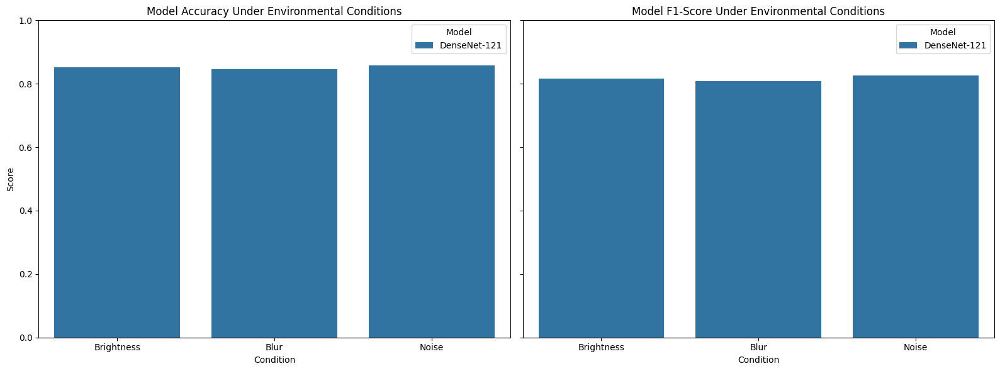

In [ ]:
# visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Accuracy Plot
sns.barplot(
    data=df_results,
    x="Condition",
    y="Accuracy",
    hue="Model",
    ax=axes[0]
)
axes[0].set_title("Model Accuracy Under Environmental Conditions")
axes[0].set_xlabel("Condition")
axes[0].set_ylabel("Score")
axes[0].set_ylim(0, 1)

# F1-Score Plot
sns.barplot(
    data=df_results,
    x="Condition",
    y="F1-Score",
    hue="Model",
    ax=axes[1]
)
axes[1].set_title("Model F1-Score Under Environmental Conditions")
axes[1].set_xlabel("Condition")
axes[1].set_ylabel("")  # Already shown on the left plot
axes[1].set_ylim(0, 1)

# Adjust layout
plt.tight_layout()
plt.show()



Plotting DenseNet-121 Cross-Validation Results...


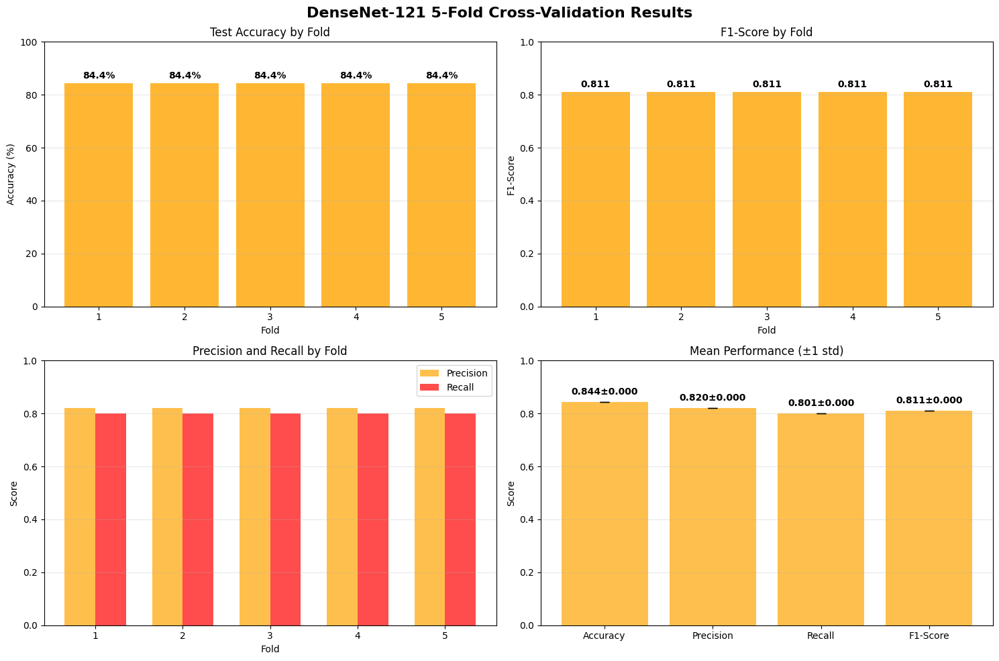

DenseNet-121 5-fold cross-validation completed successfully!


In [ ]:
# Create comprehensive plots
print(f"\nPlotting DenseNet-121 Cross-Validation Results...")

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('DenseNet-121 5-Fold Cross-Validation Results', fontsize=16, fontweight='bold')

fold_numbers = list(range(1, 6))

# Plot 1: Accuracy by fold
bars1 = axes[0, 0].bar(fold_numbers, [acc * 100 for acc in accuracies], color='orange', alpha=0.8)
axes[0, 0].set_title('Test Accuracy by Fold')
axes[0, 0].set_xlabel('Fold')
axes[0, 0].set_ylabel('Accuracy (%)')
axes[0, 0].set_ylim(0, 100)
axes[0, 0].grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, (bar, acc) in enumerate(zip(bars1, accuracies)):
    axes[0, 0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                   f'{acc*100:.1f}%', ha='center', va='bottom', fontweight='bold')

# Plot 2: F1-Score by fold
bars2 = axes[0, 1].bar(fold_numbers, f1_scores, color='orange', alpha=0.8)
axes[0, 1].set_title('F1-Score by Fold')
axes[0, 1].set_xlabel('Fold')
axes[0, 1].set_ylabel('F1-Score')
axes[0, 1].set_ylim(0, 1)
axes[0, 1].grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, (bar, f1) in enumerate(zip(bars2, f1_scores)):
    axes[0, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                   f'{f1:.3f}', ha='center', va='bottom', fontweight='bold')

# Plot 3: Precision and Recall by fold
x = np.arange(len(fold_numbers))
width = 0.35

bars3 = axes[1, 0].bar(x - width/2, precisions, width, label='Precision', color='orange', alpha=0.7)
bars4 = axes[1, 0].bar(x + width/2, recalls, width, label='Recall', color='red', alpha=0.7)
axes[1, 0].set_title('Precision and Recall by Fold')
axes[1, 0].set_xlabel('Fold')
axes[1, 0].set_ylabel('Score')
axes[1, 0].set_xticks(x)
axes[1, 0].set_xticklabels(fold_numbers)
axes[1, 0].legend()
axes[1, 0].set_ylim(0, 1)
axes[1, 0].grid(axis='y', alpha=0.3)

# Plot 4: Summary statistics
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
means = [mean_acc, mean_precision, mean_recall, mean_f1]
stds = [std_acc, std_precision, std_recall, std_f1]

bars5 = axes[1, 1].bar(metrics_names, means, yerr=stds, capsize=5, color='orange', alpha=0.7)
axes[1, 1].set_title('Mean Performance (±1 std)')
axes[1, 1].set_ylabel('Score')
axes[1, 1].set_ylim(0, 1)
axes[1, 1].grid(axis='y', alpha=0.3)

# Add value labels
for i, (bar, mean, std) in enumerate(zip(bars5, means, stds)):
    axes[1, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.02,
                   f'{mean:.3f}±{std:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

print("DenseNet-121 5-fold cross-validation completed successfully!")


17/17 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step

Final Classification Report (DenseNet-121):
              precision    recall  f1-score   support

       Clean       0.86      0.90      0.88       299
       Dusty       0.85      0.79      0.82       214

    accuracy                           0.86       513
   macro avg       0.86      0.85      0.85       513
weighted avg       0.86      0.86      0.85       513



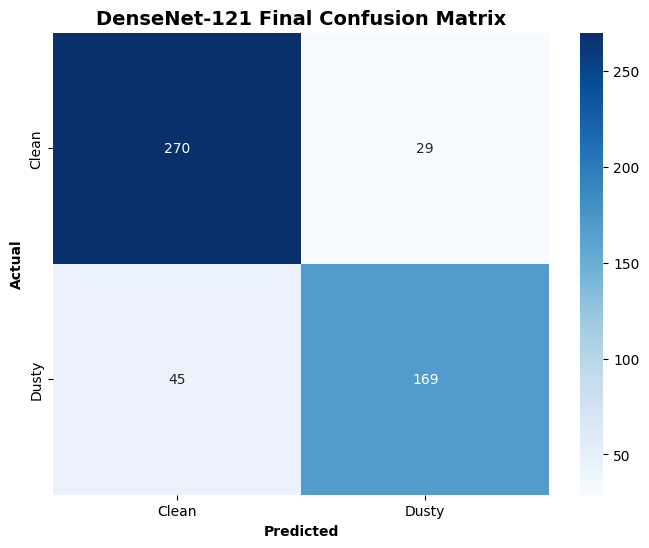

In [ ]:
# Final confusion matrix on the last trained model
test_generator_eval.reset()
final_predictions = tuned_densenet_model.predict(test_generator_eval)
y_pred_final = (final_predictions > 0.5).astype(int).flatten()
y_true_final = test_generator_eval.classes

print('\nFinal Classification Report (DenseNet-121):')
print(classification_report(y_true_final, y_pred_final, target_names=['Clean', 'Dusty']))

# Confusion Matrix

cm = confusion_matrix(y_true_final, y_pred_final)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Clean', 'Dusty'],
            yticklabels=['Clean', 'Dusty'])
plt.title('DenseNet-121 Final Confusion Matrix', fontsize=14, fontweight='bold')
plt.xlabel('Predicted', fontweight='bold')
plt.ylabel('Actual', fontweight='bold')
plt.show()

## 3rd Model: ResNet-50

### Pre-train ResNet-50

In [ ]:
print("=== 3RD MODEL: ResNet50 ===")
print("\nBuilding ResNet50 Pre-trained Model...")

backbone = "resnet"
target_size = target_size_map[backbone]
input_shape = target_size + (3,)

# Create generators for the current size
train_generator_current, test_generator_current = create_generators(
    target_size, train_dir, test_dir
)

if train_generator_current.samples == 0:
    print("Error: Train generator is empty. No images found in the training directory.")
    # Add more specific directory check
    train_clean_count = len(os.listdir(os.path.join(train_dir, 'Clean'))) if os.path.exists(os.path.join(train_dir, 'Clean')) else 0
    train_dusty_count = len(os.listdir(os.path.join(train_dir, 'Dusty'))) if os.path.exists(os.path.join(train_dir, 'Dusty')) else 0
    print(f"  Images found in {os.path.join(train_dir, 'Clean')}: {train_clean_count}")
    print(f"  Images found in {os.path.join(train_dir, 'Dusty')}: {train_dusty_count}")
    if train_clean_count + train_dusty_count == 0:
         print("  Train directories appear empty. Re-run data splitting steps.")
    raise ValueError("Train generator is empty. Cannot proceed with training.")

if test_generator_current.samples == 0:
    print("Error: Test generator is empty. No images found in the testing directory.")
    test_clean_count = len(os.listdir(os.path.join(test_dir, 'Clean'))) if os.path.exists(os.path.join(test_dir, 'Clean')) else 0
    test_dusty_count = len(os.listdir(os.path.join(test_dir, 'Dusty'))) if os.path.exists(os.path.join(test_dir, 'Dusty')) else 0
    print(f"  Images found in {os.path.join(test_dir, 'Clean')}: {test_clean_count}")
    print(f"  Images found in {os.path.join(test_dir, 'Dusty')}: {test_dusty_count}")
    if test_clean_count + test_dusty_count == 0:
         print("  Test directories appear empty. Re-run data splitting steps.")

def f1_score(y_true, y_pred):
    y_pred = K.round(y_pred)  # Round predicted probabilities to 0 or 1

    tp = K.sum(K.cast(y_true * y_pred, 'float32'))  # True positives
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float32'))  # False positives
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float32'))  # False negatives

    precision = tp / (tp + fp + K.epsilon())  # Add epsilon to avoid division by 0
    recall = tp / (tp + fn + K.epsilon())

    f1 = 2 * precision * recall / (precision + recall + K.epsilon())
    return f1

pre_resnet_model = Sequential([
      ResNet50(weights='imagenet',
              include_top=False,
              input_shape=input_shape),
      GlobalAveragePooling2D(),
      Dense(128, activation='relu'),
      Dense(1, activation='sigmoid')
])

# Freeze the pre-trained model initially
pre_resnet_model.layers[0].trainable = False

pre_resnet_model.compile(optimizer=Adam(learning_rate=0.0001),
                        loss='binary_crossentropy',
                        metrics=['accuracy', f1_score])

print("ResNet50 model has been built.\n")
pre_resnet_model.summary()

=== 3RD MODEL: ResNet50 ===

Building ResNet50 Pre-trained Model...

Creating data generators for image size: (224, 224)
Found 2049 images belonging to 2 classes.
Found 513 images belonging to 2 classes.

=== Data generators created ===

Training samples: 2049
Testing samples: 513

 Classes: {'Clean': 0, 'Dusty': 1}

 Image size set to: (224, 224)
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
ResNet50 model has been built.



Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,850,113 (90.98 MB)

 Trainable params: 262,401 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
# Train the pre-trained Resnet-50 model
history = pre_resnet_model.fit(
    train_generator_current,
    validation_data=test_generator_current,
    epochs=5,
    batch_size=8,
    class_weight=calculated_class_weights_dict
)

Epoch 1/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 97s 1s/step - accuracy: 0.4956 - f1_score: 0.2824 - loss: 0.7041 - val_accuracy: 0.5712 - val_f1_score: 0.3877 - val_loss: 0.6816
Epoch 2/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.5280 - f1_score: 0.4201 - loss: 0.6870 - val_accuracy: 0.5945 - val_f1_score: 0.1635 - val_loss: 0.6632
Epoch 3/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.5448 - f1_score: 0.4019 - loss: 0.6870 - val_accuracy: 0.5887 - val_f1_score: 0.0178 - val_loss: 0.6586
Epoch 4/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.5914 - f1_score: 0.2097 - loss: 0.6833 - val_accuracy: 0.5965 - val_f1_score: 0.3791 - val_loss: 0.6703
Epoch 5/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.5444 - f1_score: 0.4619 - loss: 0.6834 - val_accuracy: 0.6082 - val_f1_score: 0.1808 - val_loss: 0.6582


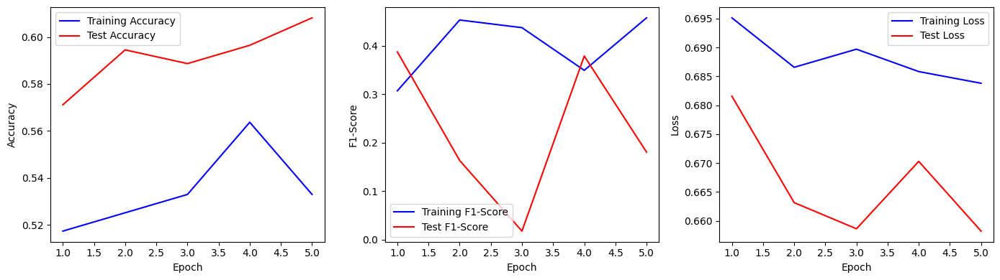

In [ ]:
# Plotting ResNet-50 pre-trained model
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
f1_score = history.history['f1_score']
val_f1_score = history.history['val_f1_score']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(accuracy) + 1)

# Creating subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 4))

axes[0].plot(epochs, accuracy, 'b', label='Training Accuracy')
axes[0].plot(epochs, val_accuracy, 'r', label='Test Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(epochs, f1_score, 'b', label='Training F1-Score')
axes[1].plot(epochs, val_f1_score, 'r', label='Test F1-Score')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('F1-Score')
axes[1].legend()

axes[2].plot(epochs, loss, 'b', label='Training Loss')
axes[2].plot(epochs, val_loss, 'r', label='Test Loss')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].legend()

# Adjusting layout for better spacing
plt.tight_layout()

# Display the figure
plt.show()


In [ ]:
#Classification Report
test_loss, test_acc, test_f1 = pre_resnet_model.evaluate(test_generator_current, verbose=0)


test_generator_current.reset()
predictions = pre_resnet_model.predict(test_generator_current, verbose=0)
y_pred = (predictions > 0.5).astype(int).flatten()
y_true = test_generator_current.classes

# Calculate metrics
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = sk_f1_score(y_true, y_pred)

print(f"\nResults:")
print(f"  Test Accuracy: {test_acc * 100:.2f}%")
print(f"  Test Loss: {test_loss:.4f}")
print(f"  Precision: {precision:.4f}")
print(f"  Recall: {recall:.4f}")
print(f"  F1-Score: {f1:.4f}")

model_results = []

# Store results - MOVED INSIDE THE LOOP
model_results.append({
    'accuracy': test_acc,
    'loss': test_loss,
    'precision': precision,
    'recall': recall,
    'f1_score': f1,
    'history': history
})

print('\nClassification Report (Pre-trained):')
print(classification_report(y_true, y_pred, target_names=['Clean', 'Dusty']))

# Calculate final results
print("\nRESNET-50 RESULTS")

# Extract all metrics
accuracies = model_results[0]['accuracy']
precisions = model_results[0]['precision']
recalls = model_results[0]['recall']
f1_scores = model_results[0]['f1_score']


# Calculate means and standard deviations
mean_acc = np.mean(accuracies)
std_acc = np.std(accuracies)
mean_precision = np.mean(precisions)
std_precision = np.std(precisions)
mean_recall = np.mean(recalls)
std_recall = np.std(recalls)
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)

# Print results
print(f"\nMean Test Accuracy: {mean_acc * 100:.2f}% ± {std_acc * 100:.2f}%")
print(f"Mean Precision: {mean_precision:.4f} ± {std_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f} ± {std_recall:.4f}")
print(f"Mean F1-Score: {mean_f1:.4f} ± {std_f1:.4f}")


Results:
  Test Accuracy: 60.82%
  Test Loss: 0.6582
  Precision: 0.5565
  Recall: 0.2991
  F1-Score: 0.3891

Classification Report (Pre-trained):
              precision    recall  f1-score   support

       Clean       0.62      0.83      0.71       299
       Dusty       0.56      0.30      0.39       214

    accuracy                           0.61       513
   macro avg       0.59      0.56      0.55       513
weighted avg       0.60      0.61      0.58       513


RESNET-50 RESULTS

Mean Test Accuracy: 60.82% ± 0.00%
Mean Precision: 0.5565 ± 0.0000
Mean Recall: 0.2991 ± 0.0000
Mean F1-Score: 0.3891 ± 0.0000


17/17 ━━━━━━━━━━━━━━━━━━━━ 12s 657ms/step

Final Classification Report (ResNet-50):
              precision    recall  f1-score   support

       Clean       0.62      0.83      0.71       299
       Dusty       0.56      0.30      0.39       214

    accuracy                           0.61       513
   macro avg       0.59      0.56      0.55       513
weighted avg       0.60      0.61      0.58       513



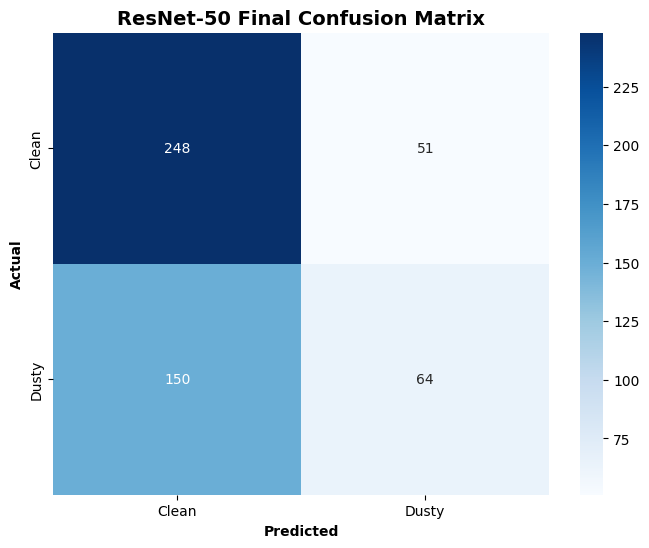

In [ ]:
# Final confusion matrix on the last trained model
test_generator_current.reset()
final_predictions = pre_resnet_model.predict(test_generator_current)
y_pred_final = (final_predictions > 0.5).astype(int).flatten()
y_true_final = test_generator_current.classes

print('\nFinal Classification Report (ResNet-50):')
print(classification_report(y_true_final, y_pred_final, target_names=['Clean', 'Dusty']))

# Confusion Matrix

cm = confusion_matrix(y_true_final, y_pred_final)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Clean', 'Dusty'],
            yticklabels=['Clean', 'Dusty'])
plt.title('ResNet-50 Final Confusion Matrix', fontsize=14, fontweight='bold')
plt.xlabel('Predicted', fontweight='bold')
plt.ylabel('Actual', fontweight='bold')
plt.show()

### Hyperparameter tuning

In [ ]:
print("=== CNN MODEL DEVELOPMENT WITH 5-FOLD CROSS-VALIDATION ===")

print("\nGetting all generator data for ResNet-50...")

backbone = "resnet"
target_size = target_size_map[backbone]
input_shape = target_size + (3,)

# Create generators for the current size
train_generator_current, test_generator_current = create_generators(
    target_size, train_dir, test_dir
)
# Gather all data from train_generator
train_generator_current.reset()
all_images, all_labels = [], []


print("Loading all data from generator...")
for i in range(len(train_generator_current)):
    x_batch, y_batch = train_generator_current[i]
    all_images.append(x_batch)
    all_labels.extend(y_batch)

X_all = np.vstack(all_images)
y_all = np.array(all_labels)

print(f"Total data shape: {X_all.shape}, Labels shape: {y_all.shape}")


# Check for any issues with the data
if len(X_all) == 0:
    raise ValueError("No training data found!")
if len(np.unique(y_all)) < 2:
    raise ValueError("Only one class found in labels!")

def f1_score(y_true, y_pred):
    y_pred = K.round(y_pred)  # Round predicted probabilities to 0 or 1

    tp = K.sum(K.cast(y_true * y_pred, 'float32'))  # True positives
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float32'))  # False positives
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float32'))  # False negatives

    precision = tp / (tp + fp + K.epsilon())  # Add epsilon to avoid division by 0
    recall = tp / (tp + fn + K.epsilon())

    f1 = 2 * precision * recall / (precision + recall + K.epsilon())
    return f1

# Cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
splits = list(skf.split(X_all, y_all))
model_results = []

for fold, (train_idx, val_idx) in enumerate(splits):
    print(f"\n=== STARTING FOLD {fold + 1}/5 ===")

    try:
        X_train_fold = X_all[train_idx]
        y_train_fold = y_all[train_idx]
        X_val_fold = X_all[val_idx]
        y_val_fold = y_all[val_idx]

        print(f"Train: {X_train_fold.shape}, Val: {X_val_fold.shape}")
        print(f"Class distribution in Train: {np.bincount(y_train_fold.astype(int))}")
        print(f"Class distribution in Val: {np.bincount(y_val_fold.astype(int))}")


        # Create model
        print("Creating model...")
        base_model = ResNet50(weights='imagenet',
                                    include_top=False,
                                    input_shape=input_shape)

        # After initial model building:
        base_model.trainable = True

        tuned_resnet_model = Sequential([
            base_model,
            GlobalAveragePooling2D(),
            BatchNormalization(),
            Dropout(0.2),
            Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
            Dropout(0.2),
            Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01))
        ])

        print("Model created successfully")

        # Setup callbacks
        print("Setting up callbacks...")
        early_stopping = EarlyStopping(monitor='val_loss',
                                      patience=8,
                                      restore_best_weights=True)
        reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                    factor=0.2,
                                    patience=4,
                                    min_lr=1e-6)

        # Compile model
        print("Compiling model...")
        tuned_resnet_model.compile(optimizer=Adam(learning_rate=0.0001),
                      loss='binary_crossentropy',
                      metrics=['accuracy', f1_score])

        print("Model compilation completed")
        tuned_resnet_model.summary() # Moved summary inside the loop


    except Exception as e:
        print(f"[ERROR] Fold {fold + 1} failed during training or evaluation: {str(e)}")
        print(f"Error type: {type(e).__name__}")
        import traceback
        traceback.print_exc()
        # Clear session even if training failed
        K.clear_session()
        del base_model, tuned_resnet_model # Ensure these are deleted if created before the error
        gc.collect()
        print(f"Fold {fold + 1} cleanup done after error.")
        # Continue to next fold


print(f"Fold {fold + 1} completed successfully!")

=== CNN MODEL DEVELOPMENT WITH 5-FOLD CROSS-VALIDATION ===

Getting all generator data for ResNet-50...

Creating data generators for image size: (224, 224)
Found 2049 images belonging to 2 classes.
Found 513 images belonging to 2 classes.

=== Data generators created ===

Training samples: 2049
Testing samples: 513

 Classes: {'Clean': 0, 'Dusty': 1}

 Image size set to: (224, 224)
Loading all data from generator...
Total data shape: (2049, 224, 224, 3), Labels shape: (2049,)

=== STARTING FOLD 1/5 ===
Train: (1639, 224, 224, 3), Val: (410, 224, 224, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,858,305 (91.01 MB)

 Trainable params: 23,801,089 (90.79 MB)

 Non-trainable params: 57,216 (223.50 KB)


=== STARTING FOLD 2/5 ===
Train: (1639, 224, 224, 3), Val: (410, 224, 224, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,858,305 (91.01 MB)

 Trainable params: 23,801,089 (90.79 MB)

 Non-trainable params: 57,216 (223.50 KB)


=== STARTING FOLD 3/5 ===
Train: (1639, 224, 224, 3), Val: (410, 224, 224, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,858,305 (91.01 MB)

 Trainable params: 23,801,089 (90.79 MB)

 Non-trainable params: 57,216 (223.50 KB)


=== STARTING FOLD 4/5 ===
Train: (1639, 224, 224, 3), Val: (410, 224, 224, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,858,305 (91.01 MB)

 Trainable params: 23,801,089 (90.79 MB)

 Non-trainable params: 57,216 (223.50 KB)


=== STARTING FOLD 5/5 ===
Train: (1640, 224, 224, 3), Val: (409, 224, 224, 3)
Class distribution in Train: [956 684]
Class distribution in Val: [238 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,858,305 (91.01 MB)

 Trainable params: 23,801,089 (90.79 MB)

 Non-trainable params: 57,216 (223.50 KB)

Fold 5 completed successfully!


In [ ]:
# TRAIN MODEL
print(f"Training Fold {fold + 1}...")

history = tuned_resnet_model.fit(
    X_train_fold, y_train_fold,
    validation_data=(X_val_fold, y_val_fold),
    epochs=35,
    batch_size=4,
    class_weight=calculated_class_weights_dict,
    callbacks=[early_stopping, reduce_lr]
)

print(f"Fold {fold + 1} completed successfully!")

Training Fold 5...
Epoch 1/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 86s 89ms/step - accuracy: 0.6059 - f1_score: 0.4203 - loss: 3.1478 - val_accuracy: 0.5575 - val_f1_score: 0.1099 - val_loss: 2.9280 - learning_rate: 1.0000e-04
Epoch 2/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7237 - f1_score: 0.3818 - loss: 2.7032 - val_accuracy: 0.4279 - val_f1_score: 0.5340 - val_loss: 6.0014 - learning_rate: 1.0000e-04
Epoch 3/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 30s 73ms/step - accuracy: 0.7479 - f1_score: 0.3769 - loss: 2.4936 - val_accuracy: 0.7164 - val_f1_score: 0.3860 - val_loss: 2.5018 - learning_rate: 1.0000e-04
Epoch 4/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7783 - f1_score: 0.3934 - loss: 2.2696 - val_accuracy: 0.7139 - val_f1_score: 0.4025 - val_loss: 2.9607 - learning_rate: 1.0000e-04
Epoch 5/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7852 - f1_score: 0.3731 - loss: 2.0783 - val_accuracy: 0.7384 - val_f1_score: 0.3729 - val_loss: 2.4130 - learnin


Plotting training history for Fold 5...


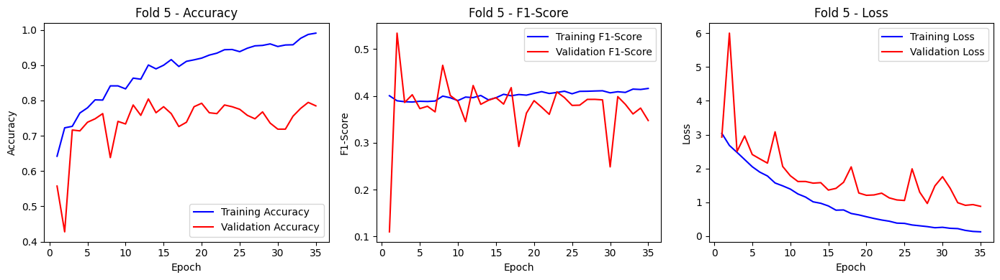

Fold 5 completed successfully!


In [ ]:
# Plotting tuned model
print(f"\nPlotting training history for Fold {fold + 1}...")

accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
f1_score = history.history['f1_score']
val_f1_score = history.history['val_f1_score']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_trained = range(1, len(accuracy) + 1)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 4))

axes[0].plot(epochs_trained, accuracy, 'b', label='Training Accuracy')
axes[0].plot(epochs_trained, val_accuracy, 'r', label='Validation Accuracy')
axes[0].set_title(f'Fold {fold+1} - Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(epochs_trained, f1_score, 'b', label='Training F1-Score')
axes[1].plot(epochs_trained, val_f1_score, 'r', label='Validation F1-Score')
axes[1].set_title(f'Fold {fold+1} - F1-Score')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('F1-Score')
axes[1].legend()

axes[2].plot(epochs_trained, loss, 'b', label='Training Loss')
axes[2].plot(epochs_trained, val_loss, 'r', label='Validation Loss')
axes[2].set_title(f'Fold {fold+1} - Loss')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].legend()

# Adjusting layout for better spacing
plt.tight_layout()

# Display the figure
plt.show()

print(f"Fold {fold + 1} completed successfully!")


In [ ]:
# Tuned Model Evaluation
for fold, (train_idx, val_idx) in enumerate(skf.split(X_all, y_all)):
    try:
        #Classification Report - Tuned
        test_loss, test_acc, test_f1_score = tuned_resnet_model.evaluate(X_val_fold, y_val_fold)

        y_pred = (tuned_resnet_model.predict(X_val_fold) > 0.5).astype(int).flatten()
        y_true = y_val_fold

        # Calculate metrics
        precision = precision_score(y_true, y_pred)
        recall = recall_score(y_true, y_pred)
        f1 = sk_f1_score(y_true, y_pred)

        print(f"\nFold {fold + 1} Results:")
        print(f"  Test Accuracy: {test_acc * 100:.2f}%")
        print(f"  Test Loss: {test_loss:.4f}")
        print(f"  Precision: {precision:.4f}")
        print(f"  Recall: {recall:.4f}")
        print(f"  F1-Score: {f1:.4f}")

        # Store results - MOVED INSIDE THE LOOP
        model_results.append({
            'fold': fold + 1,
            'accuracy': test_acc,
            'loss': test_loss,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'history': history
        })

        print('Classification Report (Tuned):')
        print(classification_report(y_true, y_pred, target_names=['Clean', 'Dusty']))

        K.clear_session()
        gc.collect()

    except Exception as e:
        print(f"[ERROR] Fold {fold + 1} failed during setup: {type(e).__name__} - {e}")
        import traceback
        traceback.print_exc()



# Calculate final results
print("\nRESNET-50 5-FOLD CROSS-VALIDATION RESULTS")

# Extract all metrics
accuracies = [result['accuracy'] for result in model_results]
precisions = [result['precision'] for result in model_results]
recalls = [result['recall'] for result in model_results]
f1_scores = [result['f1_score'] for result in model_results]

# Calculate means and standard deviations
mean_acc = np.mean(accuracies)
std_acc = np.std(accuracies)
mean_precision = np.mean(precisions)
std_precision = np.std(precisions)
mean_recall = np.mean(recalls)
std_recall = np.std(recalls)
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)

# Print results
print(f"\nMean Test Accuracy: {mean_acc * 100:.2f}% ± {std_acc * 100:.2f}%")
print(f"Mean Precision: {mean_precision:.4f} ± {std_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f} ± {std_recall:.4f}")
print(f"Mean F1-Score: {mean_f1:.4f} ± {std_f1:.4f}")

print(f"\nDetailed Results by Fold:")
for i, result in enumerate(model_results):
    print(f"Fold {i+1}: Acc={result['accuracy']*100:.1f}%, "
          f"Prec={result['precision']:.3f}, "
          f"Rec={result['recall']:.3f}, "
          f"F1={result['f1_score']:.3f}")


print("\n=== ResNet-50 5-Fold Cross-Validation Summary ===")

print(f"Total folds attempted: 5")
print(f"\nFolds completed successfully: {len(model_results)}")

if len(model_results) == 0:
    print("ERROR: No folds completed successfully. Check error messages above.")
elif len(model_results) < 5:
    print(f"Warning: Only {len(model_results)} out of 5 folds completed successfully.")
else:
    print("All 5 folds completed successfully!")

13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 220ms/step - accuracy: 0.7690 - f1_score: 0.3799 - loss: 0.8080
13/13 ━━━━━━━━━━━━━━━━━━━━ 8s 362ms/step

Fold 1 Results:
  Test Accuracy: 78.48%
  Test Loss: 0.8798
  Precision: 0.7748
  Recall: 0.6842
  F1-Score: 0.7267
Classification Report (Tuned):
              precision    recall  f1-score   support

       Clean       0.79      0.86      0.82       238
       Dusty       0.77      0.68      0.73       171

    accuracy                           0.78       409
   macro avg       0.78      0.77      0.77       409
weighted avg       0.78      0.78      0.78       409

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - accuracy: 0.7690 - f1_score: 0.3799 - loss: 0.8080
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step

Fold 2 Results:
  Test Accuracy: 78.48%
  Test Loss: 0.8798
  Precision: 0.7748
  Recall: 0.6842
  F1-Score: 0.7267
Classification Report (Tuned):
              precision    recall  f1-score   support

       Clean       0.79      0.86      0.82       238

In [ ]:
# Simulated environmental conditions
def add_brightness(images, factor=1.2):
    return np.clip(images * factor, 0, 1.0)

def add_blur(images, ksize=(3, 3)):
    # Use OpenCV which requires uint8, then convert back
    blurred = []
    for img in images:
        img_uint8 = (img * 255).astype(np.uint8)
        blurred_img = cv2.GaussianBlur(img_uint8, ksize, 0)
        blurred.append(blurred_img.astype(np.float32) / 255.0)
    return np.array(blurred)

def add_noise(images, std=0.05):
    noise = np.random.normal(0, std, images.shape)
    return np.clip(images + noise, 0, 1.0)

# Centralized evaluation function
def evaluate_model_on_augmented_data(model, generator, condition_fn):
    X, y_true = [], []
    generator.reset()

    for x_batch, y_batch in generator:
        X.append(x_batch)
        y_true.extend(y_batch)
        if len(X) * generator.batch_size >= generator.samples:
            break

    X = np.vstack(X).astype(np.float32)  # Already in [0,1] due to test_datagen
    y_true = np.array(y_true).astype(int)

    # Apply environmental distortion
    X_aug = condition_fn(X)

    # Predict
    y_pred = model.predict(X_aug)
    y_pred_class = (y_pred > 0.5).astype(int).flatten()

    # Debug info
    print(f"[DEBUG] Condition: {condition_fn.__name__}")
    print(f"  - y_true class dist: {np.bincount(y_true)}")
    print(f"  - y_pred class dist: {np.bincount(y_pred_class)}")
    print(f"  - Raw preds sample: {np.round(y_pred.flatten()[:5], 3)}")

    acc = accuracy_score(y_true, y_pred_class)
    f1 = sk_f1_score(y_true, y_pred_class, zero_division=0)

    return acc, f1

conditions = {
    "Brightness": add_brightness,
    "Blur": add_blur,
    "Noise": add_noise
}

results = []

resnet_target_size = target_size_map["resnet"]
test_datagen_eval = ImageDataGenerator(rescale = 1./255)

test_generator_eval = test_datagen_eval.flow_from_directory(
    '/content/test',
    target_size = resnet_target_size, # Use the correct target size
    class_mode = 'binary',
    shuffle=False # No need to shuffle for evaluation
)

for cond_name, cond_fn in conditions.items():
    acc, f1 = evaluate_model_on_augmented_data(tuned_resnet_model, test_generator_eval, cond_fn)
    results.append({"Model": "ResNet-50", "Condition": cond_name, "Accuracy": acc, "F1-Score": f1})

df_results = pd.DataFrame(results)
df_results

Found 513 images belonging to 2 classes.
17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 189ms/step
[DEBUG] Condition: add_brightness
  - y_true class dist: [299 214]
  - y_pred class dist: [329 184]
  - Raw preds sample: [0.002 0.    0.001 0.    0.007]
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step
[DEBUG] Condition: add_blur
  - y_true class dist: [299 214]
  - y_pred class dist: [311 202]
  - Raw preds sample: [0.002 0.001 0.    0.    0.021]
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step
[DEBUG] Condition: add_noise
  - y_true class dist: [299 214]
  - y_pred class dist: [323 190]
  - Raw preds sample: [0.001 0.    0.011 0.    0.015]


,Model,Condition,Accuracy,F1-Score
0,ResNet-50,Brightness,0.824561,0.773869
1,ResNet-50,Blur,0.832359,0.793269
2,ResNet-50,Noise,0.832359,0.787129


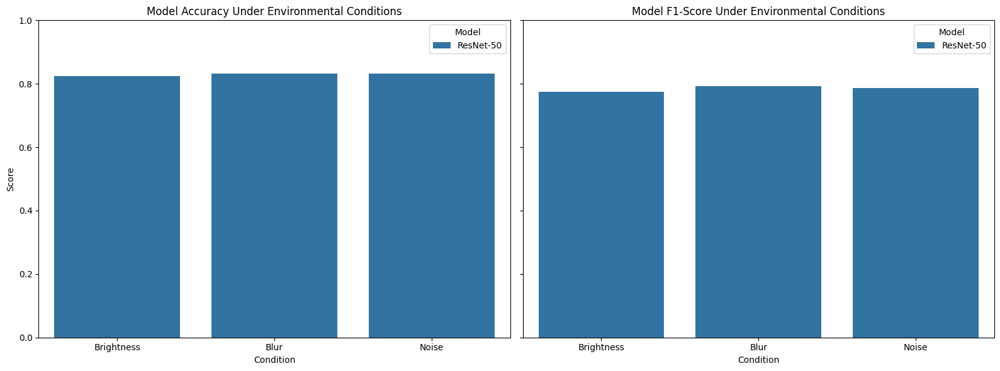

In [ ]:
# visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Accuracy Plot
sns.barplot(
    data=df_results,
    x="Condition",
    y="Accuracy",
    hue="Model",
    ax=axes[0]
)
axes[0].set_title("Model Accuracy Under Environmental Conditions")
axes[0].set_xlabel("Condition")
axes[0].set_ylabel("Score")
axes[0].set_ylim(0, 1)

# F1-Score Plot
sns.barplot(
    data=df_results,
    x="Condition",
    y="F1-Score",
    hue="Model",
    ax=axes[1]
)
axes[1].set_title("Model F1-Score Under Environmental Conditions")
axes[1].set_xlabel("Condition")
axes[1].set_ylabel("")  # Already shown on the left plot
axes[1].set_ylim(0, 1)

# Adjust layout
plt.tight_layout()
plt.show()



Plotting ResNet-50 Cross-Validation Results...


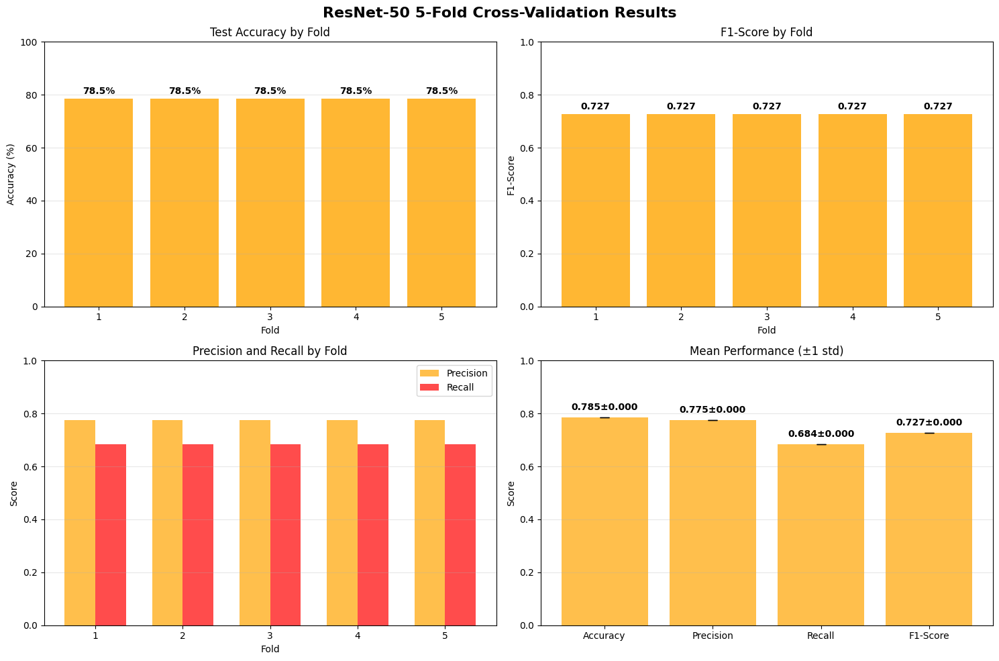

ResNet-50 5-fold cross-validation completed successfully!


In [ ]:
# Create comprehensive plots
print(f"\nPlotting ResNet-50 Cross-Validation Results...")

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('ResNet-50 5-Fold Cross-Validation Results', fontsize=16, fontweight='bold')

fold_numbers = list(range(1, 6))

# Plot 1: Accuracy by fold
bars1 = axes[0, 0].bar(fold_numbers, [acc * 100 for acc in accuracies], color='orange', alpha=0.8)
axes[0, 0].set_title('Test Accuracy by Fold')
axes[0, 0].set_xlabel('Fold')
axes[0, 0].set_ylabel('Accuracy (%)')
axes[0, 0].set_ylim(0, 100)
axes[0, 0].grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, (bar, acc) in enumerate(zip(bars1, accuracies)):
    axes[0, 0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                   f'{acc*100:.1f}%', ha='center', va='bottom', fontweight='bold')

# Plot 2: F1-Score by fold
bars2 = axes[0, 1].bar(fold_numbers, f1_scores, color='orange', alpha=0.8)
axes[0, 1].set_title('F1-Score by Fold')
axes[0, 1].set_xlabel('Fold')
axes[0, 1].set_ylabel('F1-Score')
axes[0, 1].set_ylim(0, 1)
axes[0, 1].grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, (bar, f1) in enumerate(zip(bars2, f1_scores)):
    axes[0, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                   f'{f1:.3f}', ha='center', va='bottom', fontweight='bold')

# Plot 3: Precision and Recall by fold
x = np.arange(len(fold_numbers))
width = 0.35

bars3 = axes[1, 0].bar(x - width/2, precisions, width, label='Precision', color='orange', alpha=0.7)
bars4 = axes[1, 0].bar(x + width/2, recalls, width, label='Recall', color='red', alpha=0.7)
axes[1, 0].set_title('Precision and Recall by Fold')
axes[1, 0].set_xlabel('Fold')
axes[1, 0].set_ylabel('Score')
axes[1, 0].set_xticks(x)
axes[1, 0].set_xticklabels(fold_numbers)
axes[1, 0].legend()
axes[1, 0].set_ylim(0, 1)
axes[1, 0].grid(axis='y', alpha=0.3)

# Plot 4: Summary statistics
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
means = [mean_acc, mean_precision, mean_recall, mean_f1]
stds = [std_acc, std_precision, std_recall, std_f1]

bars5 = axes[1, 1].bar(metrics_names, means, yerr=stds, capsize=5, color='orange', alpha=0.7)
axes[1, 1].set_title('Mean Performance (±1 std)')
axes[1, 1].set_ylabel('Score')
axes[1, 1].set_ylim(0, 1)
axes[1, 1].grid(axis='y', alpha=0.3)

# Add value labels
for i, (bar, mean, std) in enumerate(zip(bars5, means, stds)):
    axes[1, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.02,
                   f'{mean:.3f}±{std:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

print("ResNet-50 5-fold cross-validation completed successfully!")


17/17 ━━━━━━━━━━━━━━━━━━━━ 18s 827ms/step

Final Classification Report (ResNet-50):
              precision    recall  f1-score   support

       Clean       0.82      0.88      0.85       299
       Dusty       0.81      0.74      0.77       214

    accuracy                           0.82       513
   macro avg       0.82      0.81      0.81       513
weighted avg       0.82      0.82      0.82       513



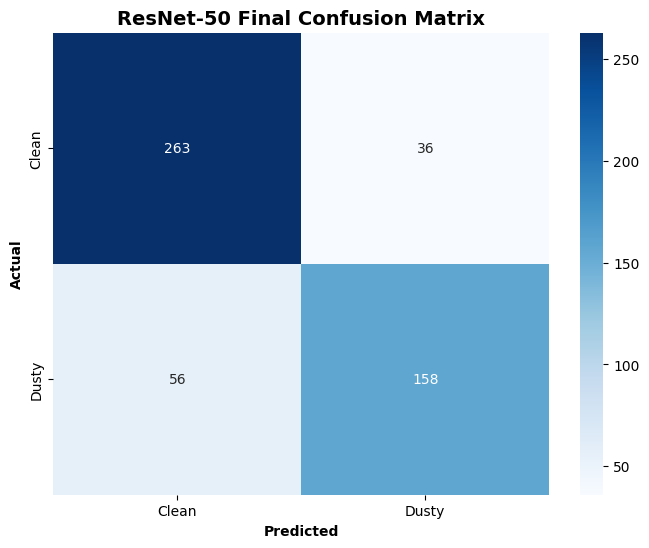

In [ ]:
test_generator_eval.reset()
final_predictions = tuned_resnet_model.predict(test_generator_eval)
y_pred_final = (final_predictions > 0.5).astype(int).flatten()
y_true_final = test_generator_eval.classes

print('\nFinal Classification Report (ResNet-50):')
print(classification_report(y_true_final, y_pred_final, target_names=['Clean', 'Dusty']))

# Confusion Matrix

cm = confusion_matrix(y_true_final, y_pred_final)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Clean', 'Dusty'],
            yticklabels=['Clean', 'Dusty'])
plt.title('ResNet-50 Final Confusion Matrix', fontsize=14, fontweight='bold')
plt.xlabel('Predicted', fontweight='bold')
plt.ylabel('Actual', fontweight='bold')
plt.show()

## 4th Model: MobileNetV2




### pre-train MobileNetV2

In [ ]:
print("\n=== 4TH MODEL: MobileNetV2 ===")
print("\nBuilding MobileNetV2 Pre-trained Model...")

backbone = "mobilenet"
target_size = target_size_map[backbone]
input_shape = target_size + (3,) # input_shape is set to (224, 224, 3)

# Create generators for the current size
train_generator_current, test_generator_current = create_generators(
    target_size, train_dir, test_dir
)

if train_generator_current.samples == 0:
    print("Error: Train generator is empty. No images found in the training directory.")
    # Add more specific directory check
    train_clean_count = len(os.listdir(os.path.join(train_dir, 'Clean'))) if os.path.exists(os.path.join(train_dir, 'Clean')) else 0
    train_dusty_count = len(os.listdir(os.path.join(train_dir, 'Dusty'))) if os.path.exists(os.path.join(train_dir, 'Dusty')) else 0
    print(f"  Images found in {os.path.join(train_dir, 'Clean')}: {train_clean_count}")
    print(f"  Images found in {os.path.join(train_dir, 'Dusty')}: {train_dusty_count}")
    if train_clean_count + train_dusty_count == 0:
         print("  Train directories appear empty. Re-run data splitting steps.")
    raise ValueError("Train generator is empty. Cannot proceed with training.")

if test_generator_current.samples == 0:
    print("Error: Test generator is empty. No images found in the testing directory.")
    test_clean_count = len(os.listdir(os.path.join(test_dir, 'Clean'))) if os.path.exists(os.path.join(test_dir, 'Clean')) else 0
    test_dusty_count = len(os.listdir(os.path.join(test_dir, 'Dusty'))) if os.path.exists(os.path.join(test_dir, 'Dusty')) else 0
    print(f"  Images found in {os.path.join(test_dir, 'Clean')}: {test_clean_count}")
    print(f"  Images found in {os.path.join(test_dir, 'Dusty')}: {test_dusty_count}")
    if test_clean_count + test_dusty_count == 0:
         print("  Test directories appear empty. Re-run data splitting steps.")

def f1_score(y_true, y_pred):
    y_pred = K.round(y_pred)  # Round predicted probabilities to 0 or 1

    tp = K.sum(K.cast(y_true * y_pred, 'float32'))  # True positives
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float32'))  # False positives
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float32'))  # False negatives

    precision = tp / (tp + fp + K.epsilon())  # Add epsilon to avoid division by 0
    recall = tp / (tp + fn + K.epsilon())

    f1 = 2 * precision * recall / (precision + recall + K.epsilon())
    return f1

pre_mobilenet_model = Sequential([
    MobileNetV2(weights='imagenet',
                include_top=False,
                input_shape=input_shape),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Freeze the pre-trained model initially
pre_mobilenet_model.layers[0].trainable = False

pre_mobilenet_model.compile(optimizer=Adam(learning_rate=0.0001),
                        loss='binary_crossentropy',
                        metrics=['accuracy', f1_score])

print("MobileNetV2 model has been built.\n")
pre_mobilenet_model.summary()


=== 4TH MODEL: MobileNetV2 ===

Building MobileNetV2 Pre-trained Model...

Creating data generators for image size: (192, 192)
Found 2049 images belonging to 2 classes.
Found 513 images belonging to 2 classes.

=== Data generators created ===

Training samples: 2049
Testing samples: 513

 Classes: {'Clean': 0, 'Dusty': 1}

 Image size set to: (192, 192)
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
MobileNetV2 model has been built.



Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_192            │ (None, 6, 6, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,081 (9.24 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# Train the pre-trained MobileNetV2 model
history = pre_mobilenet_model.fit(
    train_generator_current,
    validation_data=test_generator_current,
    epochs=5,
    batch_size=8,
    class_weight=calculated_class_weights_dict
)

Epoch 1/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 85s 1s/step - accuracy: 0.5931 - f1_score: 0.3718 - loss: 0.7106 - val_accuracy: 0.7251 - val_f1_score: 0.2867 - val_loss: 0.5560
Epoch 2/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.7026 - f1_score: 0.4339 - loss: 0.5616 - val_accuracy: 0.7602 - val_f1_score: 0.2743 - val_loss: 0.5159
Epoch 3/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.7553 - f1_score: 0.3735 - loss: 0.5117 - val_accuracy: 0.7661 - val_f1_score: 0.3428 - val_loss: 0.5033
Epoch 4/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.7484 - f1_score: 0.4364 - loss: 0.4969 - val_accuracy: 0.7680 - val_f1_score: 0.3441 - val_loss: 0.4882
Epoch 5/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.7675 - f1_score: 0.4350 - loss: 0.4819 - val_accuracy: 0.7739 - val_f1_score: 0.3388 - val_loss: 0.4717


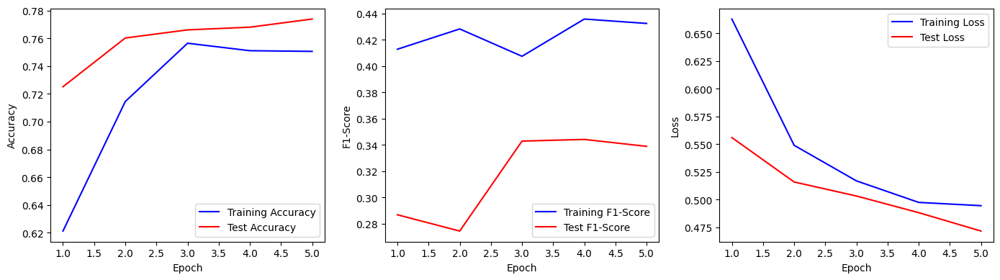

In [ ]:
# Plotting MobileNetV2 pre-trained model
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
f1_score = history.history['f1_score']
val_f1_score = history.history['val_f1_score']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(accuracy) + 1)

# Creating subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 4))

axes[0].plot(epochs, accuracy, 'b', label='Training Accuracy')
axes[0].plot(epochs, val_accuracy, 'r', label='Test Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(epochs, f1_score, 'b', label='Training F1-Score')
axes[1].plot(epochs, val_f1_score, 'r', label='Test F1-Score')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('F1-Score')
axes[1].legend()

axes[2].plot(epochs, loss, 'b', label='Training Loss')
axes[2].plot(epochs, val_loss, 'r', label='Test Loss')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].legend()

# Adjusting layout for better spacing
plt.tight_layout()

# Display the figure
plt.show()


In [ ]:
#Classification Report
test_loss, test_acc, test_f1 = pre_mobilenet_model.evaluate(test_generator_current, verbose=0)

test_generator_current.reset()
predictions = pre_mobilenet_model.predict(test_generator_current, verbose=0)
y_pred = (predictions > 0.5).astype(int).flatten()
y_true = test_generator_current.classes

# Calculate metrics
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = sk_f1_score(y_true, y_pred)

print(f"\nResults:")
print(f"  Test Accuracy: {test_acc * 100:.2f}%")
print(f"  Test Loss: {test_loss:.4f}")
print(f"  Precision: {precision:.4f}")
print(f"  Recall: {recall:.4f}")
print(f"  F1-Score: {f1:.4f}")

model_results = []

# Store results - MOVED INSIDE THE LOOP
model_results.append({
    'accuracy': test_acc,
    'loss': test_loss,
    'precision': precision,
    'recall': recall,
    'f1_score': f1,
    'history': history
})

print('\nClassification Report (Pre-trained):')
print(classification_report(y_true, y_pred, target_names=['Clean', 'Dusty']))

# Calculate final results
print("\nMOBILENETV2 RESULTS")

# Extract all metrics
accuracies = model_results[0]['accuracy']
precisions = model_results[0]['precision']
recalls = model_results[0]['recall']
f1_scores = model_results[0]['f1_score']


# Calculate means and standard deviations
mean_acc = np.mean(accuracies)
std_acc = np.std(accuracies)
mean_precision = np.mean(precisions)
std_precision = np.std(precisions)
mean_recall = np.mean(recalls)
std_recall = np.std(recalls)
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)

# Print results
print(f"\nMean Test Accuracy: {mean_acc * 100:.2f}% ± {std_acc * 100:.2f}%")
print(f"Mean Precision: {mean_precision:.4f} ± {std_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f} ± {std_recall:.4f}")
print(f"Mean F1-Score: {mean_f1:.4f} ± {std_f1:.4f}")


Results:
  Test Accuracy: 77.39%
  Test Loss: 0.4717
  Precision: 0.7168
  Recall: 0.7570
  F1-Score: 0.7364

Classification Report (Pre-trained):
              precision    recall  f1-score   support

       Clean       0.82      0.79      0.80       299
       Dusty       0.72      0.76      0.74       214

    accuracy                           0.77       513
   macro avg       0.77      0.77      0.77       513
weighted avg       0.78      0.77      0.77       513


MOBILENETV2 RESULTS

Mean Test Accuracy: 77.39% ± 0.00%
Mean Precision: 0.7168 ± 0.0000
Mean Recall: 0.7570 ± 0.0000
Mean F1-Score: 0.7364 ± 0.0000


17/17 ━━━━━━━━━━━━━━━━━━━━ 12s 680ms/step


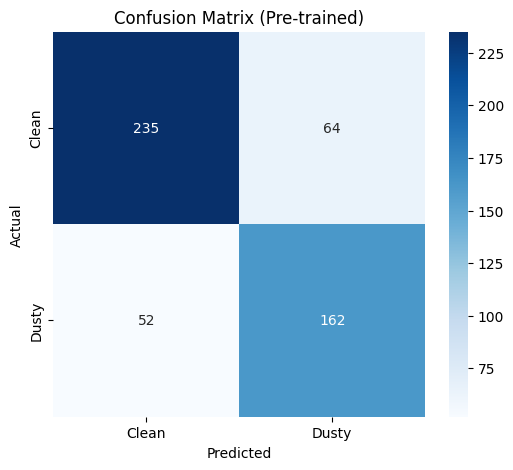

In [ ]:
# Final confusion matrix on the pre-trained model
test_generator_current.reset()
final_predictions = pre_mobilenet_model.predict(test_generator_current)

y_pred_final = (final_predictions > 0.5).astype(int).flatten()
y_true_final = test_generator_current.classes

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Clean', 'Dusty'],
            yticklabels=['Clean', 'Dusty'])
plt.title('Confusion Matrix (Pre-trained)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### Hyperparameter tuning

In [ ]:
print("=== CNN MODEL DEVELOPMENT WITH 5-FOLD CROSS-VALIDATION ===")

print("\nGetting all generator data for MobileNetV2...")

backbone = "mobilenet"
target_size = target_size_map[backbone]
input_shape = target_size + (3,)

# Create generators for the current size
train_generator_current, test_generator_current = create_generators(
    target_size, train_dir, test_dir
)
# Gather all data from train_generator
train_generator_current.reset()
all_images, all_labels = [], []


print("Loading all data from generator...")
for i in range(len(train_generator_current)):
    x_batch, y_batch = train_generator_current[i]
    all_images.append(x_batch)
    all_labels.extend(y_batch)

X_all = np.vstack(all_images)
y_all = np.array(all_labels)

print(f"Total data shape: {X_all.shape}, Labels shape: {y_all.shape}")


# Check for any issues with the data
if len(X_all) == 0:
    raise ValueError("No training data found!")
if len(np.unique(y_all)) < 2:
    raise ValueError("Only one class found in labels!")

def f1_score(y_true, y_pred):
    y_pred = K.round(y_pred)  # Round predicted probabilities to 0 or 1

    tp = K.sum(K.cast(y_true * y_pred, 'float32'))  # True positives
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float32'))  # False positives
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float32'))  # False negatives

    precision = tp / (tp + fp + K.epsilon())  # Add epsilon to avoid division by 0
    recall = tp / (tp + fn + K.epsilon())

    f1 = 2 * precision * recall / (precision + recall + K.epsilon())
    return f1

# Cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
splits = list(skf.split(X_all, y_all))
model_results = []

for fold, (train_idx, val_idx) in enumerate(splits):
    print(f"\n=== STARTING FOLD {fold + 1}/5 ===")

    try:
        X_train_fold = X_all[train_idx]
        y_train_fold = y_all[train_idx]
        X_val_fold = X_all[val_idx]
        y_val_fold = y_all[val_idx]

        print(f"Train: {X_train_fold.shape}, Val: {X_val_fold.shape}")
        print(f"Class distribution in Train: {np.bincount(y_train_fold.astype(int))}")
        print(f"Class distribution in Val: {np.bincount(y_val_fold.astype(int))}")


        # Create model
        print("Creating model...")
        base_model = MobileNetV2(weights='imagenet',
                                    include_top=False,
                                    input_shape=input_shape)

        # After initial model building:
        base_model.trainable = True

        tuned_mobilenet_model = Sequential([
            base_model,
            GlobalAveragePooling2D(),
            BatchNormalization(),
            Dropout(0.3),
            Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
            Dropout(0.3),
            Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01))
        ])

        print("Model created successfully")

        # Setup callbacks
        print("Setting up callbacks...")
        early_stopping = EarlyStopping(monitor='val_loss',
                                      patience=8,
                                      restore_best_weights=True)
        reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                    factor=0.2,
                                    patience=4,
                                    min_lr=1e-6)

        # Compile model
        print("Compiling model...")
        tuned_mobilenet_model.compile(optimizer=Adam(learning_rate=0.0001),
                      loss='binary_crossentropy',
                      metrics=['accuracy', f1_score])

        print("Model compilation completed")
        tuned_mobilenet_model.summary() # Moved summary inside the loop


    except Exception as e:
        print(f"[ERROR] Fold {fold + 1} failed during training or evaluation: {str(e)}")
        print(f"Error type: {type(e).__name__}")
        import traceback
        traceback.print_exc()
        # Clear session even if training failed
        K.clear_session()
        del base_model, tuned_mobilenet_model # Ensure these are deleted if created before the error
        gc.collect()
        print(f"Fold {fold + 1} cleanup done after error.")
        # Continue to next fold


print(f"Fold {fold + 1} completed successfully!")

=== CNN MODEL DEVELOPMENT WITH 5-FOLD CROSS-VALIDATION ===

Getting all generator data for MobileNetV2...

Creating data generators for image size: (192, 192)
Found 2049 images belonging to 2 classes.
Found 513 images belonging to 2 classes.

=== Data generators created ===

Training samples: 2049
Testing samples: 513

 Classes: {'Clean': 0, 'Dusty': 1}

 Image size set to: (192, 192)
Loading all data from generator...
Total data shape: (2049, 192, 192, 3), Labels shape: (2049,)

=== STARTING FOLD 1/5 ===
Train: (1639, 192, 192, 3), Val: (410, 192, 192, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_192            │ (None, 6, 6, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,427,201 (9.26 MB)

 Trainable params: 2,390,529 (9.12 MB)

 Non-trainable params: 36,672 (143.25 KB)


=== STARTING FOLD 2/5 ===
Train: (1639, 192, 192, 3), Val: (410, 192, 192, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_192            │ (None, 6, 6, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,427,201 (9.26 MB)

 Trainable params: 2,390,529 (9.12 MB)

 Non-trainable params: 36,672 (143.25 KB)


=== STARTING FOLD 3/5 ===
Train: (1639, 192, 192, 3), Val: (410, 192, 192, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_192            │ (None, 6, 6, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,427,201 (9.26 MB)

 Trainable params: 2,390,529 (9.12 MB)

 Non-trainable params: 36,672 (143.25 KB)


=== STARTING FOLD 4/5 ===
Train: (1639, 192, 192, 3), Val: (410, 192, 192, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_192            │ (None, 6, 6, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,427,201 (9.26 MB)

 Trainable params: 2,390,529 (9.12 MB)

 Non-trainable params: 36,672 (143.25 KB)


=== STARTING FOLD 5/5 ===
Train: (1640, 192, 192, 3), Val: (409, 192, 192, 3)
Class distribution in Train: [956 684]
Class distribution in Val: [238 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_192            │ (None, 6, 6, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,427,201 (9.26 MB)

 Trainable params: 2,390,529 (9.12 MB)

 Non-trainable params: 36,672 (143.25 KB)

Fold 5 completed successfully!


In [ ]:
# TRAIN MODEL
print(f"Training Fold {fold + 1}...")

history = tuned_mobilenet_model.fit(
    X_train_fold, y_train_fold,
    validation_data=(X_val_fold, y_val_fold),
    epochs=35,
    batch_size=4,
    class_weight=calculated_class_weights_dict,
    callbacks=[early_stopping, reduce_lr]
)

print(f"Fold {fold + 1} completed successfully!")

Training Fold 5...
Epoch 1/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 53s 33ms/step - accuracy: 0.5403 - f1_score: 0.4547 - loss: 3.1996 - val_accuracy: 0.5428 - val_f1_score: 0.5061 - val_loss: 3.2844 - learning_rate: 1.0000e-04
Epoch 2/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6850 - f1_score: 0.3919 - loss: 2.6956 - val_accuracy: 0.5086 - val_f1_score: 0.5195 - val_loss: 3.2862 - learning_rate: 1.0000e-04
Epoch 3/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.7077 - f1_score: 0.4012 - loss: 2.4433 - val_accuracy: 0.5721 - val_f1_score: 0.5022 - val_loss: 2.7795 - learning_rate: 1.0000e-04
Epoch 4/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.7272 - f1_score: 0.4009 - loss: 2.2451 - val_accuracy: 0.6553 - val_f1_score: 0.4728 - val_loss: 2.3518 - learning_rate: 1.0000e-04
Epoch 5/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.7383 - f1_score: 0.3699 - loss: 2.1280 - val_accuracy: 0.5721 - val_f1_score: 0.5152 - val_loss: 2.5233 - learning_ra


Plotting training history for Fold 5...


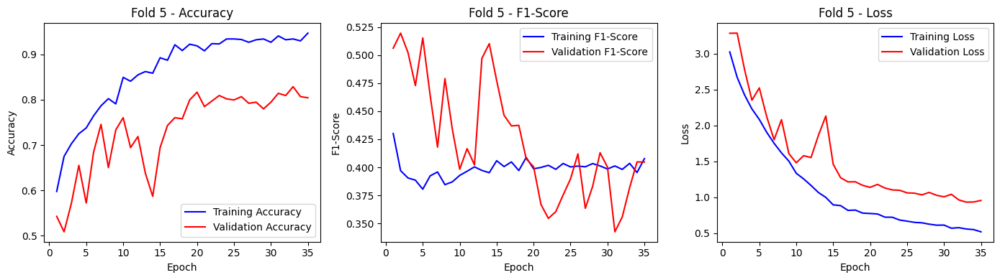

Fold 5 completed successfully!


In [ ]:
# Plotting tuned model
print(f"\nPlotting training history for Fold {fold + 1}...")

accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
f1_score = history.history['f1_score']
val_f1_score = history.history['val_f1_score']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_trained = range(1, len(accuracy) + 1)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 4))

axes[0].plot(epochs_trained, accuracy, 'b', label='Training Accuracy')
axes[0].plot(epochs_trained, val_accuracy, 'r', label='Validation Accuracy')
axes[0].set_title(f'Fold {fold+1} - Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(epochs_trained, f1_score, 'b', label='Training F1-Score')
axes[1].plot(epochs_trained, val_f1_score, 'r', label='Validation F1-Score')
axes[1].set_title(f'Fold {fold+1} - F1-Score')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('F1-Score')
axes[1].legend()

axes[2].plot(epochs_trained, loss, 'b', label='Training Loss')
axes[2].plot(epochs_trained, val_loss, 'r', label='Validation Loss')
axes[2].set_title(f'Fold {fold+1} - Loss')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].legend()

# Adjusting layout for better spacing
plt.tight_layout()

# Display the figure
plt.show()

print(f"Fold {fold + 1} completed successfully!")


In [ ]:
# Tuned Model Evaluation
for fold, (train_idx, val_idx) in enumerate(skf.split(X_all, y_all)):
    try:
        #Classification Report - Tuned
        test_loss, test_acc, test_f1_score = tuned_mobilenet_model.evaluate(X_val_fold, y_val_fold)

        y_pred = (tuned_mobilenet_model.predict(X_val_fold) > 0.5).astype(int).flatten()
        y_true = y_val_fold

        # Calculate metrics
        precision = precision_score(y_true, y_pred)
        recall = recall_score(y_true, y_pred)
        f1 = sk_f1_score(y_true, y_pred)

        print(f"\nFold {fold + 1} Results:")
        print(f"  Test Accuracy: {test_acc * 100:.2f}%")
        print(f"  Test Loss: {test_loss:.4f}")
        print(f"  Precision: {precision:.4f}")
        print(f"  Recall: {recall:.4f}")
        print(f"  F1-Score: {f1:.4f}")

        # Store results - MOVED INSIDE THE LOOP
        model_results.append({
            'fold': fold + 1,
            'accuracy': test_acc,
            'loss': test_loss,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'history': history
        })

        print('Classification Report (Tuned):')
        print(classification_report(y_true, y_pred, target_names=['Clean', 'Dusty']))
        K.clear_session()
        gc.collect()

    except Exception as e:
        print(f"[ERROR] Fold {fold + 1} failed during setup: {type(e).__name__} - {e}")
        import traceback
        traceback.print_exc()

# Calculate final results
print("\nMOBILENETV2 5-FOLD CROSS-VALIDATION RESULTS")

# Extract all metrics
accuracies = [result['accuracy'] for result in model_results]
precisions = [result['precision'] for result in model_results]
recalls = [result['recall'] for result in model_results]
f1_scores = [result['f1_score'] for result in model_results]

# Calculate means and standard deviations
mean_acc = np.mean(accuracies)
std_acc = np.std(accuracies)
mean_precision = np.mean(precisions)
std_precision = np.std(precisions)
mean_recall = np.mean(recalls)
std_recall = np.std(recalls)
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)

# Print results
print(f"\nMean Test Accuracy: {mean_acc * 100:.2f}% ± {std_acc * 100:.2f}%")
print(f"Mean Precision: {mean_precision:.4f} ± {std_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f} ± {std_recall:.4f}")
print(f"Mean F1-Score: {mean_f1:.4f} ± {std_f1:.4f}")

print(f"\nDetailed Results by Fold:")
for i, result in enumerate(model_results):
    print(f"Fold {i+1}: Acc={result['accuracy']*100:.1f}%, "
          f"Prec={result['precision']:.3f}, "
          f"Rec={result['recall']:.3f}, "
          f"F1={result['f1_score']:.3f}")


print("\n=== MobileNetV2 5-Fold Cross-Validation Summary ===")
print(f"Total folds attempted: 5")
print(f"\nFolds completed successfully: {len(model_results)}")

if len(model_results) == 0:
    print("ERROR: No folds completed successfully. Check error messages above.")
elif len(model_results) < 5:
    print(f"Warning: Only {len(model_results)} out of 5 folds completed successfully.")
else:
    print("All 5 folds completed successfully!")

13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 178ms/step - accuracy: 0.8168 - f1_score: 0.4164 - loss: 0.9710
13/13 ━━━━━━━━━━━━━━━━━━━━ 6s 250ms/step

Fold 1 Results:
  Test Accuracy: 82.89%
  Test Loss: 0.9322
  Precision: 0.8061
  Recall: 0.7778
  F1-Score: 0.7917
Classification Report (Tuned):
              precision    recall  f1-score   support

       Clean       0.84      0.87      0.85       238
       Dusty       0.81      0.78      0.79       171

    accuracy                           0.83       409
   macro avg       0.83      0.82      0.82       409
weighted avg       0.83      0.83      0.83       409

13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8168 - f1_score: 0.4164 - loss: 0.9710
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step

Fold 2 Results:
  Test Accuracy: 82.89%
  Test Loss: 0.9322
  Precision: 0.8061
  Recall: 0.7778
  F1-Score: 0.7917
Classification Report (Tuned):
              precision    recall  f1-score   support

       Clean       0.84      0.87      0.85       238


In [ ]:
# Simulated environmental conditions
def add_brightness(images, factor=1.2):
    return np.clip(images * factor, 0, 1.0)

def add_blur(images, ksize=(3, 3)):
    # Use OpenCV which requires uint8, then convert back
    blurred = []
    for img in images:
        img_uint8 = (img * 255).astype(np.uint8)
        blurred_img = cv2.GaussianBlur(img_uint8, ksize, 0)
        blurred.append(blurred_img.astype(np.float32) / 255.0)
    return np.array(blurred)

def add_noise(images, std=0.05):
    noise = np.random.normal(0, std, images.shape)
    return np.clip(images + noise, 0, 1.0)

# Centralized evaluation function
def evaluate_model_on_augmented_data(model, generator, condition_fn):
    X, y_true = [], []
    generator.reset()

    for x_batch, y_batch in generator:
        X.append(x_batch)
        y_true.extend(y_batch)
        if len(X) * generator.batch_size >= generator.samples:
            break

    X = np.vstack(X).astype(np.float32)  # Already in [0,1] due to test_datagen
    y_true = np.array(y_true).astype(int)

    # Apply environmental distortion
    X_aug = condition_fn(X)

    # Predict
    y_pred = model.predict(X_aug)
    y_pred_class = (y_pred > 0.5).astype(int).flatten()

    # Debug info
    print(f"[DEBUG] Condition: {condition_fn.__name__}")
    print(f"  - y_true class dist: {np.bincount(y_true)}")
    print(f"  - y_pred class dist: {np.bincount(y_pred_class)}")
    print(f"  - Raw preds sample: {np.round(y_pred.flatten()[:5], 3)}")

    acc = accuracy_score(y_true, y_pred_class)
    f1 = sk_f1_score(y_true, y_pred_class, zero_division=0)

    return acc, f1

conditions = {
    "Brightness": add_brightness,
    "Blur": add_blur,
    "Noise": add_noise
}

results = []

mobilenet_target_size = target_size_map["mobilenet"]
test_datagen_eval = ImageDataGenerator(rescale = 1./255)

test_generator_eval = test_datagen_eval.flow_from_directory(
    '/content/test',
    target_size = mobilenet_target_size, # Use the correct target size
    class_mode = 'binary',
    shuffle=False # No need to shuffle for evaluation
)

for cond_name, cond_fn in conditions.items():
    acc, f1 = evaluate_model_on_augmented_data(tuned_mobilenet_model, test_generator_eval, cond_fn)
    results.append({"Model": "MobileNetV2", "Condition": cond_name, "Accuracy": acc, "F1-Score": f1})

df_results = pd.DataFrame(results)
df_results

Found 513 images belonging to 2 classes.
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 129ms/step
[DEBUG] Condition: add_brightness
  - y_true class dist: [299 214]
  - y_pred class dist: [340 173]
  - Raw preds sample: [0.001 0.742 0.045 0.041 0.003]
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
[DEBUG] Condition: add_blur
  - y_true class dist: [299 214]
  - y_pred class dist: [327 186]
  - Raw preds sample: [0.015 0.894 0.03  0.006 0.001]
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
[DEBUG] Condition: add_noise
  - y_true class dist: [299 214]
  - y_pred class dist: [325 188]
  - Raw preds sample: [0.002 0.614 0.007 0.369 0.009]


,Model,Condition,Accuracy,F1-Score
0,MobileNetV2,Brightness,0.791423,0.723514
1,MobileNetV2,Blur,0.793372,0.735000
2,MobileNetV2,Noise,0.789474,0.731343


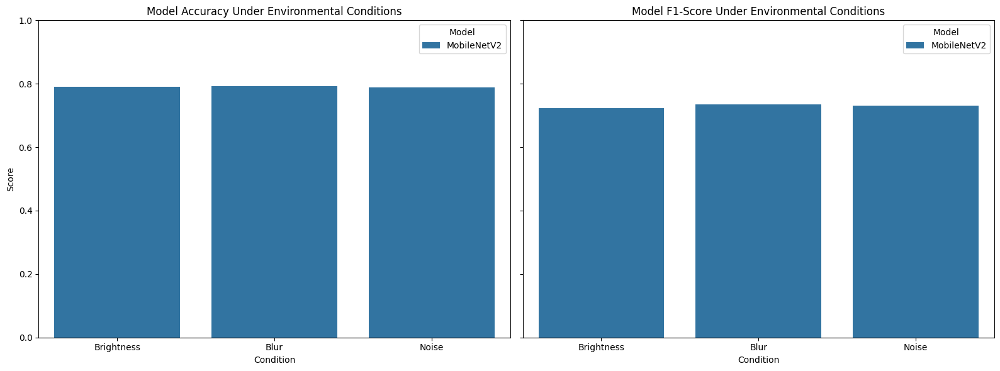

In [ ]:
# visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Accuracy Plot
sns.barplot(
    data=df_results,
    x="Condition",
    y="Accuracy",
    hue="Model",
    ax=axes[0]
)
axes[0].set_title("Model Accuracy Under Environmental Conditions")
axes[0].set_xlabel("Condition")
axes[0].set_ylabel("Score")
axes[0].set_ylim(0, 1)

# F1-Score Plot
sns.barplot(
    data=df_results,
    x="Condition",
    y="F1-Score",
    hue="Model",
    ax=axes[1]
)
axes[1].set_title("Model F1-Score Under Environmental Conditions")
axes[1].set_xlabel("Condition")
axes[1].set_ylabel("")  # Already shown on the left plot
axes[1].set_ylim(0, 1)

# Adjust layout
plt.tight_layout()
plt.show()



Plotting MobileNetV2 Cross-Validation Results...


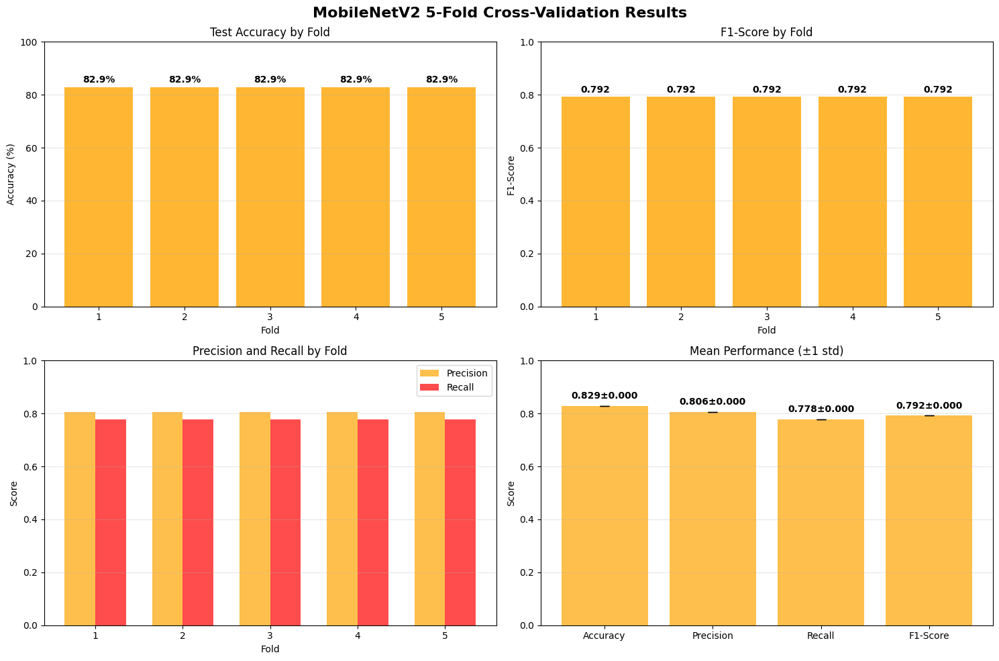

MobileNetV2 5-fold cross-validation completed successfully!


In [ ]:
# Create comprehensive plots
print(f"\nPlotting MobileNetV2 Cross-Validation Results...")

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('MobileNetV2 5-Fold Cross-Validation Results', fontsize=16, fontweight='bold')

fold_numbers = list(range(1, 6))

# Plot 1: Accuracy by fold
bars1 = axes[0, 0].bar(fold_numbers, [acc * 100 for acc in accuracies], color='orange', alpha=0.8)
axes[0, 0].set_title('Test Accuracy by Fold')
axes[0, 0].set_xlabel('Fold')
axes[0, 0].set_ylabel('Accuracy (%)')
axes[0, 0].set_ylim(0, 100)
axes[0, 0].grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, (bar, acc) in enumerate(zip(bars1, accuracies)):
    axes[0, 0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                   f'{acc*100:.1f}%', ha='center', va='bottom', fontweight='bold')

# Plot 2: F1-Score by fold
bars2 = axes[0, 1].bar(fold_numbers, f1_scores, color='orange', alpha=0.8)
axes[0, 1].set_title('F1-Score by Fold')
axes[0, 1].set_xlabel('Fold')
axes[0, 1].set_ylabel('F1-Score')
axes[0, 1].set_ylim(0, 1)
axes[0, 1].grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, (bar, f1) in enumerate(zip(bars2, f1_scores)):
    axes[0, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                   f'{f1:.3f}', ha='center', va='bottom', fontweight='bold')

# Plot 3: Precision and Recall by fold
x = np.arange(len(fold_numbers))
width = 0.35

bars3 = axes[1, 0].bar(x - width/2, precisions, width, label='Precision', color='orange', alpha=0.7)
bars4 = axes[1, 0].bar(x + width/2, recalls, width, label='Recall', color='red', alpha=0.7)
axes[1, 0].set_title('Precision and Recall by Fold')
axes[1, 0].set_xlabel('Fold')
axes[1, 0].set_ylabel('Score')
axes[1, 0].set_xticks(x)
axes[1, 0].set_xticklabels(fold_numbers)
axes[1, 0].legend()
axes[1, 0].set_ylim(0, 1)
axes[1, 0].grid(axis='y', alpha=0.3)

# Plot 4: Summary statistics
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
means = [mean_acc, mean_precision, mean_recall, mean_f1]
stds = [std_acc, std_precision, std_recall, std_f1]

bars5 = axes[1, 1].bar(metrics_names, means, yerr=stds, capsize=5, color='orange', alpha=0.7)
axes[1, 1].set_title('Mean Performance (±1 std)')
axes[1, 1].set_ylabel('Score')
axes[1, 1].set_ylim(0, 1)
axes[1, 1].grid(axis='y', alpha=0.3)

# Add value labels
for i, (bar, mean, std) in enumerate(zip(bars5, means, stds)):
    axes[1, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + std + 0.02,
                   f'{mean:.3f}±{std:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

print("MobileNetV2 5-fold cross-validation completed successfully!")


17/17 ━━━━━━━━━━━━━━━━━━━━ 17s 793ms/step

Final Classification Report (MobileNetV2):
              precision    recall  f1-score   support

       Clean       0.78      0.90      0.84       299
       Dusty       0.83      0.64      0.72       214

    accuracy                           0.80       513
   macro avg       0.80      0.77      0.78       513
weighted avg       0.80      0.80      0.79       513



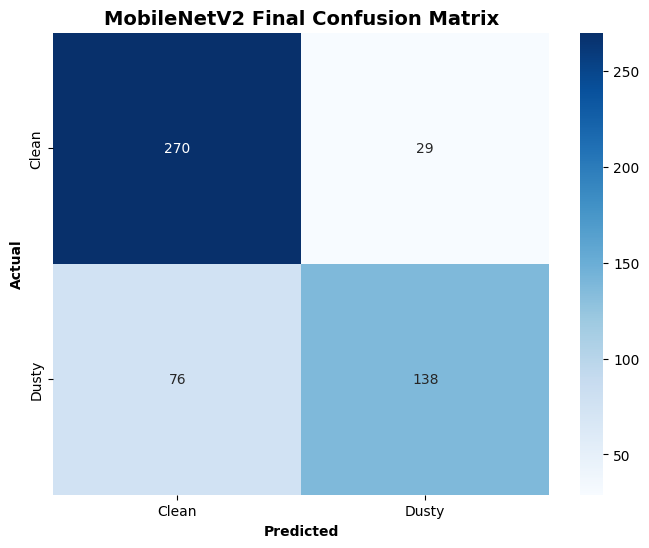

In [ ]:
# Final confusion matrix on the last trained model
test_generator_eval.reset()
final_predictions = tuned_mobilenet_model.predict(test_generator_eval)
y_pred_final = (final_predictions > 0.5).astype(int).flatten()
y_true_final = test_generator_eval.classes

print('\nFinal Classification Report (MobileNetV2):')
print(classification_report(y_true_final, y_pred_final, target_names=['Clean', 'Dusty']))

# Confusion Matrix

cm = confusion_matrix(y_true_final, y_pred_final)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Clean', 'Dusty'],
            yticklabels=['Clean', 'Dusty'])
plt.title('MobileNetV2 Final Confusion Matrix', fontsize=14, fontweight='bold')
plt.xlabel('Predicted', fontweight='bold')
plt.ylabel('Actual', fontweight='bold')
plt.show()

## 5th Model: VGG16

### Pre-train VGG16

In [ ]:
print("\n=== 5TH MODEL: VGG16 ===")
print("\nBuilding VGG16 Pre-trained Model...")

backbone = "vgg16"
target_size = target_size_map[backbone]
input_shape = target_size + (3,)

# Create generators for the current size
train_generator_current, test_generator_current = create_generators(
    target_size, train_dir, test_dir
)

if train_generator_current.samples == 0:
    print("Error: Train generator is empty. No images found in the training directory.")
    # Add more specific directory check
    train_clean_count = len(os.listdir(os.path.join(train_dir, 'Clean'))) if os.path.exists(os.path.join(train_dir, 'Clean')) else 0
    train_dusty_count = len(os.listdir(os.path.join(train_dir, 'Dusty'))) if os.path.exists(os.path.join(train_dir, 'Dusty')) else 0
    print(f"  Images found in {os.path.join(train_dir, 'Clean')}: {train_clean_count}")
    print(f"  Images found in {os.path.join(train_dir, 'Dusty')}: {train_dusty_count}")
    if train_clean_count + train_dusty_count == 0:
         print("  Train directories appear empty. Re-run data splitting steps.")
    raise ValueError("Train generator is empty. Cannot proceed with training.")

if test_generator_current.samples == 0:
    print("Error: Test generator is empty. No images found in the testing directory.")
    test_clean_count = len(os.listdir(os.path.join(test_dir, 'Clean'))) if os.path.exists(os.path.join(test_dir, 'Clean')) else 0
    test_dusty_count = len(os.listdir(os.path.join(test_dir, 'Dusty'))) if os.path.exists(os.path.join(test_dir, 'Dusty')) else 0
    print(f"  Images found in {os.path.join(test_dir, 'Clean')}: {test_clean_count}")
    print(f"  Images found in {os.path.join(test_dir, 'Dusty')}: {test_dusty_count}")
    if test_clean_count + test_dusty_count == 0:
         print("  Test directories appear empty. Re-run data splitting steps.")

def f1_score(y_true, y_pred):
    y_pred = K.round(y_pred)  # Round predicted probabilities to 0 or 1

    tp = K.sum(K.cast(y_true * y_pred, 'float32'))  # True positives
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float32'))  # False positives
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float32'))  # False negatives

    precision = tp / (tp + fp + K.epsilon())  # Add epsilon to avoid division by 0
    recall = tp / (tp + fn + K.epsilon())

    f1 = 2 * precision * recall / (precision + recall + K.epsilon())
    return f1

pre_vgg_model = Sequential([
    VGG16(weights='imagenet',
                include_top=False,
                input_shape=input_shape),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')
])

# Freeze the pre-trained model initially
pre_vgg_model.layers[0].trainable = False

pre_vgg_model.compile(optimizer=Adam(learning_rate=0.0001),
                        loss='binary_crossentropy',
                        metrics=['accuracy', f1_score])

print("VGG16 model has been built.\n")
pre_vgg_model.summary()


=== 5TH MODEL: VGG16 ===

Building VGG16 Pre-trained Model...

Creating data generators for image size: (224, 224)
Found 2049 images belonging to 2 classes.
Found 513 images belonging to 2 classes.

=== Data generators created ===

Training samples: 2049
Testing samples: 513

 Classes: {'Clean': 0, 'Dusty': 1}

 Image size set to: (224, 224)
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
VGG16 model has been built.



Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,780,481 (56.38 MB)

 Trainable params: 65,793 (257.00 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
# Train the pre-trained VGG16 model
history = pre_vgg_model.fit(
    train_generator_current,
    validation_data=test_generator_current,
    epochs=5,
    batch_size=8,
    class_weight=calculated_class_weights_dict
)

Epoch 1/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 95s 1s/step - accuracy: 0.6108 - f1_score: 0.3062 - loss: 0.6826 - val_accuracy: 0.6452 - val_f1_score: 0.3085 - val_loss: 0.6552
Epoch 2/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - accuracy: 0.6890 - f1_score: 0.3384 - loss: 0.6499 - val_accuracy: 0.6511 - val_f1_score: 0.3633 - val_loss: 0.6423
Epoch 3/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.6387 - f1_score: 0.4797 - loss: 0.6457 - val_accuracy: 0.7232 - val_f1_score: 0.3118 - val_loss: 0.6120
Epoch 4/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.6644 - f1_score: 0.4430 - loss: 0.6318 - val_accuracy: 0.7251 - val_f1_score: 0.3182 - val_loss: 0.5983
Epoch 5/5
65/65 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.6574 - f1_score: 0.4504 - loss: 0.6303 - val_accuracy: 0.7329 - val_f1_score: 0.3208 - val_loss: 0.5890


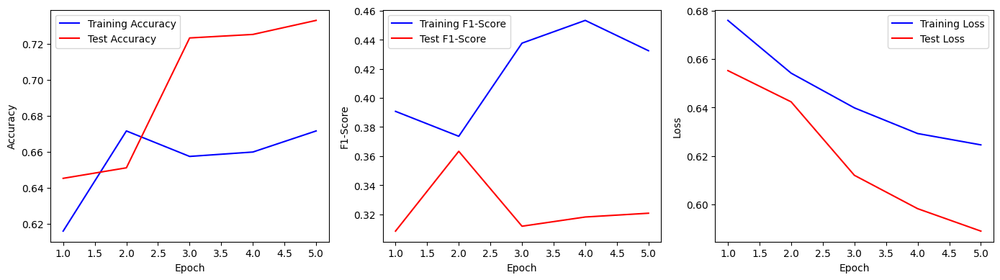

In [ ]:
# Plotting VGG16 pre-trained model
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
f1_score = history.history['f1_score']
val_f1_score = history.history['val_f1_score']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(accuracy) + 1)

# Creating subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 4))

axes[0].plot(epochs, accuracy, 'b', label='Training Accuracy')
axes[0].plot(epochs, val_accuracy, 'r', label='Test Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(epochs, f1_score, 'b', label='Training F1-Score')
axes[1].plot(epochs, val_f1_score, 'r', label='Test F1-Score')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('F1-Score')
axes[1].legend()

axes[2].plot(epochs, loss, 'b', label='Training Loss')
axes[2].plot(epochs, val_loss, 'r', label='Test Loss')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].legend()

# Adjusting layout for better spacing
plt.tight_layout()

# Display the figure
plt.show()


In [ ]:
#Classification Report
test_loss, test_acc, test_f1 = pre_vgg_model.evaluate(test_generator_current, verbose=0)

test_generator.reset()
predictions = pre_vgg_model.predict(test_generator_current, verbose=0)
y_pred = (predictions > 0.5).astype(int).flatten()
y_true = test_generator.classes

# Calculate metrics
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = sk_f1_score(y_true, y_pred)

print(f"\nResults:")
print(f"  Test Accuracy: {test_acc * 100:.2f}%")
print(f"  Test Loss: {test_loss:.4f}")
print(f"  Precision: {precision:.4f}")
print(f"  Recall: {recall:.4f}")
print(f"  F1-Score: {f1:.4f}")

model_results = []

# Store results - MOVED INSIDE THE LOOP
model_results.append({
    'accuracy': test_acc,
    'loss': test_loss,
    'precision': precision,
    'recall': recall,
    'f1_score': f1,
    'history': history
})

print('\nClassification Report (Pre-trained):')
print(classification_report(y_true, y_pred, target_names=['Clean', 'Dusty']))

# Calculate final results
print("\nVGG16 RESULTS")

# Extract all metrics
accuracies = model_results[0]['accuracy']
precisions = model_results[0]['precision']
recalls = model_results[0]['recall']
f1_scores = model_results[0]['f1_score']


# Calculate means and standard deviations
mean_acc = np.mean(accuracies)
std_acc = np.std(accuracies)
mean_precision = np.mean(precisions)
std_precision = np.std(precisions)
mean_recall = np.mean(recalls)
std_recall = np.std(recalls)
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)

# Print results
print(f"\nMean Test Accuracy: {mean_acc * 100:.2f}% ± {std_acc * 100:.2f}%")
print(f"Mean Precision: {mean_precision:.4f} ± {std_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f} ± {std_recall:.4f}")
print(f"Mean F1-Score: {mean_f1:.4f} ± {std_f1:.4f}")


Results:
  Test Accuracy: 73.29%
  Test Loss: 0.5890
  Precision: 0.6791
  Recall: 0.6822
  F1-Score: 0.6807

Classification Report (Pre-trained):
              precision    recall  f1-score   support

       Clean       0.77      0.77      0.77       299
       Dusty       0.68      0.68      0.68       214

    accuracy                           0.73       513
   macro avg       0.73      0.73      0.73       513
weighted avg       0.73      0.73      0.73       513


VGG16 RESULTS

Mean Test Accuracy: 73.29% ± 0.00%
Mean Precision: 0.6791 ± 0.0000
Mean Recall: 0.6822 ± 0.0000
Mean F1-Score: 0.6807 ± 0.0000


17/17 ━━━━━━━━━━━━━━━━━━━━ 13s 691ms/step


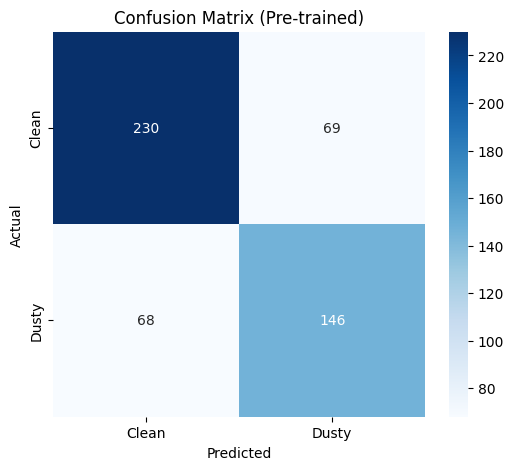

In [ ]:
# Final confusion matrix on the pre-trained model
test_generator_current.reset()
final_predictions = pre_vgg_model.predict(test_generator_current)

y_pred_final = (final_predictions > 0.5).astype(int).flatten()
y_true_final = test_generator_current.classes

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Clean', 'Dusty'],
            yticklabels=['Clean', 'Dusty'])
plt.title('Confusion Matrix (Pre-trained)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### Hyperparameter tuning

In [ ]:
print("=== CNN MODEL DEVELOPMENT WITH 5-FOLD CROSS-VALIDATION ===")
print("\nGetting all generator data for VGG16...")

backbone = "vgg16"
target_size = target_size_map[backbone]
input_shape = target_size + (3,)

# Create generators for the current size
train_generator_current, test_generator_current = create_generators(
    target_size, train_dir, test_dir
)
# Gather all data from train_generator
train_generator_current.reset()
all_images, all_labels = [], []


print("Loading all data from generator...")
for i in range(len(train_generator_current)):
    x_batch, y_batch = train_generator_current[i]
    all_images.append(x_batch)
    all_labels.extend(y_batch)

X_all = np.vstack(all_images)
y_all = np.array(all_labels)

print(f"Total data shape: {X_all.shape}, Labels shape: {y_all.shape}")


# Check for any issues with the data
if len(X_all) == 0:
    raise ValueError("No training data found!")
if len(np.unique(y_all)) < 2:
    raise ValueError("Only one class found in labels!")

def f1_score(y_true, y_pred):
    y_pred = K.round(y_pred)  # Round predicted probabilities to 0 or 1

    tp = K.sum(K.cast(y_true * y_pred, 'float32'))  # True positives
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float32'))  # False positives
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float32'))  # False negatives

    precision = tp / (tp + fp + K.epsilon())  # Add epsilon to avoid division by 0
    recall = tp / (tp + fn + K.epsilon())

    f1 = 2 * precision * recall / (precision + recall + K.epsilon())
    return f1

# Cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
splits = list(skf.split(X_all, y_all))
model_results = []

for fold, (train_idx, val_idx) in enumerate(splits):
    print(f"\n=== STARTING FOLD {fold + 1}/5 ===")

    try:
        X_train_fold = X_all[train_idx]
        y_train_fold = y_all[train_idx]
        X_val_fold = X_all[val_idx]
        y_val_fold = y_all[val_idx]

        print(f"Train: {X_train_fold.shape}, Val: {X_val_fold.shape}")
        print(f"Class distribution in Train: {np.bincount(y_train_fold.astype(int))}")
        print(f"Class distribution in Val: {np.bincount(y_val_fold.astype(int))}")


        # Create model
        print("Creating model...")
        base_model = VGG16(weights='imagenet',
                            include_top=False,
                            input_shape=input_shape)

        # After initial model building:
        base_model.trainable = True

        tuned_vgg_model = Sequential([
            base_model,
            GlobalAveragePooling2D(),
            BatchNormalization(),
            Dropout(0.3),
            Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
            Dropout(0.3),
            Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01))
        ])

        print("Model created successfully")

        # Setup callbacks
        print("Setting up callbacks...")
        early_stopping = EarlyStopping(monitor='val_loss',
                                      patience=8,
                                      restore_best_weights=True)
        reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                    factor=0.2,
                                    patience=4,
                                    min_lr=1e-6)

        # Compile model
        print("Compiling model...")
        tuned_vgg_model.compile(optimizer=Adam(learning_rate=0.0001),
                      loss='binary_crossentropy',
                      metrics=['accuracy', f1_score])

        print("Model compilation completed")
        tuned_vgg_model.summary() # Moved summary inside the loop


    except Exception as e:
        print(f"[ERROR] Fold {fold + 1} failed during training or evaluation: {str(e)}")
        print(f"Error type: {type(e).__name__}")
        import traceback
        traceback.print_exc()
        # Clear session even if training failed
        K.clear_session()
        del base_model, tuned_vgg_model # Ensure these are deleted if created before the error
        gc.collect()
        print(f"Fold {fold + 1} cleanup done after error.")
        # Continue to next fold

print(f"Fold {fold + 1} completed successfully!")

=== CNN MODEL DEVELOPMENT WITH 5-FOLD CROSS-VALIDATION ===

Getting all generator data for VGG16...

Creating data generators for image size: (224, 224)
Found 2049 images belonging to 2 classes.
Found 513 images belonging to 2 classes.

=== Data generators created ===

Training samples: 2049
Testing samples: 513

 Classes: {'Clean': 0, 'Dusty': 1}

 Image size set to: (224, 224)
Loading all data from generator...
Total data shape: (2049, 224, 224, 3), Labels shape: (2049,)

=== STARTING FOLD 1/5 ===
Train: (1639, 224, 224, 3), Val: (410, 224, 224, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,782,529 (56.39 MB)

 Trainable params: 14,781,505 (56.39 MB)

 Non-trainable params: 1,024 (4.00 KB)


=== STARTING FOLD 2/5 ===
Train: (1639, 224, 224, 3), Val: (410, 224, 224, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,782,529 (56.39 MB)

 Trainable params: 14,781,505 (56.39 MB)

 Non-trainable params: 1,024 (4.00 KB)


=== STARTING FOLD 3/5 ===
Train: (1639, 224, 224, 3), Val: (410, 224, 224, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,782,529 (56.39 MB)

 Trainable params: 14,781,505 (56.39 MB)

 Non-trainable params: 1,024 (4.00 KB)


=== STARTING FOLD 4/5 ===
Train: (1639, 224, 224, 3), Val: (410, 224, 224, 3)
Class distribution in Train: [955 684]
Class distribution in Val: [239 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,782,529 (56.39 MB)

 Trainable params: 14,781,505 (56.39 MB)

 Non-trainable params: 1,024 (4.00 KB)


=== STARTING FOLD 5/5 ===
Train: (1640, 224, 224, 3), Val: (409, 224, 224, 3)
Class distribution in Train: [956 684]
Class distribution in Val: [238 171]
Creating model...
Model created successfully
Setting up callbacks...
Compiling model...
Model compilation completed


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,782,529 (56.39 MB)

 Trainable params: 14,781,505 (56.39 MB)

 Non-trainable params: 1,024 (4.00 KB)

Fold 5 completed successfully!


In [ ]:
# TRAIN MODEL
print(f"Training Fold {fold + 1}...")

history = tuned_vgg_model.fit(
    X_train_fold, y_train_fold,
    validation_data=(X_val_fold, y_val_fold),
    epochs=35,
    batch_size=4,
    class_weight=calculated_class_weights_dict,
    callbacks=[early_stopping, reduce_lr]
)

print(f"Fold {fold + 1} completed successfully!")

Training Fold 5...
Epoch 1/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 52s 109ms/step - accuracy: 0.5336 - f1_score: 0.3195 - loss: 2.5306 - val_accuracy: 0.5892 - val_f1_score: 0.0108 - val_loss: 1.8690 - learning_rate: 1.0000e-04
Epoch 2/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.5957 - f1_score: 0.4057 - loss: 1.7251 - val_accuracy: 0.5819 - val_f1_score: 0.0000e+00 - val_loss: 1.7645 - learning_rate: 1.0000e-04
Epoch 3/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.6115 - f1_score: 0.3819 - loss: 1.2911 - val_accuracy: 0.6626 - val_f1_score: 0.1152 - val_loss: 1.2060 - learning_rate: 1.0000e-04
Epoch 4/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 42s 103ms/step - accuracy: 0.6731 - f1_score: 0.3821 - loss: 1.0353 - val_accuracy: 0.4645 - val_f1_score: 0.5354 - val_loss: 1.3514 - learning_rate: 1.0000e-04
Epoch 5/35
410/410 ━━━━━━━━━━━━━━━━━━━━ 42s 104ms/step - accuracy: 0.6590 - f1_score: 0.4078 - loss: 0.8994 - val_accuracy: 0.6968 - val_f1_score: 0.3468 - val_loss: 0.7928 


Plotting training history for Fold 5...


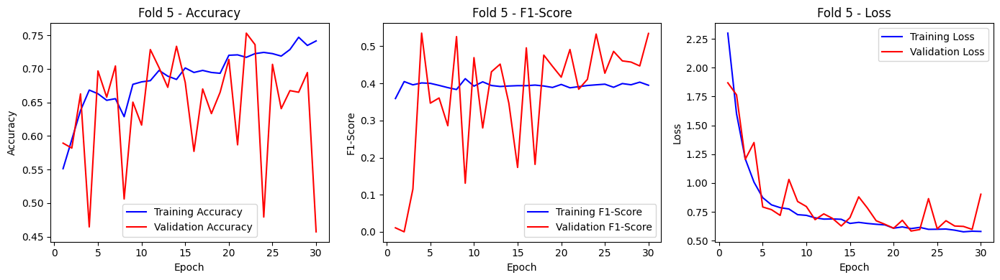

Fold 5 completed successfully!


In [ ]:
# Plotting tuned model
print(f"\nPlotting training history for Fold {fold + 1}...")

accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
f1_score = history.history['f1_score']
val_f1_score = history.history['val_f1_score']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_trained = range(1, len(accuracy) + 1)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(14, 4))

axes[0].plot(epochs_trained, accuracy, 'b', label='Training Accuracy')
axes[0].plot(epochs_trained, val_accuracy, 'r', label='Validation Accuracy')
axes[0].set_title(f'Fold {fold+1} - Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(epochs_trained, f1_score, 'b', label='Training F1-Score')
axes[1].plot(epochs_trained, val_f1_score, 'r', label='Validation F1-Score')
axes[1].set_title(f'Fold {fold+1} - F1-Score')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('F1-Score')
axes[1].legend()

axes[2].plot(epochs_trained, loss, 'b', label='Training Loss')
axes[2].plot(epochs_trained, val_loss, 'r', label='Validation Loss')
axes[2].set_title(f'Fold {fold+1} - Loss')
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('Loss')
axes[2].legend()

# Adjusting layout for better spacing
plt.tight_layout()

# Display the figure
plt.show()

print(f"Fold {fold + 1} completed successfully!")


In [ ]:
# Tuned Model Evaluation
for fold, (train_idx, val_idx) in enumerate(skf.split(X_all, y_all)):
    try:
        #Classification Report - Tuned
        test_loss, test_acc, test_f1_score = tuned_vgg_model.evaluate(X_val_fold, y_val_fold)
        y_pred = (tuned_vgg_model.predict(X_val_fold) > 0.5).astype(int).flatten()
        y_true = y_val_fold

        # Calculate metrics
        precision = precision_score(y_true, y_pred)
        recall = recall_score(y_true, y_pred)
        f1 = sk_f1_score(y_true, y_pred)

        print(f"\nFold {fold + 1} Results:")
        print(f"  Test Accuracy: {test_acc * 100:.2f}%")
        print(f"  Test Loss: {test_loss:.4f}")
        print(f"  Precision: {precision:.4f}")
        print(f"  Recall: {recall:.4f}")
        print(f"  F1-Score: {f1:.4f}")

        # Store results - MOVED INSIDE THE LOOP
        model_results.append({
            'fold': fold + 1,
            'accuracy': test_acc,
            'loss': test_loss,
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'history': history
        })
        print('Classification Report (Tuned):')
        print(classification_report(y_true, y_pred, target_names=['Clean', 'Dusty']))

        K.clear_session()
        gc.collect()

    except Exception as e:
        print(f"[ERROR] Fold {fold + 1} failed during setup: {type(e).__name__} - {e}")
        import traceback
        traceback.print_exc()

# Calculate final results
print("\nVGG16 5-FOLD CROSS-VALIDATION RESULTS")
# Extract all metrics
accuracies = [result['accuracy'] for result in model_results]
precisions = [result['precision'] for result in model_results]
recalls = [result['recall'] for result in model_results]
f1_scores = [result['f1_score'] for result in model_results]

# Calculate means and standard deviations
mean_acc = np.mean(accuracies)
std_acc = np.std(accuracies)
mean_precision = np.mean(precisions)
std_precision = np.std(precisions)
mean_recall = np.mean(recalls)
std_recall = np.std(recalls)
mean_f1 = np.mean(f1_scores)
std_f1 = np.std(f1_scores)

# Print results
print(f"\nMean Test Accuracy: {mean_acc * 100:.2f}% ± {std_acc * 100:.2f}%")
print(f"Mean Precision: {mean_precision:.4f} ± {std_precision:.4f}")
print(f"Mean Recall: {mean_recall:.4f} ± {std_recall:.4f}")
print(f"Mean F1-Score: {mean_f1:.4f} ± {std_f1:.4f}")

print(f"\nDetailed Results by Fold:")
for i, result in enumerate(model_results):
    print(f"Fold {i+1}: Acc={result['accuracy']*100:.1f}%, "
          f"Prec={result['precision']:.3f}, "
          f"Rec={result['recall']:.3f}, "
          f"F1={result['f1_score']:.3f}")

print("\n=== VGG16 5-Fold Cross-Validation Summary ===")
print(f"Total folds attempted: 5")
print(f"\nFolds completed successfully: {len(model_results)}")

if len(model_results) == 0:
    print("ERROR: No folds completed successfully. Check error messages above.")
elif len(model_results) < 5:
    print(f"Warning: Only {len(model_results)} out of 5 folds completed successfully.")
else:
    print("All 5 folds completed successfully!")

13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 203ms/step - accuracy: 0.7641 - f1_score: 0.4287 - loss: 0.5838
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 198ms/step

Fold 1 Results:
  Test Accuracy: 75.31%
  Test Loss: 0.5845
  Precision: 0.6989
  Recall: 0.7193
  F1-Score: 0.7089
Classification Report (Tuned):
              precision    recall  f1-score   support

       Clean       0.79      0.78      0.79       238
       Dusty       0.70      0.72      0.71       171

    accuracy                           0.75       409
   macro avg       0.75      0.75      0.75       409
weighted avg       0.75      0.75      0.75       409

13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - accuracy: 0.7641 - f1_score: 0.4287 - loss: 0.5838
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step

Fold 2 Results:
  Test Accuracy: 75.31%
  Test Loss: 0.5845
  Precision: 0.6989
  Recall: 0.7193
  F1-Score: 0.7089
Classification Report (Tuned):
              precision    recall  f1-score   support

       Clean       0.79      0.78      0.79       23

In [ ]:
# Simulated environmental conditions
def add_brightness(images, factor=1.2):
    return np.clip(images * factor, 0, 1.0)

def add_blur(images, ksize=(3, 3)):
    # Use OpenCV which requires uint8, then convert back
    blurred = []
    for img in images:
        img_uint8 = (img * 255).astype(np.uint8)
        blurred_img = cv2.GaussianBlur(img_uint8, ksize, 0)
        blurred.append(blurred_img.astype(np.float32) / 255.0)
    return np.array(blurred)

def add_noise(images, std=0.05):
    noise = np.random.normal(0, std, images.shape)
    return np.clip(images + noise, 0, 1.0)

# Centralized evaluation function
def evaluate_model_on_augmented_data(model, generator, condition_fn):
    X, y_true = [], []
    generator.reset()

    for x_batch, y_batch in generator:
        X.append(x_batch)
        y_true.extend(y_batch)
        if len(X) * generator.batch_size >= generator.samples:
            break

    X = np.vstack(X).astype(np.float32)  # Already in [0,1] due to test_datagen
    y_true = np.array(y_true).astype(int)

    # Apply environmental distortion
    X_aug = condition_fn(X)

    # Predict
    y_pred = model.predict(X_aug)
    y_pred_class = (y_pred > 0.5).astype(int).flatten()

    # Debug info
    print(f"[DEBUG] Condition: {condition_fn.__name__}")
    print(f"  - y_true class dist: {np.bincount(y_true)}")
    print(f"  - y_pred class dist: {np.bincount(y_pred_class)}")
    print(f"  - Raw preds sample: {np.round(y_pred.flatten()[:5], 3)}")

    acc = accuracy_score(y_true, y_pred_class)
    f1 = sk_f1_score(y_true, y_pred_class, zero_division=0)

    return acc, f1

conditions = {
    "Brightness": add_brightness,
    "Blur": add_blur,
    "Noise": add_noise
}

results = []

vgg_target_size = target_size_map["vgg16"]
test_datagen_eval = ImageDataGenerator(rescale = 1./255)

test_generator_eval = test_datagen_eval.flow_from_directory(
    '/content/test',
    target_size = vgg_target_size, # Use the correct target size
    class_mode = 'binary',
    shuffle=False # No need to shuffle for evaluation
)

for cond_name, cond_fn in conditions.items():
    acc, f1 = evaluate_model_on_augmented_data(tuned_vgg_model, test_generator_eval, cond_fn)
    results.append({"Model": "VGG16", "Condition": cond_name, "Accuracy": acc, "F1-Score": f1})

df_results = pd.DataFrame(results)
df_results

Found 513 images belonging to 2 classes.
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 172ms/step
[DEBUG] Condition: add_brightness
  - y_true class dist: [299 214]
  - y_pred class dist: [261 252]
  - Raw preds sample: [0.185 0.519 0.465 0.4   0.338]
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step
[DEBUG] Condition: add_blur
  - y_true class dist: [299 214]
  - y_pred class dist: [273 240]
  - Raw preds sample: [0.231 0.367 0.418 0.4   0.357]
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step
[DEBUG] Condition: add_noise
  - y_true class dist: [299 214]
  - y_pred class dist: [262 251]
  - Raw preds sample: [0.179 0.419 0.392 0.438 0.334]


,Model,Condition,Accuracy,F1-Score
0,VGG16,Brightness,0.769981,0.746781
1,VGG16,Blur,0.797271,0.770925
2,VGG16,Noise,0.764133,0.739785


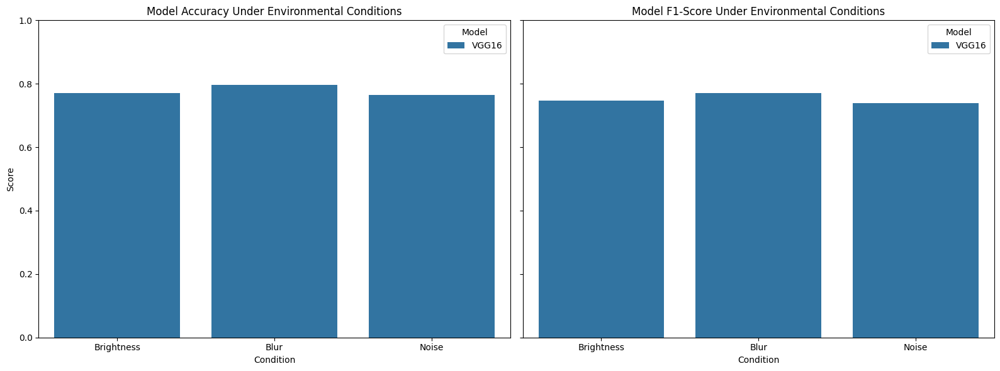

In [ ]:
# visualize
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Accuracy Plot
sns.barplot(
    data=df_results,
    x="Condition",
    y="Accuracy",
    hue="Model",
    ax=axes[0]
)
axes[0].set_title("Model Accuracy Under Environmental Conditions")
axes[0].set_xlabel("Condition")
axes[0].set_ylabel("Score")
axes[0].set_ylim(0, 1)

# F1-Score Plot
sns.barplot(
    data=df_results,
    x="Condition",
    y="F1-Score",
    hue="Model",
    ax=axes[1]
)
axes[1].set_title("Model F1-Score Under Environmental Conditions")
axes[1].set_xlabel("Condition")
axes[1].set_ylabel("")  # Already shown on the left plot
axes[1].set_ylim(0, 1)

# Adjust layout
plt.tight_layout()
plt.show()


17/17 ━━━━━━━━━━━━━━━━━━━━ 13s 665ms/step

Final Classification Report (VGG16):
              precision    recall  f1-score   support

       Clean       0.85      0.74      0.79       299
       Dusty       0.69      0.82      0.75       214

    accuracy                           0.77       513
   macro avg       0.77      0.78      0.77       513
weighted avg       0.79      0.77      0.78       513



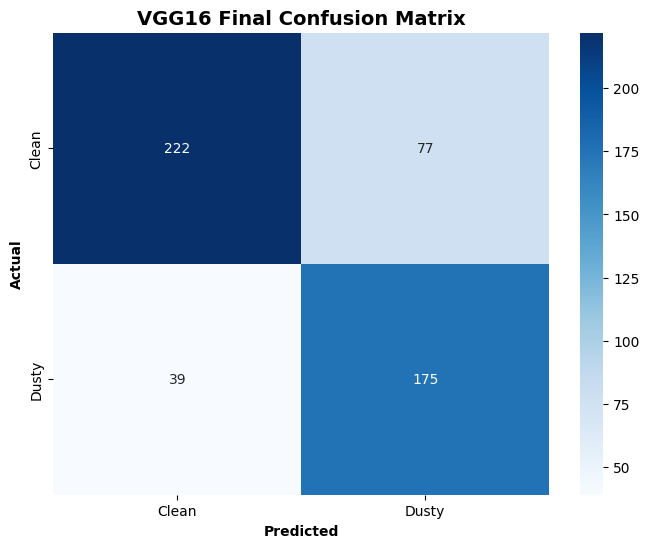

In [ ]:
# Final confusion matrix on the last trained model
test_generator_eval.reset()
final_predictions = tuned_vgg_model.predict(test_generator_eval)
y_pred_final = (final_predictions > 0.5).astype(int).flatten()
y_true_final = test_generator_eval.classes

print('\nFinal Classification Report (VGG16):')
print(classification_report(y_true_final, y_pred_final, target_names=['Clean', 'Dusty']))

# Confusion Matrix

cm = confusion_matrix(y_true_final, y_pred_final)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Clean', 'Dusty'],
            yticklabels=['Clean', 'Dusty'])
plt.title('VGG16 Final Confusion Matrix', fontsize=14, fontweight='bold')
plt.xlabel('Predicted', fontweight='bold')
plt.ylabel('Actual', fontweight='bold')
plt.show()


Plotting VGG16 Model Results...


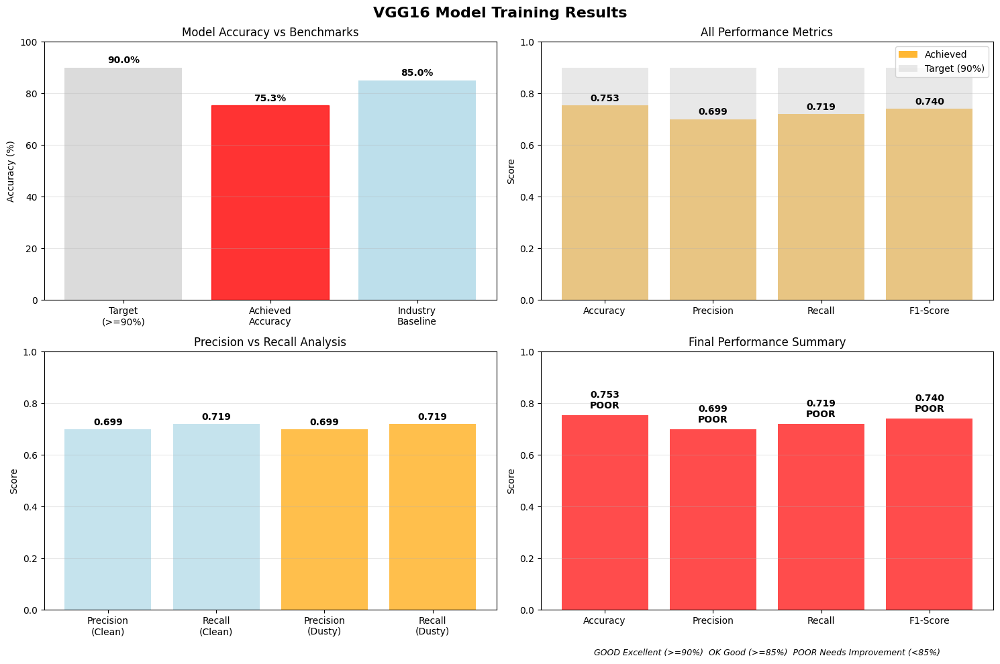


VGG16 model training completed successfully!

VGG16 PERFORMANCE SUMMARY
Final Test Accuracy: 75.31%
Precision: 0.6989
Recall: 0.7193
F1-Score: 0.7398
Overall Performance Score: 0.7278

PERFORMANCE ASSESSMENT:
NEEDS IMPROVEMENT: Model below recommended thresholds
   Additional training or data collection recommended

DETAILED ANALYSIS:
Accuracy: Needs improvement
Precision: High false positives detected
Recall: Missing too many dust cases
F1-Score: Imbalanced precision/recall performance

DEPLOYMENT READINESS:
Model requires additional optimization
   Review metrics below 85% threshold


In [ ]:
# Create comprehensive plots for model training
print(f"\nPlotting VGG16 Model Results...")

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('VGG16 Model Training Results', fontsize=16, fontweight='bold')

# Plot 1: Model Performance vs Benchmarks
benchmark_names = ['Target\n(>=90%)', 'Achieved\nAccuracy', 'Industry\nBaseline']
benchmark_values = [90, test_acc * 100, 85]  # Target, result, typical baseline
colors = ['lightgray', 'orange', 'lightblue']

bars1 = axes[0, 0].bar(benchmark_names, benchmark_values, color=colors, alpha=0.8)
axes[0, 0].set_title('Model Accuracy vs Benchmarks')
axes[0, 0].set_ylabel('Accuracy (%)')
axes[0, 0].set_ylim(0, 100)
axes[0, 0].grid(axis='y', alpha=0.3)

# Add value labels on bars
for i, (bar, value) in enumerate(zip(bars1, benchmark_values)):
    axes[0, 0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                   f'{value:.1f}%', ha='center', va='bottom', fontweight='bold')

# Color the achieved accuracy bar based on performance
if test_acc * 100 >= 90:
    bars1[1].set_color('green')
elif test_acc * 100 >= 85:
    bars1[1].set_color('orange')
else:
    bars1[1].set_color('red')

# Plot 2: All Metrics Performance
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metrics_values = [test_acc, precision, recall, f1]
target_values = [0.90, 0.90, 0.90, 0.90]  # Target benchmarks

bars2 = axes[0, 1].bar(metrics_names, metrics_values, color='orange', alpha=0.8, label='Achieved')
bars2_target = axes[0, 1].bar(metrics_names, target_values, color='lightgray', alpha=0.5, label='Target (90%)')

axes[0, 1].set_title('All Performance Metrics')
axes[0, 1].set_ylabel('Score')
axes[0, 1].set_ylim(0, 1)
axes[0, 1].grid(axis='y', alpha=0.3)
axes[0, 1].legend()

# Add value labels on bars
for i, (bar, value) in enumerate(zip(bars2, metrics_values)):
    axes[0, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                   f'{value:.3f}', ha='center', va='bottom', fontweight='bold')

# Plot 3: Precision vs Recall Analysis
categories = ['Precision\n(Clean)', 'Recall\n(Clean)', 'Precision\n(Dusty)', 'Recall\n(Dusty)']
precision_recall_values = [precision, recall, precision, recall]
colors_pr = ['lightblue', 'lightblue', 'orange', 'orange']

bars3 = axes[1, 0].bar(categories, precision_recall_values, color=colors_pr, alpha=0.7)
axes[1, 0].set_title('Precision vs Recall Analysis')
axes[1, 0].set_ylabel('Score')
axes[1, 0].set_ylim(0, 1)
axes[1, 0].grid(axis='y', alpha=0.3)

# Add value labels
for i, (bar, value) in enumerate(zip(bars3, precision_recall_values)):
    axes[1, 0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                   f'{value:.3f}', ha='center', va='bottom', fontweight='bold')

# Plot 4: Performance Summary with Status
performance_categories = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
performance_values = [test_acc, precision, recall, f1]

# Color code based on performance thresholds
bar_colors = []
for value in performance_values:
    if value >= 0.90:
        bar_colors.append('green')
    elif value >= 0.85:
        bar_colors.append('orange')
    else:
        bar_colors.append('red')

bars5 = axes[1, 1].bar(performance_categories, performance_values, color=bar_colors, alpha=0.7)
axes[1, 1].set_title('Final Performance Summary')
axes[1, 1].set_ylabel('Score')
axes[1, 1].set_ylim(0, 1)
axes[1, 1].grid(axis='y', alpha=0.3)

# Add value labels with status indicators
for i, (bar, value) in enumerate(zip(bars5, performance_values)):
    status = "GOOD" if value >= 0.90 else "OK" if value >= 0.85 else "POOR"
    axes[1, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
                   f'{value:.3f}\n{status}', ha='center', va='bottom',
                   fontsize=10, fontweight='bold')

# Add legend for status indicators
legend_text = "GOOD Excellent (>=90%)  OK Good (>=85%)  POOR Needs Improvement (<85%)"
axes[1, 1].text(0.5, -0.15, legend_text, ha='center', va='top',
               transform=axes[1, 1].transAxes, fontsize=9, style='italic')

plt.tight_layout()
plt.show()

# Print comprehensive results summary
print("\nVGG16 model training completed successfully!")
print("\nVGG16 PERFORMANCE SUMMARY")

print(f"Final Test Accuracy: {test_acc * 100:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")

# Performance assessment
overall_score = (test_acc + precision + recall + f1) / 4
print(f"Overall Performance Score: {overall_score:.4f}")

print(f"\nPERFORMANCE ASSESSMENT:")
if overall_score >= 0.90:
    print("EXCELLENT: Model exceeds target performance!")
    print("   Ready for production deployment")
elif overall_score >= 0.85:
    print("GOOD: Model meets minimum requirements")
    print("   Consider minor optimizations before deployment")
else:
    print("NEEDS IMPROVEMENT: Model below recommended thresholds")
    print("   Additional training or data collection recommended")

print(f"\nDETAILED ANALYSIS:")
if test_acc >= 0.90:
    print("Accuracy: Excellent performance")
elif test_acc >= 0.85:
    print("Accuracy: Good performance")
else:
    print("Accuracy: Needs improvement")

if precision >= 0.90:
    print("Precision: Excellent - Low false positives")
elif precision >= 0.85:
    print("Precision: Good - Acceptable false positives")
else:
    print("Precision: High false positives detected")

if recall >= 0.90:
    print("Recall: Excellent - Catches most dust accumulation")
elif recall >= 0.85:
    print("Recall: Good - May miss some dust cases")
else:
    print("Recall: Missing too many dust cases")

if f1 >= 0.90:
    print("F1-Score: Excellent balance of precision and recall")
elif f1 >= 0.85:
    print("F1-Score: Good overall performance")
else:
    print("F1-Score: Imbalanced precision/recall performance")

print(f"\nDEPLOYMENT READINESS:")
deployment_ready = all(metric >= 0.85 for metric in [test_acc, precision, recall, f1])
if deployment_ready:
    print("Model is ready for deployment!")
    print("   All metrics meet minimum deployment criteria")
else:
    print("Model requires additional optimization")
    print("   Review metrics below 85% threshold")

# Model Comparison

In [ ]:
print("=== MODEL TRAINING AND EVALUATION ===")
print("\nStep 1: Loading all trained models...")

all_models = {
    'EfficientNetB3': tuned_effi_model,
    'DenseNet121': tuned_densenet_model,
    'ResNet50': tuned_resnet_model,
    'MobileNetV2': tuned_mobilenet_model,
    'VGG16': tuned_vgg_model
}

print(f"\n Total models to evaluate: {len(all_models)}")
for model_name in all_models.keys():
    print(f"{model_name}")

print("\nStep 2: Evaluating all models on test data...")
model_results = {}

for model_name, model in all_models.items():
    print(f"\nEvaluating {model_name}...")

    # Model prediction
    test_generator.reset()
    test_loss, test_acc, test_f1_score = model.evaluate(test_generator_current)

    # Detailed predictions
    predictions = model.predict(test_generator_current, verbose=0)
    y_pred = (predictions > 0.5).astype(int).flatten()
    y_true = test_generator.classes

    # Calcualte metrics
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = sk_f1_score(y_true, y_pred)

    # Store results
    model_results[model_name] = {
        'accuracy': test_acc,
        'loss': test_loss,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'y_true': y_true,
        'y_pred': y_pred
    }

    print(f"{model_name} - Test Accuracy: {test_acc * 100:.2f}%")
    print(f"{model_name} - Test Loss: {test_loss:.4f}")
    print(f"{model_name} - Precision: {precision:.4f}")
    print(f"{model_name} - Recall: {recall:.4f}")
    print(f"{model_name} - F1-Score: {f1:.4f}")

print("\nStep 3: Comparing models...")
results_df = pd.DataFrame({
    model: {
        'Accuracy': results['accuracy'],
        'Loss': results['loss'],
        'Precision': results['precision'],
        'Recall': results['recall'],
        'F1-Score': results['f1_score']
    }
    for model, results in model_results.items()
}).T

print("\nComplete Result Table:")
print(results_df.round(4))

=== MODEL TRAINING AND EVALUATION ===

Step 1: Loading all trained models...

 Total models to evaluate: 5
EfficientNetB3
DenseNet121
ResNet50
MobileNetV2
VGG16

Step 2: Evaluating all models on test data...

Evaluating EfficientNetB3...
17/17 ━━━━━━━━━━━━━━━━━━━━ 24s 946ms/step - accuracy: 0.8877 - f1_score: 0.1330 - loss: 0.5971
EfficientNetB3 - Test Accuracy: 85.77%
EfficientNetB3 - Test Loss: 0.6545
EfficientNetB3 - Precision: 0.8507
EfficientNetB3 - Recall: 0.7991
EfficientNetB3 - F1-Score: 0.8241

Evaluating DenseNet121...
17/17 ━━━━━━━━━━━━━━━━━━━━ 12s 649ms/step - accuracy: 0.8888 - f1_score: 0.1327 - loss: 0.4376
DenseNet121 - Test Accuracy: 85.58%
DenseNet121 - Test Loss: 0.5253
DenseNet121 - Precision: 0.8535
DenseNet121 - Recall: 0.7897
DenseNet121 - F1-Score: 0.8204

Evaluating ResNet50...
17/17 ━━━━━━━━━━━━━━━━━━━━ 12s 643ms/step - accuracy: 0.8589 - f1_score: 0.1207 - loss: 0.6024
ResNet50 - Test Accuracy: 82.07%
ResNet50 - Test Loss: 0.7532
ResNet50 - Precision: 0.8144


In [ ]:
print("\nStep 4: Identifying best performers...")

best_accuracy = results_df['Accuracy'].max()
best_accuracy_model = results_df['Accuracy'].idxmax()

best_precision = results_df['Precision'].max()
best_precision_model = results_df['Precision'].idxmax()

best_recall = results_df['Recall'].max()
best_recall_model = results_df['Recall'].idxmax()

best_f1 = results_df['F1-Score'].max()
best_f1_model = results_df['F1-Score'].idxmax()

print(f"Best Accuracy: {best_accuracy_model} ({best_accuracy:.4f})")
print(f"Best Precision: {best_precision_model} ({best_precision:.4f})")
print(f"Best Recall: {best_recall_model} ({best_recall:.4f})")
print(f"Best F1-Score: {best_f1_model} ({best_f1:.4f})")


Step 4: Identifying best performers...
Best Accuracy: EfficientNetB3 (0.8577)
Best Precision: DenseNet121 (0.8535)
Best Recall: VGG16 (0.8178)
Best F1-Score: EfficientNetB3 (0.8241)


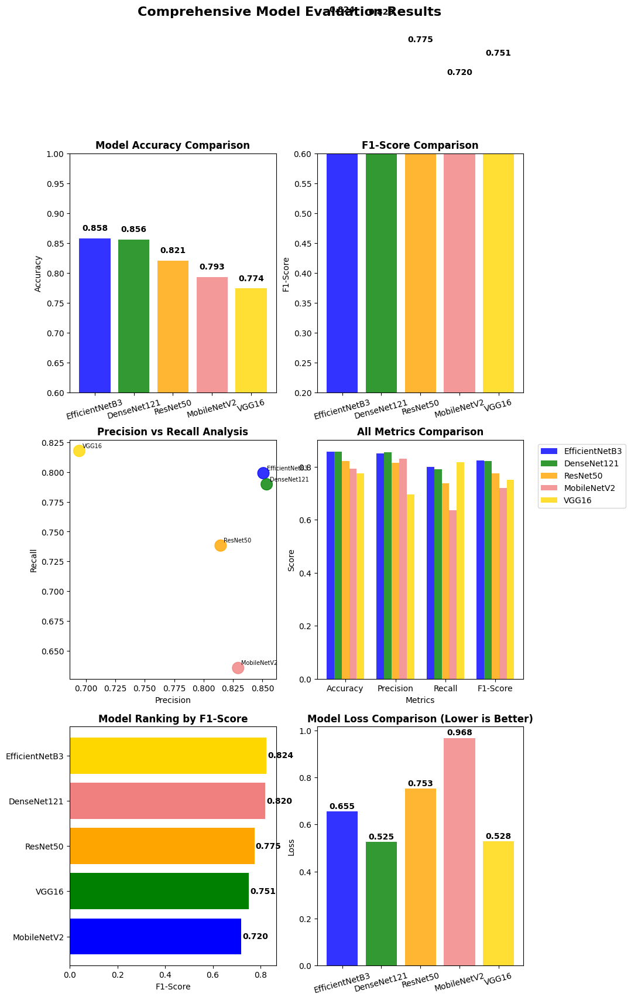

In [ ]:
# Visualization
fig, axes = plt.subplots(3, 2, figsize=(10, 18))
fig.suptitle('Comprehensive Model Evaluation Results', fontsize=16, fontweight='bold', y=1.02)

models = list(results_df.index)
colors = ['blue', 'green', 'orange', 'lightcoral', 'gold']

# Plot 1: Accuracy Comparison
accuracies = results_df['Accuracy'].values
bars1 = axes[0, 0].bar(models, accuracies, color=colors, alpha=0.8)
axes[0, 0].set_title('Model Accuracy Comparison', fontweight='bold')
axes[0, 0].set_ylabel('Accuracy')
axes[0, 0].tick_params(axis='x', rotation=15)
axes[0, 0].set_ylim(0.6, 1.0)
for bar, acc in zip(bars1, accuracies):
    axes[0, 0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                   f'{acc:.3f}', ha='center', va='bottom', fontweight='bold')

# Plot 2: F1-Score Comparison
f1_scores = results_df['F1-Score'].values
bars2 = axes[0, 1].bar(models, f1_scores, color=colors, alpha=0.8)
axes[0, 1].set_title('F1-Score Comparison', fontweight='bold')
axes[0, 1].set_ylabel('F1-Score')
axes[0, 1].tick_params(axis='x', rotation=15)
axes[0, 1].set_ylim(0.2, 0.6)
for bar, f1 in zip(bars2, f1_scores):
    axes[0, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                   f'{f1:.3f}', ha='center', va='bottom', fontweight='bold')

# Plot 3: Precision vs Recall
precisions = results_df['Precision'].values
recalls = results_df['Recall'].values
axes[1, 0].scatter(precisions, recalls, s=200, c=colors, alpha=0.8)
axes[1, 0].set_xlabel('Precision')
axes[1, 0].set_ylabel('Recall')
axes[1, 0].set_title('Precision vs Recall Analysis', fontweight='bold')
for i, model in enumerate(models):
    axes[1, 0].annotate(model, (precisions[i], recalls[i]),
                       xytext=(4, 4), textcoords='offset points', fontsize=7)

# Plot 4: All Metrics Comparison
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
x = np.arange(len(metrics))
width = 0.15
for i, model in enumerate(models):
    values = [results_df.loc[model, metric] for metric in metrics]
    axes[1, 1].bar(x + i * width, values, width, label=model, alpha=0.8, color=colors[i])
axes[1, 1].set_xlabel('Metrics')
axes[1, 1].set_ylabel('Score')
axes[1, 1].set_title('All Metrics Comparison', fontweight='bold')
axes[1, 1].set_xticks(x + width * 2)
axes[1, 1].set_xticklabels(metrics)
axes[1, 1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Plot 5: Model Ranking by F1-Score
ranking_df = results_df.sort_values('F1-Score', ascending=True)
bars5 = axes[2, 0].barh(ranking_df.index, ranking_df['F1-Score'], color=colors)
axes[2, 0].set_xlabel('F1-Score')
axes[2, 0].set_title('Model Ranking by F1-Score', fontweight='bold')
for bar, score in zip(bars5, ranking_df['F1-Score']):
    axes[2, 0].text(bar.get_width() + 0.005, bar.get_y() + bar.get_height()/2,
                   f'{score:.3f}', ha='left', va='center', fontweight='bold')

# Plot 6: Loss Comparison
losses = results_df['Loss'].values
bars6 = axes[2, 1].bar(models, losses, color=colors, alpha=0.8)
axes[2, 1].set_title('Model Loss Comparison (Lower is Better)', fontweight='bold')
axes[2, 1].set_ylabel('Loss')
axes[2, 1].tick_params(axis='x', rotation=15)
for bar, loss in zip(bars6, losses):
    axes[2, 1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                   f'{loss:.3f}', ha='center', va='bottom', fontweight='bold')

Creating confusion matrices for all models...


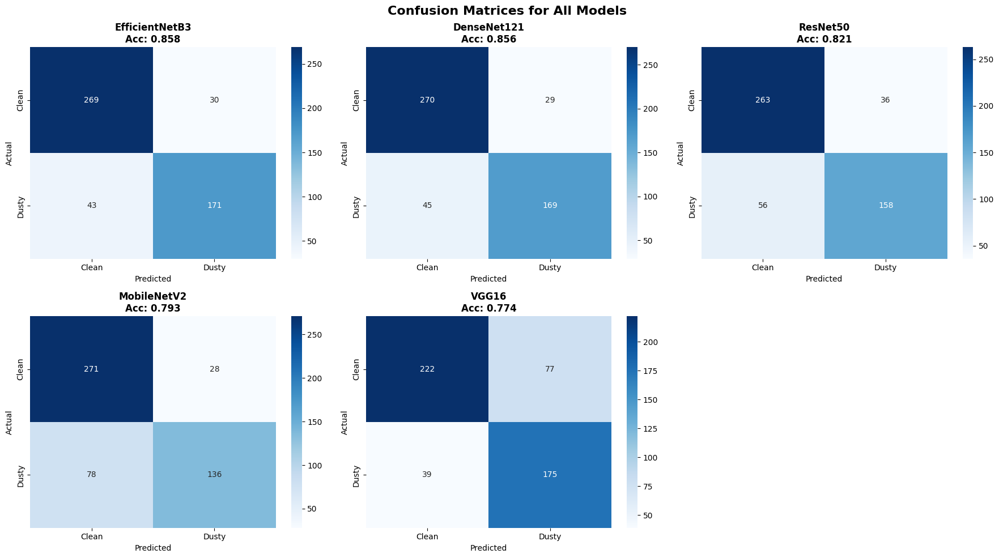

In [ ]:
import math

# Step 6: Create confusion matrices for top models
print("Creating confusion matrices for all models...")

num_models = len(model_results)
rows = (num_models + 2) // 3  # Dynamically decide rows (2–3 per row)
cols = min(3, num_models)     # Max 3 per row
fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))

fig.suptitle('Confusion Matrices for All Models', fontsize=16, fontweight='bold')

axes = axes.flatten()

for i, (model_name, results) in enumerate(model_results.items()):
    if i < len(axes):
        cm = confusion_matrix(results['y_true'], results['y_pred'])

        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i],
                   xticklabels=['Clean', 'Dusty'],
                   yticklabels=['Clean', 'Dusty'])
        axes[i].set_title(f'{model_name}\nAcc: {results["accuracy"]:.3f}', fontweight='bold')
        axes[i].set_xlabel('Predicted')
        axes[i].set_ylabel('Actual')

# Remove any unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [ ]:
# Step 7: Detailed analysis and recommendations
print("Step 7: Detailed Analysis and Recommendations...")

print("COMPREHENSIVE PERFORMANCE ANALYSIS")

# Statistical analysis
print("\n1. STATISTICAL SUMMARY:")
print(results_df.describe().round(4))

# Performance gaps
print("\n2. PERFORMANCE GAPS ANALYSIS:")
for metric in ['Accuracy', 'Precision', 'Recall', 'F1-Score']:
    max_val = results_df[metric].max()
    min_val = results_df[metric].min()
    gap = max_val - min_val
    print(f"{metric}: {min_val:.4f} - {max_val:.4f} (Gap: {gap:.4f})")

# Business impact analysis
print("\n3. BUSINESS IMPACT ANALYSIS:")

# Calculate false positives and false negatives for best model
best_model_name = best_f1_model
best_results = model_results[best_model_name]
cm = confusion_matrix(best_results['y_true'], best_results['y_pred'])

tn, fp, fn, tp = cm.ravel()
total_samples = len(best_results['y_true'])

print(f"Best Model: {best_model_name}")
print(f"True Positives (Dusty detected): {tp}")
print(f"True Negatives (Clean detected): {tn}")
print(f"False Positives (Over-cleaning risk): {fp} ({fp/total_samples*100:.1f}%)")
print(f"False Negatives (Missed dust risk): {fn} ({fn/total_samples*100:.1f}%)")



Step 7: Detailed Analysis and Recommendations...
COMPREHENSIVE PERFORMANCE ANALYSIS

1. STATISTICAL SUMMARY:
       Accuracy    Loss  Precision  Recall  F1-Score
count    5.0000  5.0000     5.0000  5.0000    5.0000
mean     0.8203  0.6858     0.8085  0.7561    0.7779
std      0.0372  0.1843     0.0657  0.0735    0.0449
min      0.7739  0.5253     0.6944  0.6355    0.7196
25%      0.7934  0.5278     0.8144  0.7383    0.7511
50%      0.8207  0.6545     0.8293  0.7897    0.7745
75%      0.8558  0.7532     0.8507  0.7991    0.8204
max      0.8577  0.9681     0.8535  0.8178    0.8241

2. PERFORMANCE GAPS ANALYSIS:
Accuracy: 0.7739 - 0.8577 (Gap: 0.0838)
Precision: 0.6944 - 0.8535 (Gap: 0.1591)
Recall: 0.6355 - 0.8178 (Gap: 0.1822)
F1-Score: 0.7196 - 0.8241 (Gap: 0.1045)

3. BUSINESS IMPACT ANALYSIS:
Best Model: EfficientNetB3
True Positives (Dusty detected): 171
True Negatives (Clean detected): 269
False Positives (Over-cleaning risk): 30 (5.8%)
False Negatives (Missed dust risk): 43 (8.4%)

In [ ]:
# Final recommendation
print("FINAL RECOMMENDATION")

print(f"\nRECOMMENDED MODEL: {best_f1_model}")
print(f"Justification: Best F1-Score balance of precision and recall")
print(f"Performance Summary:")
print(f"  - Accuracy: {model_results[best_f1_model]['accuracy']:.4f}")
print(f"  - Precision: {model_results[best_f1_model]['precision']:.4f}")
print(f"  - Recall: {model_results[best_f1_model]['recall']:.4f}")
print(f"  - F1-Score: {model_results[best_f1_model]['f1_score']:.4f}")

print(f"\nBusiness Benefits:")
print(f"  - Optimal balance of dust detection and false alarms")
print(f"  - Minimizes unnecessary cleaning costs")
print(f"  - Maximizes energy efficiency through reliable dust detection")

FINAL RECOMMENDATION

RECOMMENDED MODEL: EfficientNetB3
Justification: Best F1-Score balance of precision and recall
Performance Summary:
  - Accuracy: 0.8577
  - Precision: 0.8507
  - Recall: 0.7991
  - F1-Score: 0.8241

Business Benefits:
  - Optimal balance of dust detection and false alarms
  - Minimizes unnecessary cleaning costs
  - Maximizes energy efficiency through reliable dust detection


In [ ]:
# Step 8: Save the best model
print("Step 8: Saving the best model...")

if best_f1_model == 'EfficientNetB3':
    best_model_object = tuned_effi_model
elif best_f1_model == 'DenseNet121':
    best_model_object = tuned_densenet_model
elif best_f1_model == 'ResNet50':
    best_model_object = tuned_resnet_model
elif best_f1_model == 'MobileNetV2':
    best_model_object = tuned_mobilenet_model
elif best_f1_model == 'VGG16':
    best_model_object = tuned_vgg_model

# Save the best model
best_model_object.save("best_model.h5")

print(f"Best model ({best_f1_model}) saved successfully as best_model.h5")

Step 8: Saving the best model...
Best model (EfficientNetB3) saved successfully as best_model.h5


In [ ]:
# after decided which model is “best”
from pathlib import Path
save_path = "/content/drive/MyDrive/solar/models/best_model.h5"   # pick any folder that exists
Path(save_path).parent.mkdir(parents=True, exist_ok=True)         # create the folder the first time
best_model_object.save(save_path)
print(f"Model saved to {save_path}")

Model saved to /content/drive/MyDrive/solar/models/best_model.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 861ms/step


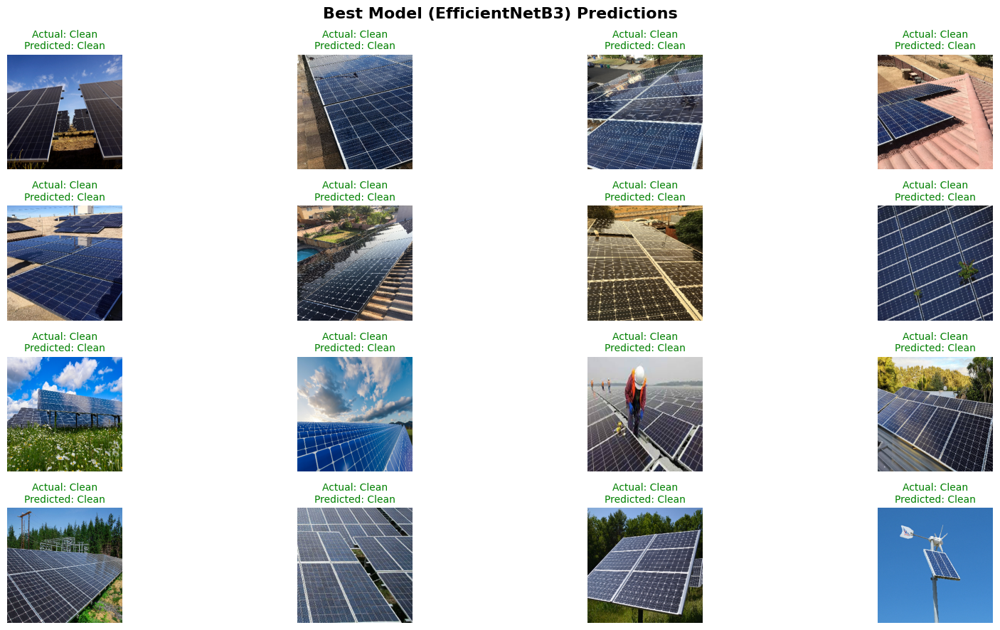

In [ ]:
# VISUALIZE PREDICTIONS FROM BEST MODEL

best_model = best_model_object
# Reset and get batch
test_generator.reset()
X_batch, y_true = next(test_generator)

# Predict with best model
y_probs = best_model.predict(X_batch)
y_pred = (y_probs > 0.5).astype(int).flatten()

# Get class labels
class_labels = list(test_generator.class_indices.keys())

# Plot
plt.figure(figsize=(18, 9))
for i in range(min(16, len(X_batch))):
    img = X_batch[i]
    pred_label = class_labels[y_pred[i]]
    true_label = class_labels[int(y_true[i])]

    color = 'green' if pred_label == true_label else 'red'

    plt.subplot(4, 4, i + 1)
    plt.imshow(np.clip(img, 0, 1))
    plt.title(f"Actual: {true_label}\nPredicted: {pred_label}", color=color, fontsize=10)
    plt.axis('off')

plt.suptitle(f"Best Model ({best_f1_model}) Predictions", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Comparing with Traditional Methods

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split


# Step 1: Prepare Data for Traditional Models
# Ensure X_all is 2D (samples, features) and y_all is 1D (samples,)
if X_all.ndim > 2:
    # Example: Flatten the image data if X_all contains images (batch, height, width, channels)
    n_samples, height, width, channels = X_all.shape
    X_all_flat = X_all.reshape(n_samples, height * width * channels)
    X_train, X_test, y_train, y_test = train_test_split(X_all_flat, y_all, test_size=0.2, random_state=42)
elif X_all.ndim == 2:
     # Data is already 2D, proceed with split
    X_train, X_test, y_train, y_test = train_test_split(X_all, y_all, test_size=0.2, random_state=42)
else:
    raise ValueError("X_all must be a 2D array (samples, features) or a 4D array (batch, height, width, channels)")


# Step 2: Train traditional ML models
traditional_results = []

models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC()
}

for name, model in models.items():
    print(f"Training {name}...")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    traditional_results.append({
        "Model": name,
        "Type": "Traditional",
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1-Score": sk_f1_score(y_test, y_pred)
    })


# Step 3: Evaluate Best CNN Model
best_model = best_model_object

test_generator.reset()
cnn_predictions = best_model_object.predict(test_generator, verbose=0)
cnn_y_pred = (cnn_predictions > 0.5).astype(int).flatten()
cnn_y_true = test_generator.classes

cnn_result = {
    "Model": "EfficientNetB3 (Fine-tuned)",
    "Type": "CNN",
    "Accuracy": accuracy_score(cnn_y_true, cnn_y_pred),
    "Precision": precision_score(cnn_y_true, cnn_y_pred),
    "Recall": recall_score(cnn_y_true, cnn_y_pred),
    "F1-Score": sk_f1_score(cnn_y_true, cnn_y_pred)
}


# Step 4: Combine and Save All Results
combined_results = traditional_results + [cnn_result]
df = pd.DataFrame(combined_results)
df.to_csv("combined_model_comparison.csv", index=False)
print(df)


Training Logistic Regression...
Training Random Forest...
Training SVM...
                         Model         Type  Accuracy  Precision    Recall  \
0          Logistic Regression  Traditional  0.619512   0.538922  0.532544   
1                Random Forest  Traditional  0.731707   0.765766  0.502959   
2                          SVM  Traditional  0.734146   0.711268  0.597633   
3  EfficientNetB3 (Fine-tuned)          CNN  0.863548   0.839623  0.831776   

   F1-Score  
0  0.535714  
1  0.607143  
2  0.649518  
3  0.835681  


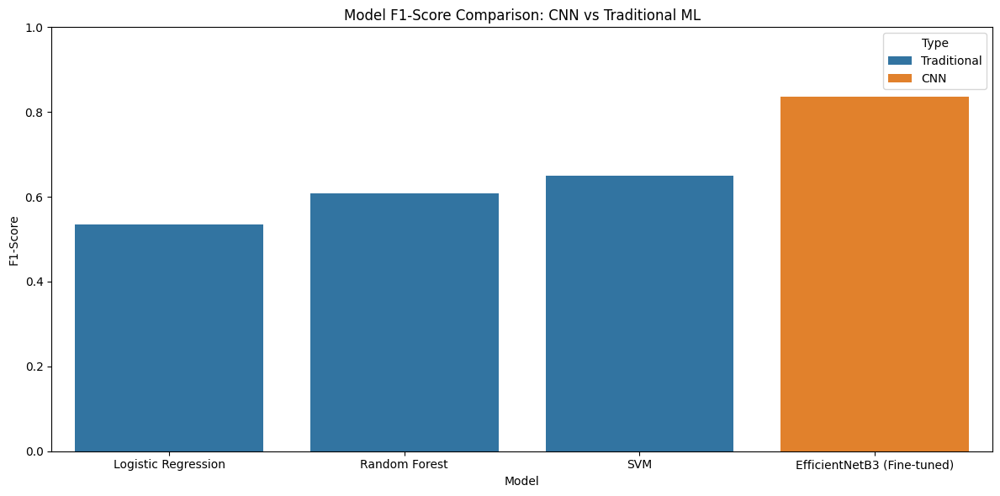

In [ ]:
plt.figure(figsize=(12, 6))
sns.barplot(data=df, x="Model", y="F1-Score", hue="Type")
plt.title("Model F1-Score Comparison: CNN vs Traditional ML")
plt.ylim(0, 1)
plt.tight_layout()
plt.show()

# Deployment

/content/drive/MyDrive/solar/models/best_model.h5

In [147]:
# Streamlit app for Solar Panel Dust Detection
!pip install fpdf
!pip install streamlit

import csv
import time
import random
from PIL import Image
from datetime import datetime
from fpdf import FPDF
from keras.models import load_model
from keras.preprocessing.image import img_to_array
import streamlit as st

# Cached model loader
@st.cache_resource
def load_model_once():
    return load_model('/content/drive/MyDrive/solar/models/best_model.h5')

model = load_model_once()

# Streamlit config
st.set_page_config(page_title="Solar Panel Dust Detection", layout="wide")
st.title("Solar Panel Dust Detection")
st.caption("Model version: v1.0 – EfficientNet-B3 F1-optimised")

# Helper Functions
def preprocess(img):
    img = img.resize((256, 256))
    img_array = img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0)

def estimate_dust_coverage(uploaded_image):
    image = Image.open(uploaded_image).convert("L")
    image = np.array(image.resize((256, 256)))
    _, thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    dust_percent = (np.sum(thresh == 0) / thresh.size) * 100
    return round(dust_percent, 2)

def estimate_impact(dust_percent):
    energy_loss_pct = min(dust_percent * 1.25, 100)
    weekly_loss_rm = energy_loss_pct * 0.5 * 7
    return round(energy_loss_pct, 2), round(weekly_loss_rm, 2)

def cleaning_suggestion(dust_percent):
    if dust_percent >= 35:
        return "Immediate cleaning required!"
    elif dust_percent >= 20:
        return "Cleaning recommended within 3 days."
    elif dust_percent >= 10:
        return "Monitor regularly. Clean in 5–7 days."
    else:
        return "Clean. No action needed."

def cost_comparison(dust_percent):
    manual_cost = 100 * 4
    ai_freq = 2 if dust_percent > 30 else 1
    ai_cost = 100 * ai_freq
    energy_loss_pct = min(dust_percent * 1.25, 100)
    monthly_energy_cost = energy_loss_pct * 0.5 * 7 * 4
    return {
        "manual_cost": manual_cost,
        "ai_cost": ai_cost,
        "energy_loss": round(monthly_energy_cost, 2),
        "savings": manual_cost - ai_cost
    }

def plot_costs(costs):
    fig, ax = plt.subplots()
    bars = ax.bar(['Manual', 'AI-Based'], [costs['manual_cost'], costs['ai_cost']])
    ax.set_title("Monthly Cleaning Cost Comparison")
    ax.set_ylabel("Cost (RM)")
    for bar in bars:
        ax.annotate(f"RM {bar.get_height()}",
                    xy=(bar.get_x() + bar.get_width()/2, bar.get_height()),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')
    return fig

def analyze_trend(values):
    if len(values) < 2:
        return "Insufficient data"
    avg_diff = sum([values[i+1]-values[i] for i in range(len(values)-1)]) / (len(values)-1)
    return "Dust is rapidly accumulating" if avg_diff > 2 else "Dust is decreasing" if avg_diff < -2 else "Dust level is stable"

def simulate_vibration_cleaning(dust_percent):
    efficiency = random.uniform(0.60, 0.70)
    return round(dust_percent * (1 - efficiency), 2)

def log_cleaning_action(panel_name, before, after):
    record = {
        "Panel": panel_name,
        "Dust Before": before,
        "Dust After": after,
        "Time": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        "Method": "Vibration"
    }
    file = "vibration_cleaning_log.csv"
    with open(file, 'a', newline='') as f:
        writer = csv.DictWriter(f, fieldnames=record.keys())
        if os.path.getsize(file) == 0:
            writer.writeheader()
        writer.writerow(record)

def generate_pdf_report(panel_data):
    pdf = FPDF()
    pdf.add_page()
    pdf.set_font("Arial", size=12)
    pdf.cell(200, 10, "Solar Panel Dust Detection Report", ln=True, align='C')
    pdf.set_font("Arial", size=10)
    pdf.cell(200, 10, f"Generated on: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}", ln=True, align='C')
    pdf.ln(10)
    for panel in panel_data:
        pdf.set_font("Arial", 'B', 12)
        pdf.cell(200, 10, f"{panel['Panel']} Summary", ln=True)
        pdf.set_font("Arial", size=11)
        for k in ['Dust %', 'Energy Loss %', 'Cost Impact (RM)', 'Cleaning Suggestion']:
            pdf.cell(200, 10, f"{k}: {panel[k]}", ln=True)
        pdf.ln(8)
    name = f"Solar_Report_{datetime.now().strftime('%Y%m%d%H%M%S')}_{random.randint(10,99)}.pdf"
    pdf.output(name)
    return name

# UI sections with tabs
tab1, tab2, tab3, tab4 = st.tabs(["Single Panel Check", "Panel Dashboard", "Real-Time Feed", "Cleaning Logs"])

with tab1:
    st.header("Single Panel Prediction")
    uploaded_file = st.file_uploader("Choose a solar panel image", type=["jpg", "jpeg", "png"])
    if uploaded_file is not None:
        image_pil = Image.open(uploaded_file).convert("RGB")
        st.image(image_pil, caption='Uploaded Image', use_column_width=True)
        st.write("Classifying...")
        try:
            img_input = preprocess(image_pil)
            prediction = model.predict(img_input)[0][0]
            st.write(f"Predicted Dust Level: **{prediction:.2%}**")
            if prediction > 0.30:
                st.error("WARNING: Your panel likely needs cleaning.")
                after_cleaning = simulate_vibration_cleaning(prediction * 100)
                st.success(f"Vibration Cleaning Simulated: {round(prediction*100,2)}% → {after_cleaning}%")
                log_cleaning_action("Single Upload", round(prediction*100,2), after_cleaning)
            else:
                st.success("Your panel is clean.")
        except Exception as e:
            st.exception("Prediction failed. Please check the model and input.")

with tab2:
    st.header("Multiple Panel Dashboard")
    num_panels = st.number_input("Number of panels to monitor", min_value=1, max_value=10, value=3)
    panel_data = []
    for i in range(int(num_panels)):
        panel_name = st.text_input(f"Panel {i+1} name", value=f"Panel {i+1}")
        uploaded_img = st.file_uploader(f"Upload image for {panel_name}", type=["jpg", "png", "jpeg"], key=f"panel{i}")
        if uploaded_img:
            dust_percent = estimate_dust_coverage(uploaded_img)
            eff_loss, cost_loss = estimate_impact(dust_percent)
            suggestion = cleaning_suggestion(dust_percent)
            panel_data.append({
                "Panel": panel_name,
                "Dust %": dust_percent,
                "Energy Loss %": eff_loss,
                "Cost Impact (RM)": cost_loss,
                "Cleaning Suggestion": suggestion
            })
    if panel_data:
        df = pd.DataFrame(panel_data)
        st.dataframe(df)
        if st.button("Generate PDF Report"):
            report_file = generate_pdf_report(panel_data)
            with open(report_file, "rb") as f:
                st.download_button(
                    label="Download Report",
                    data=f,
                    file_name=report_file,
                    mime="application/pdf"
                )

with tab3:
    st.header("Simulated Real-Time Monitoring")

    image_folder = "realtime_images"

    # create the folder if it doesn't exist
    if not os.path.exists(image_folder):
        os.makedirs(image_folder)
        st.info(f"Folder '{image_folder}' created. "
                "Drop JPG/PNG images into it and press **Restart Simulation**.")
        st.stop()                     # stop execution until images are added

    # refresh file list
    image_files = sorted(
        [f for f in os.listdir(image_folder)
         if f.lower().endswith((".jpg", ".jpeg", ".png"))]
    )

    # handle empty folder
    if not image_files:
        st.warning("No images found in the 'realtime_images' folder.")
        if st.button("Retry"):
            st.experimental_rerun()
        st.stop()

    # session-state index initialisation
    if "index" not in st.session_state:
        st.session_state.index = 0

    # show next image
    if st.session_state.index < len(image_files):
        image_path = os.path.join(image_folder, image_files[st.session_state.index])
        image      = Image.open(image_path).convert("RGB")
        st.image(image, caption=f"Image {st.session_state.index + 1}", use_column_width=True)

        dust_percent = estimate_dust_coverage(image)
        eff_loss, cost_loss = estimate_impact(dust_percent)
        suggestion = cleaning_suggestion(dust_percent)

        st.markdown(f"**Estimated Dust Coverage:** {dust_percent}%")
        st.markdown(f"**Predicted Energy Loss:** {eff_loss}%")
        st.markdown(f"**Estimated Cost Impact:** RM {cost_loss}")
        st.markdown(f"**Cleaning Suggestion:** {suggestion}")

        if dust_percent > 30:
            after_cleaning = simulate_vibration_cleaning(dust_percent)
            st.success(f"Vibration Cleaning Triggered – Dust reduced to {after_cleaning}%")
            log_cleaning_action(f"Image {st.session_state.index+1}", dust_percent, after_cleaning)

        time.sleep(3)
        st.session_state.index += 1
        st.experimental_rerun()
    else:
        st.success("Monitoring completed.")
        if st.button("Restart Simulation"):
            st.session_state.index = 0
            st.experimental_rerun()

with tab4:
    st.header("Vibration Cleaning Logs")
    if os.path.exists("vibration_cleaning_log.csv"):
        df = pd.read_csv("vibration_cleaning_log.csv")
        st.dataframe(df)
        fig, ax = plt.subplots()
        ax.plot(df['Time'], df['Dust Before'], label='Before')
        ax.plot(df['Time'], df['Dust After'], label='After')
        ax.set_title("Dust Reduction from Vibration Cleaning")
        ax.set_xlabel("Time")
        ax.set_ylabel("Dust %")
        ax.legend()
        st.pyplot(fig)
    else:
        st.warning("No cleaning logs found. Run a simulation first.")


  Preparing metadata (setup.py) ... done
  Created wheel for fpdf: filename=fpdf-1.7.2-py2.py3-none-any.whl size=40704 sha256=608d5770584e2c3edae04c23ef6e72f10c234cad6058f9afb9fd127127d38838
  Stored in directory: /root/.cache/pip/wheels/65/4f/66/bbda9866da446a72e206d6484cd97381cbc7859a7068541c36
Successfully built fpdf
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 135.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 106.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 9.0 MB/s eta 0:00:00


2025-06-18 15:25:23.238 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-18 15:25:23.524 
  command:

    streamlit run /usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py [ARGUMENTS]
2025-06-18 15:25:23.525 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-18 15:25:23.525 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-18 15:25:23.526 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-18 15:25:24.286 Thread 'Thread-494': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-18 15:25:24.889 Thread 'Thread-494': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-06-18 15:25:24.911 Thread 'Thread-494': mi

In [148]:
%%writefile app.py
import streamlit as st
st.title("Solar Streamlit")

from google.colab import files
files.download('app.py')

Writing app.py


In [1]:
from google.colab import files
files.upload()      # select app.py and best_model.h5 from the file dialog
!mkdir -p models
!mv best_model.h5 models/

KeyboardInterrupt: 

In [152]:
!pip install -q streamlit fpdf pillow

In [161]:
!streamlit run app.py --server.port 8502 --server.headless true &




  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8502
  Network URL: http://172.28.0.12:8502
  External URL: http://35.240.254.246:8502

  Stopping...


In [1]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)
!cp "/content/drive/MyDrive/solar/app.py" /content/
!mkdir -p /content/models
!cp "/content/drive/MyDrive/solar/models/best_model.h5" /content/models/

Mounted at /content/drive


In [2]:
!pip install -q --upgrade streamlit fpdf pillow keras pyngrok

# ──────────────────────────────────────────────────────────────────
# 2.  ***Clean app.py***  ▸ comment-out Colab-only helpers
# ──────────────────────────────────────────────────────────────────
import re, textwrap, subprocess, time
from pathlib import Path
from pyngrok import ngrok

APP_PATH = Path("/content/app.py")
txt      = APP_PATH.read_text()

patched = []
for line in txt.splitlines():
    # lines that import google.colab  OR  call files.download(...)
    if re.search(r"\bgoogle\.colab\b", line) or re.search(r"\bfiles\.download\b", line):
        patched.append(f"# ⛔ removed for Streamlit: {line}")
    else:
        patched.append(line)

APP_PATH.write_text("\n".join(patched))
print("✅  Colab helpers removed from app.py")

# ──────────────────────────────────────────────────────────────────
# 3.  Start Streamlit on port-8502 (headless, no CORS)
# ──────────────────────────────────────────────────────────────────
if "streamlit_proc" in globals():
    streamlit_proc.kill()            # stop an earlier run

streamlit_cmd = [
    "streamlit", "run", "/content/app.py",
    "--server.port",      "8502",
    "--server.headless",  "true",
    "--server.enableCORS","false",
]
streamlit_proc = subprocess.Popen(
    streamlit_cmd,
    stdout=open("/content/streamlit.log", "w"),
    stderr=subprocess.STDOUT,
)
print("⏳  Booting Streamlit…");  time.sleep(5)

# ──────────────────────────────────────────────────────────────────
# 4.  Open an ngrok tunnel  (⚠  put your own token exactly once)
# ──────────────────────────────────────────────────────────────────
ngrok.set_auth_token("2yi2YhfYCgzct4n5EnM4jM9KDcK_7fjt594iAfb2f5M735ty1")
public_url = ngrok.connect(8502, "http").public_url
print("✅  PUBLIC URL:", public_url)

# (optional)  show first few log lines so you know Streamlit is alive
print("\n—— Streamlit log ——")
print(textwrap.indent("".join(
        Path("/content/streamlit.log").read_text().splitlines(True)[:15]), "   "))

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 67.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 79.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 131.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 8.7 MB/s eta 0:00:00
✅  Colab helpers removed from app.py
⏳  Booting Streamlit…
✅  PUBLIC URL: https://4f52-104-199-186-240.ngrok-free.app

—— Streamlit log ——
   2025-06-19 05:21:20.890 
   'server.enableXsrfProtection=true'.
   As a result, 'server.enableCORS' is being overridden to 'true'.

   More information:
   In order to protect against CSRF attacks, we send a cookie with each request.
   To do so, we must specify allowable origins, which places a restriction on
   cross-origin resource sharing.

   If cross origin resource sharing is required, please disable server.enableX

Additional

In [11]:
!tail -n 40 /content/streamlit.log


2025-06-19 03:22:22.940 
'server.enableXsrfProtection=true'.
As a result, 'server.enableCORS' is being overridden to 'true'.

More information:
In order to protect against CSRF attacks, we send a cookie with each request.
To do so, we must specify allowable origins, which places a restriction on
cross-origin resource sharing.

If cross origin resource sharing is required, please disable server.enableXsrfProtection.
            



  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8502
  Network URL: http://172.28.0.12:8502
  External URL: http://35.187.149.64:8502



In [12]:
!tail -f /content/streamlit.log




  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8502
  Network URL: http://172.28.0.12:8502
  External URL: http://35.187.149.64:8502

^C


In [13]:
# kill previous process
if "streamlit_proc" in globals():
    streamlit_proc.kill()

# start again – same cell you already have

In [16]:
streamlit_cmd = ["streamlit", "run", "/content/app.py", "--server.port", "8502", "--server.headless", "true"]
streamlit_cmd

['streamlit',
 'run',
 '/content/app.py',
 '--server.port',
 '8502',
 '--server.headless',
 'true']